### Imports

In [15]:
import pandas as pd
from auto_ts import auto_timeseries
import dill
import talib
import numpy as np

In [16]:
# Evito que ciertas columnas se transformen a notacion cientifica en las predicciones
pd.set_option('display.float_format', lambda x: '%.2f' % x)
pd.set_option('display.max_columns', None)

### Dataset

In [17]:
columns = [
    'Open_time',
    'Open',
    'High',
    'Low',
    'Close',
    'Number of trades',
    'Close_BTCUSDT',
    'Volume_BTCUSDT',
    'Number_of_trades_BTCUSDT',
    'Close_ETHUSDT',
    'Volume_ETHUSDT',
    'Number_of_trades_ETHUSDT',
    'Close_BNBUSDT',
    'Volume_BNBUSDT',
    'Number_of_trades_BNBUSDT',
    'SMA_20',
    'EMA_20',
    'Upper_Band',
    'Middle_Band',
    'Lower_Band',
    'RSI',
    'buy_1000x_high_coinbase',
    'sell_1000x_high_coinbase',
    'total_trades_coinbase',	
    'Tweets_Utilizados',
    'Tweets_Utilizados_coin',
    'Tweets_Utilizados_referentes',
    'Tweets_Utilizados_whale_alert',
    'Buy_1000x_high',
    'sell_1000x_high',
    'total_trades_binance'
]
columns_to_model=[
    'Open',
    'High',
    'Low',
    'Close',
    'Number of trades',
    'Close_BTCUSDT',
    'Volume_BTCUSDT',
    'Number_of_trades_BTCUSDT',
    'Close_ETHUSDT',
    'Volume_ETHUSDT',
    'Number_of_trades_ETHUSDT',
    'Close_BNBUSDT',
    'Volume_BNBUSDT',
    'Number_of_trades_BNBUSDT',
    # 'SMA_20',
    # 'EMA_20',
    # 'Upper_Band',
    # 'Middle_Band',
    # 'Lower_Band',
    # 'RSI',
    'buy_1000x_high_coinbase',
    'sell_1000x_high_coinbase',
    'total_trades_coinbase',	
    'Tweets_Utilizados',
    'Tweets_Utilizados_coin',
    'Tweets_Utilizados_referentes',
    'Tweets_Utilizados_whale_alert',
    'Buy_1000x_high',
    'sell_1000x_high',
    'total_trades_binance'
]

In [18]:
dataset = pd.read_csv('/Users/mmarchetta/Desktop/Tesis-2024/data-visualization/final_dataset.csv') 
dataset['Open_time'] = pd.to_datetime(dataset['Open_time'])

In [19]:
display(dataset.head())

,Open_time,Open,High,Low,Close,Volume,Quote asset volume,Number of trades,Open_BTCUSDT,High_BTCUSDT,Low_BTCUSDT,Close_BTCUSDT,Volume_BTCUSDT,Quote_asset_volume_BTCUSDT,Number_of_trades_BTCUSDT,Open_ETHUSDT,High_ETHUSDT,Low_ETHUSDT,Close_ETHUSDT,Volume_ETHUSDT,Quote_asset_volume_ETHUSDT,Number_of_trades_ETHUSDT,Open_BNBUSDT,High_BNBUSDT,Low_BNBUSDT,Close_BNBUSDT,Volume_BNBUSDT,Quote_asset_volume_BNBUSDT,Number_of_trades_BNBUSDT,SMA_20,EMA_20,Upper_Band,Middle_Band,Lower_Band,RSI,MACD,Signal,ADX,SlowK,SlowD,CCI,ATR,MFI,buy_1000x_high_coinbase,sell_1000x_high_coinbase,total_trades_coinbase,Sentimiento,Tweets_Utilizados,Cantidad_pos,Cantidad_neg,Cantidad_neu,Compound total,Sentimiento_coin,Tweets_Utilizados_coin,Cantidad_pos_coin,Cantidad_neg_coin,Cantidad_neu_coin,Compound total coin,Sentimiento_referentes,Tweets_Utilizados_referentes,Cantidad_pos_referentes,Cantidad_neg_referentes,Cantidad_neu_referentes,Compound total referentes,Tweets_Utilizados_whale_alert,Buy_1000x_high,sell_1000x_high,total_trades_binance,Tendencia
0,2021-09-27,28.84,30.26,27.50,27.71,11094418.10,320340017.82,449178.00,43160.90,44350.00,42098.00,42147.35,39776.84,1728912299.80,1001487.00,3059.36,3164.94,2922.71,2925.59,510130.73,1564096695.37,1043885.00,344.00,357.60,335.00,335.50,956544.07,332372476.51,457187.00,31.85,30.83,38.30,31.85,25.39,44.11,0.02,0.96,21.20,24.79,33.78,-86.30,4.00,29.23,0.00,0.00,0.00,pos,139,61.00,28.00,50.00,17.83,pos,135,71.00,26.00,38.00,30.62,neu,1.00,0.00,0.00,1.00,0.00,81.00,525.00,364.00,270000.00,Lateral
1,2021-09-28,27.72,28.38,26.14,26.31,9784154.53,267560973.69,362304.00,42147.35,42787.38,40888.00,41026.54,43372.26,1816305387.84,1045389.00,2924.76,2970.82,2789.00,2804.91,511325.46,1477983245.67,928494.00,335.50,344.60,330.00,333.00,922077.23,310828343.70,417006.00,31.77,30.40,38.44,31.77,25.11,41.83,-0.33,0.70,21.98,16.10,24.47,-109.46,3.88,19.19,4.00,2.00,5273.00,pos,93,40.00,21.00,32.00,10.18,pos,122,57.00,23.00,42.00,19.89,neu,2.00,1.00,1.00,0.00,0.02,87.00,472.00,331.00,204000.00,Bajista
2,2021-09-29,26.31,28.59,26.11,27.28,10207287.33,280535376.38,376232.00,41025.01,42590.00,40753.88,41524.28,33511.53,1399625476.06,884909.00,2805.15,2950.00,2782.00,2850.45,411305.09,1180681056.16,748804.00,332.90,375.40,331.20,367.70,1696420.04,612547661.88,653011.00,31.65,30.10,38.55,31.65,24.74,43.99,-0.52,0.46,22.61,12.88,17.92,-92.93,3.78,23.82,22.00,40.00,54144.00,pos,112,61.00,19.00,32.00,23.13,pos,145,71.00,20.00,54.00,30.30,neu,0.00,0.00,0.00,0.00,0.00,64.00,594.00,495.00,216000.00,Alcista
3,2021-09-30,27.28,28.99,27.13,28.62,8201551.44,230622998.43,339737.00,41524.29,44141.37,41410.17,43824.10,46381.23,2005486003.56,1197815.00,2850.45,3048.42,2837.19,3000.61,506896.76,1514341937.31,992243.00,367.70,388.80,366.40,387.50,1163674.21,439628574.42,551245.00,31.62,29.96,38.56,31.62,24.67,46.92,-0.56,0.26,22.99,16.42,15.13,-60.03,3.64,28.34,15.00,23.00,39220.00,pos,116,46.00,28.00,42.00,7.68,pos,147,73.00,26.00,48.00,30.90,pos,2.00,1.00,0.00,1.00,0.75,77.00,419.00,464.00,202000.00,Alcista
4,2021-10-01,28.61,32.33,28.50,31.94,13176348.21,402700970.65,735059.00,43820.01,48495.00,43283.03,48141.61,66244.87,3076094886.59,1771237.00,3000.62,3330.00,2969.07,3309.91,648714.62,2063112280.67,1446386.00,387.50,423.40,381.50,421.50,1440336.04,584311192.72,727854.00,31.64,30.15,38.58,31.64,24.69,53.42,-0.31,0.14,21.86,34.90,21.40,34.17,3.65,35.02,24.00,35.00,63183.00,pos,171,72.00,21.00,78.00,30.72,pos,141,70.00,18.00,53.00,30.43,pos,1.00,1.00,0.00,0.00,0.82,71.00,477.00,664.00,492000.00,Alcista


In [20]:
n_days_to_predict = 10

dates = dataset['Open_time'][:-n_days_to_predict]

dataset = dataset.round(2)

feature_dataset = dataset[columns]
# feature_dataset['Open_time'] = dataset['Open_time']
# feature_dataset.set_index('Open_time', inplace=True)

validation = feature_dataset[-n_days_to_predict:]
feature_dataset = feature_dataset[:-n_days_to_predict]

In [21]:
display(feature_dataset.head())
print(feature_dataset.shape)

display(validation.head())
display(validation.shape)

,Open_time,Open,High,Low,Close,Number of trades,Close_BTCUSDT,Volume_BTCUSDT,Number_of_trades_BTCUSDT,Close_ETHUSDT,Volume_ETHUSDT,Number_of_trades_ETHUSDT,Close_BNBUSDT,Volume_BNBUSDT,Number_of_trades_BNBUSDT,SMA_20,EMA_20,Upper_Band,Middle_Band,Lower_Band,RSI,buy_1000x_high_coinbase,sell_1000x_high_coinbase,total_trades_coinbase,Tweets_Utilizados,Tweets_Utilizados_coin,Tweets_Utilizados_referentes,Tweets_Utilizados_whale_alert,Buy_1000x_high,sell_1000x_high,total_trades_binance
0,2021-09-27,28.84,30.26,27.50,27.71,449178.00,42147.35,39776.84,1001487.00,2925.59,510130.73,1043885.00,335.50,956544.07,457187.00,31.85,30.83,38.30,31.85,25.39,44.11,0.00,0.00,0.00,139,135,1.00,81.00,525.00,364.00,270000.00
1,2021-09-28,27.72,28.38,26.14,26.31,362304.00,41026.54,43372.26,1045389.00,2804.91,511325.46,928494.00,333.00,922077.23,417006.00,31.77,30.40,38.44,31.77,25.11,41.83,4.00,2.00,5273.00,93,122,2.00,87.00,472.00,331.00,204000.00
2,2021-09-29,26.31,28.59,26.11,27.28,376232.00,41524.28,33511.53,884909.00,2850.45,411305.09,748804.00,367.70,1696420.04,653011.00,31.65,30.10,38.55,31.65,24.74,43.99,22.00,40.00,54144.00,112,145,0.00,64.00,594.00,495.00,216000.00
3,2021-09-30,27.28,28.99,27.13,28.62,339737.00,43824.10,46381.23,1197815.00,3000.61,506896.76,992243.00,387.50,1163674.21,551245.00,31.62,29.96,38.56,31.62,24.67,46.92,15.00,23.00,39220.00,116,147,2.00,77.00,419.00,464.00,202000.00
4,2021-10-01,28.61,32.33,28.50,31.94,735059.00,48141.61,66244.87,1771237.00,3309.91,648714.62,1446386.00,421.50,1440336.04,727854.00,31.64,30.15,38.58,31.64,24.69,53.42,24.00,35.00,63183.00,171,141,1.00,71.00,477.00,664.00,492000.00


(946, 31)


,Open_time,Open,High,Low,Close,Number of trades,Close_BTCUSDT,Volume_BTCUSDT,Number_of_trades_BTCUSDT,Close_ETHUSDT,Volume_ETHUSDT,Number_of_trades_ETHUSDT,Close_BNBUSDT,Volume_BNBUSDT,Number_of_trades_BNBUSDT,SMA_20,EMA_20,Upper_Band,Middle_Band,Lower_Band,RSI,buy_1000x_high_coinbase,sell_1000x_high_coinbase,total_trades_coinbase,Tweets_Utilizados,Tweets_Utilizados_coin,Tweets_Utilizados_referentes,Tweets_Utilizados_whale_alert,Buy_1000x_high,sell_1000x_high,total_trades_binance
946,2024-04-30,6.59,6.67,6.04,6.42,115512.00,60672.00,54947.66,1985671.00,3014.05,561717.49,1292873.00,578.40,766513.45,486465.00,6.93,7.13,7.80,6.93,6.05,34.18,51.00,55.00,48709.00,142,187,1.00,23.00,379.00,377.00,70000.00
947,2024-05-01,6.42,6.94,6.13,6.90,175570.00,58364.97,81166.47,2401089.00,2972.46,624963.78,1365039.00,561.80,669027.32,427425.00,6.85,7.11,7.41,6.85,6.29,43.30,42.00,50.00,83718.00,130,177,0.00,36.00,327.00,340.00,107000.00
948,2024-05-02,6.90,7.41,6.69,7.27,109002.00,59060.61,47583.82,1572898.00,2986.19,365939.72,880167.00,560.50,359794.32,250921.00,6.85,7.12,7.42,6.85,6.29,49.27,87.00,57.00,61208.00,461,374,1.00,25.00,270.00,282.00,71000.00
949,2024-05-03,7.27,7.39,7.00,7.24,109634.00,62882.01,43628.40,1558661.00,3102.61,355825.84,859542.00,587.00,342906.43,257575.00,6.90,7.14,7.44,6.90,6.35,48.86,52.00,40.00,46255.00,573,474,1.00,22.00,386.00,635.00,69000.00
950,2024-05-04,7.24,7.28,7.10,7.12,71120.00,63892.04,24368.69,1113509.00,3117.23,196263.95,575026.00,585.70,197129.25,210303.00,6.91,7.13,7.46,6.91,6.36,46.98,68.00,50.00,34251.00,407,472,0.00,14.00,203.00,232.00,49000.00


(10, 31)

### Models

#### Generacion de los modelos

Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (946, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+------------------------------+
|        Test Statistic       |     -1.7672009258687067      |
|           p-value           |      0.3968627578993318      |
|          #Lags Used         |             0.0              |
| Number of Observations Used |            945.0             |
|     Critical Value (1%)     |

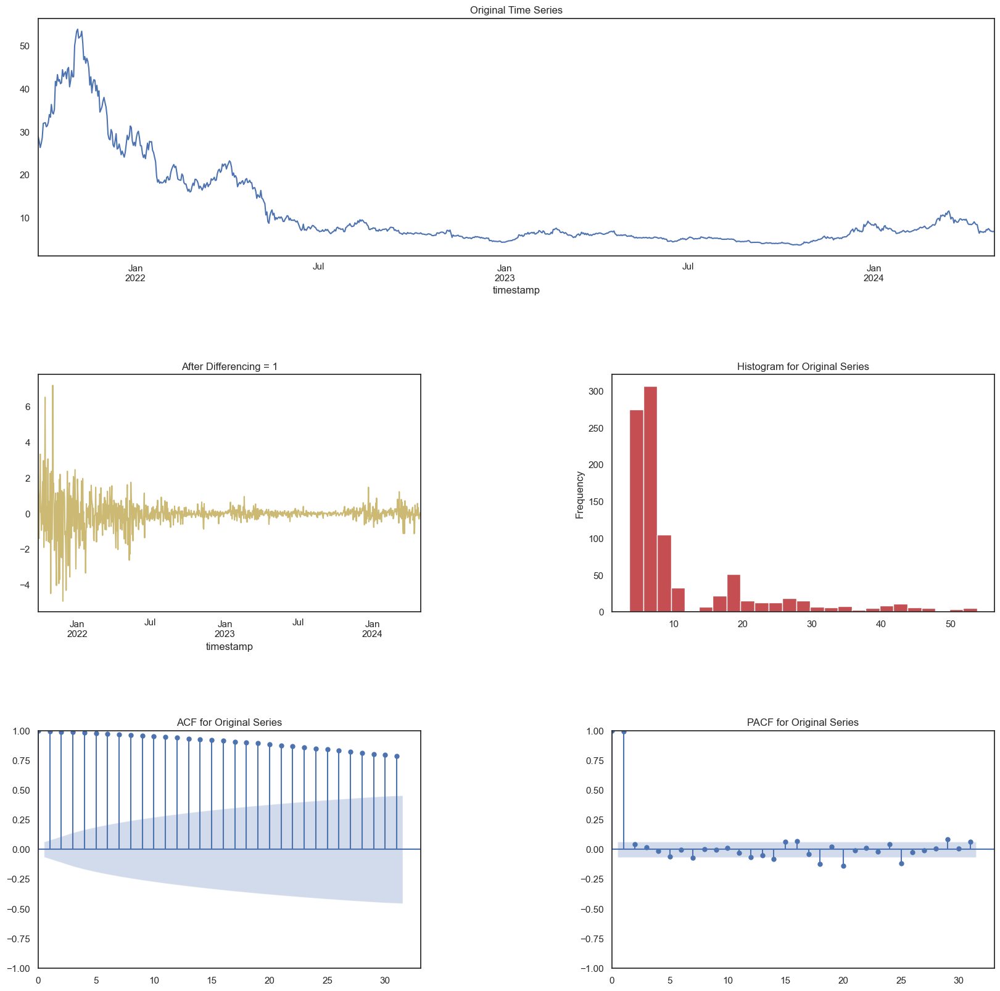

13:47:20 - cmdstanpy - INFO - Chain [1] start processing


Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 10, 'cv': 10}
    Fit-Predict data (shape=(946, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 921 Test Shape: 5


13:47:20 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 3.36
    Std Deviation of actuals = 0.23
    Normalized RMSE (as pct of std dev) = 1436%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 926 Test Shape: 5


13:47:21 - cmdstanpy - INFO - Chain [1] start processing
13:47:21 - cmdstanpy - INFO - Chain [1] done processing
13:47:22 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 4.44
    Std Deviation of actuals = 0.87
    Normalized RMSE (as pct of std dev) = 513%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 931 Test Shape: 5


13:47:22 - cmdstanpy - INFO - Chain [1] done processing
13:47:23 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 4.51
    Std Deviation of actuals = 0.09
    Normalized RMSE (as pct of std dev) = 4852%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 936 Test Shape: 5


13:47:23 - cmdstanpy - INFO - Chain [1] done processing
13:47:23 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 3.68
    Std Deviation of actuals = 0.26
    Normalized RMSE (as pct of std dev) = 1414%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 941 Test Shape: 5


13:47:23 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 2.52
    Std Deviation of actuals = 0.07
    Normalized RMSE (as pct of std dev) = 3530%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 3.68
    MSE (Mean Squared Error = 14.24
    MAPE (Mean Absolute Percent Error) = 50%
    RMSE (Root Mean Squared Error) = 3.7739
    Normalized RMSE (MinMax) = 142%
    Normalized RMSE (as Std Dev of Actuals)= 449%
Time Taken = 5 seconds


13:47:24 - cmdstanpy - INFO - Chain [1] start processing
13:47:25 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 3.70


--------------------------------------------------
Total time taken: 8 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name  rmse
0  Prophet  3.70
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (946, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+-------------------

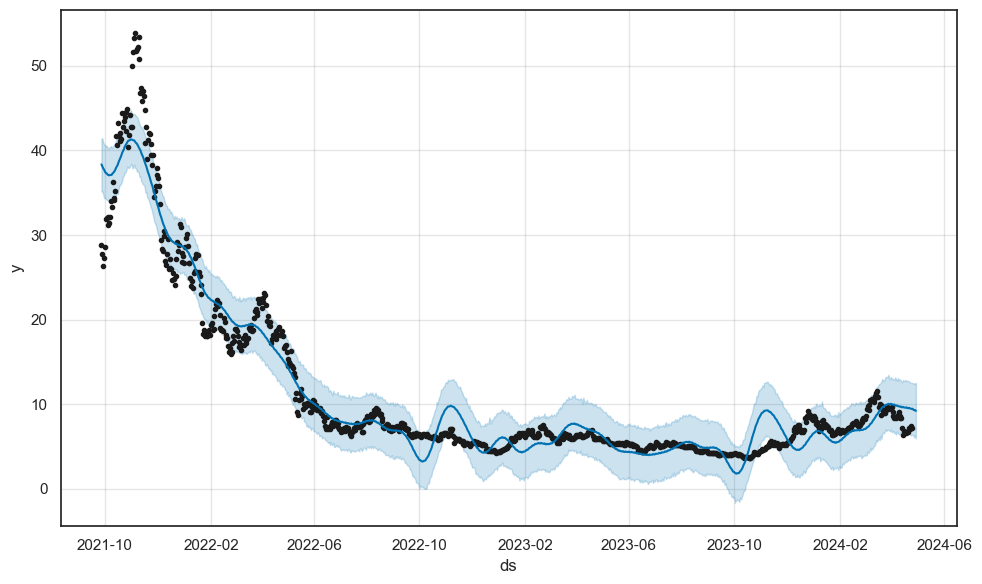

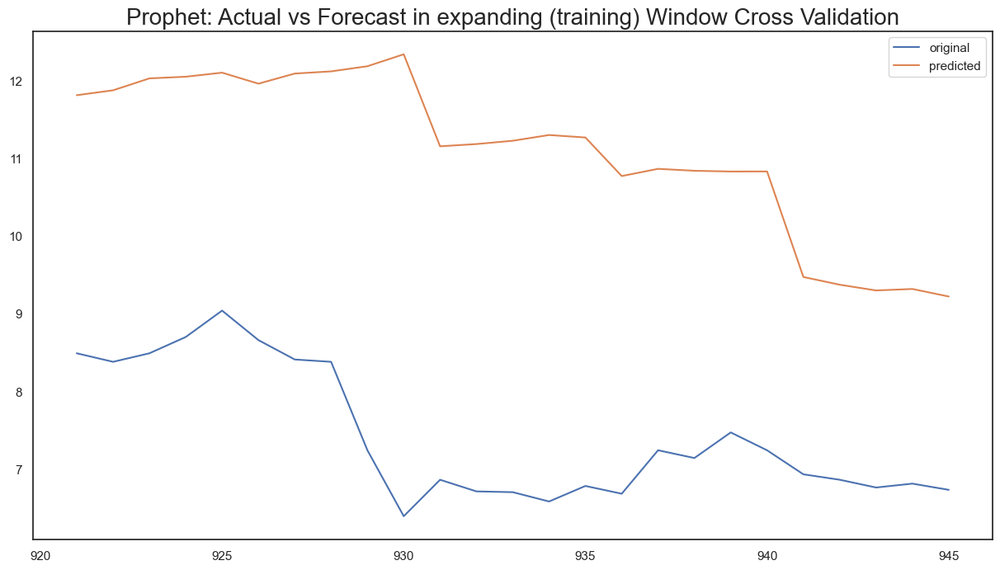

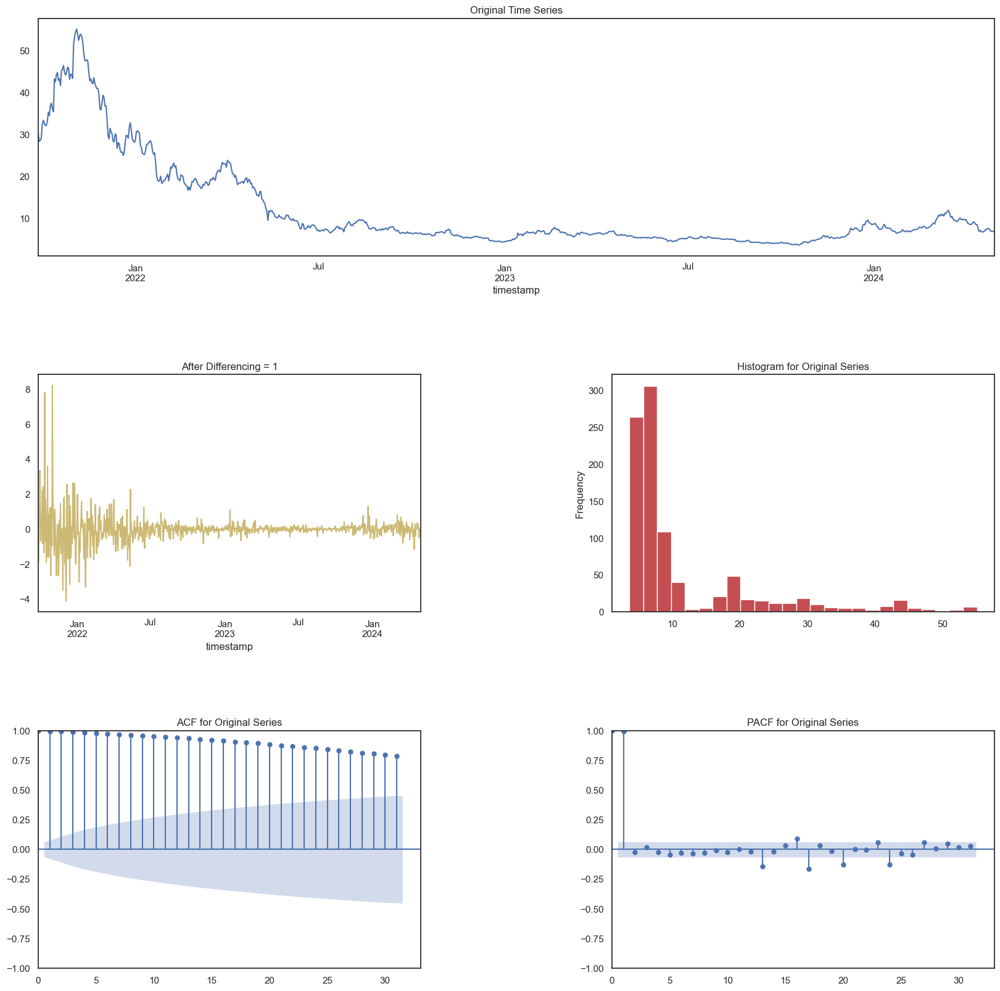

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 10, 'cv': 10}
    Fit-Predict data (shape=(946, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 921 Test Shape: 5


13:47:30 - cmdstanpy - INFO - Chain [1] start processing
13:47:30 - cmdstanpy - INFO - Chain [1] done processing
13:47:31 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 4.17
    Std Deviation of actuals = 0.26
    Normalized RMSE (as pct of std dev) = 1575%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 926 Test Shape: 5


13:47:31 - cmdstanpy - INFO - Chain [1] done processing
13:47:32 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 4.03
    Std Deviation of actuals = 0.72
    Normalized RMSE (as pct of std dev) = 558%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 931 Test Shape: 5


13:47:32 - cmdstanpy - INFO - Chain [1] done processing
13:47:32 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 4.50
    Std Deviation of actuals = 0.16
    Normalized RMSE (as pct of std dev) = 2885%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 936 Test Shape: 5


13:47:33 - cmdstanpy - INFO - Chain [1] done processing
13:47:33 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 3.80
    Std Deviation of actuals = 0.13
    Normalized RMSE (as pct of std dev) = 2977%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 941 Test Shape: 5


13:47:33 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 3.98
    Std Deviation of actuals = 0.06
    Normalized RMSE (as pct of std dev) = 6487%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 4.08
    MSE (Mean Squared Error = 16.81
    MAPE (Mean Absolute Percent Error) = 54%
    RMSE (Root Mean Squared Error) = 4.1001
    Normalized RMSE (MinMax) = 174%
    Normalized RMSE (as Std Dev of Actuals)= 501%
Time Taken = 4 seconds


13:47:34 - cmdstanpy - INFO - Chain [1] start processing
13:47:34 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 4.09


--------------------------------------------------
Total time taken: 10 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name  rmse
0  Prophet  4.09
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (946, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+------------------

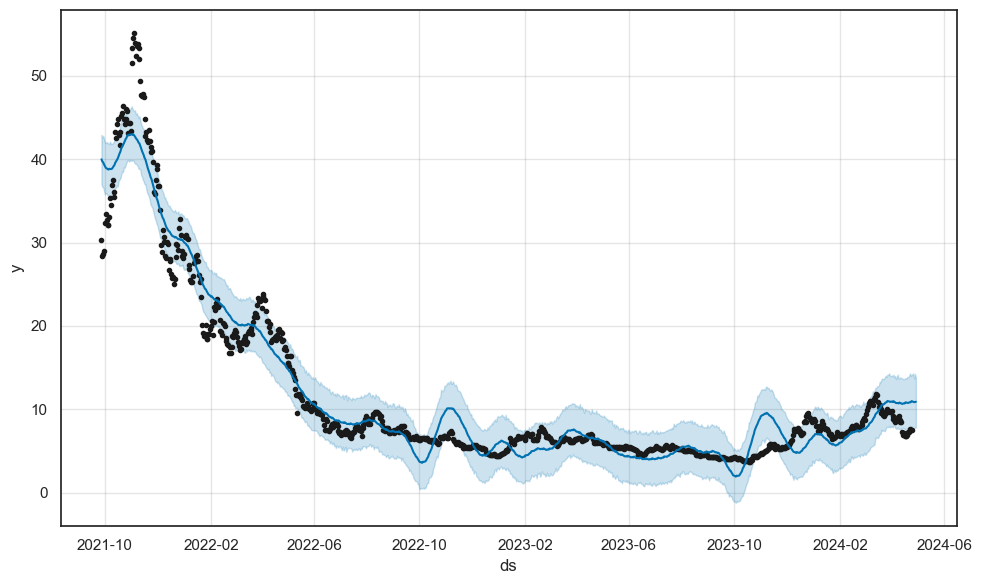

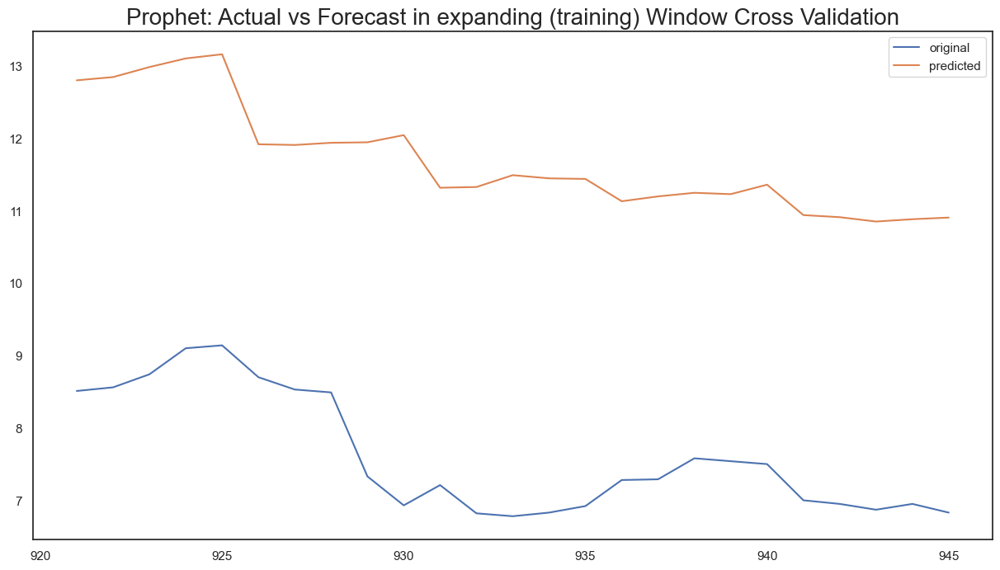

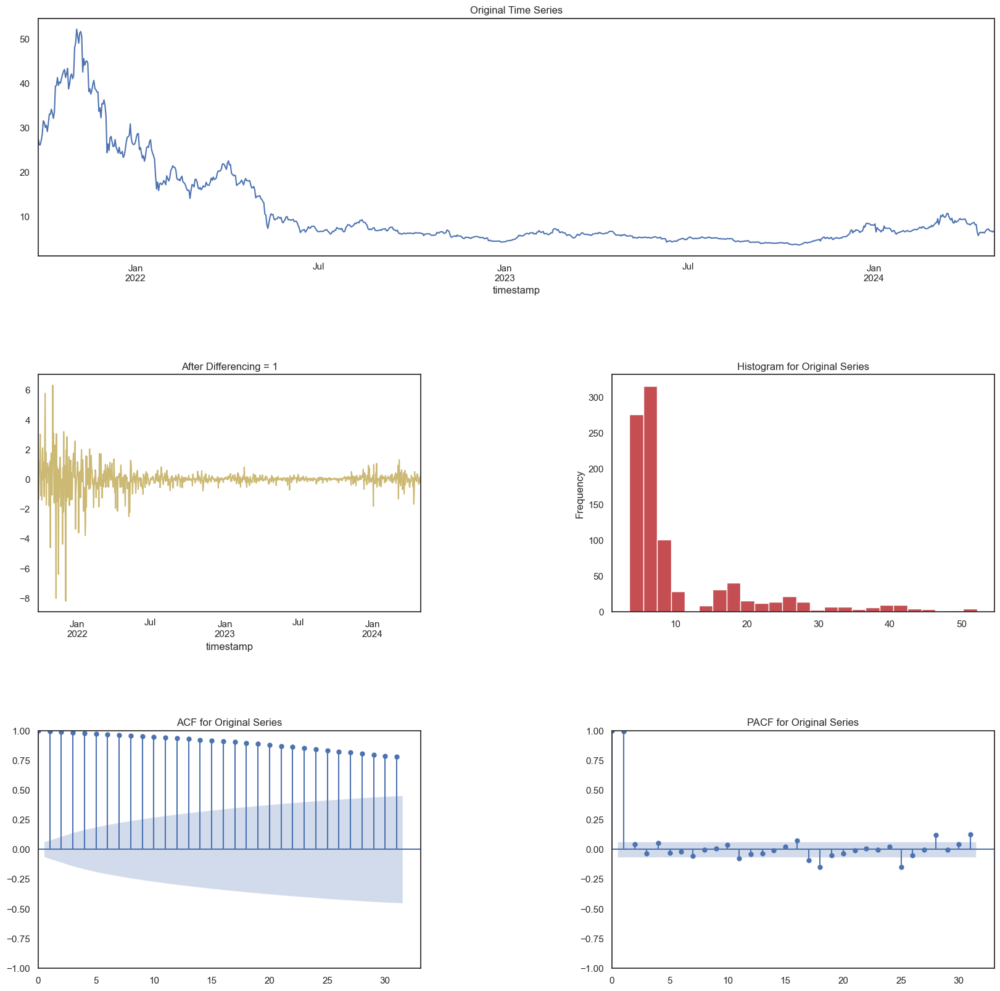

13:47:39 - cmdstanpy - INFO - Chain [1] start processing


Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 10, 'cv': 10}
    Fit-Predict data (shape=(946, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 921 Test Shape: 5


13:47:39 - cmdstanpy - INFO - Chain [1] done processing
13:47:40 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 2.71
    Std Deviation of actuals = 0.20
    Normalized RMSE (as pct of std dev) = 1385%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 926 Test Shape: 5


13:47:40 - cmdstanpy - INFO - Chain [1] done processing
13:47:41 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 4.52
    Std Deviation of actuals = 1.02
    Normalized RMSE (as pct of std dev) = 441%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 931 Test Shape: 5


13:47:41 - cmdstanpy - INFO - Chain [1] done processing
13:47:41 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 4.21
    Std Deviation of actuals = 0.06
    Normalized RMSE (as pct of std dev) = 6646%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 936 Test Shape: 5


13:47:42 - cmdstanpy - INFO - Chain [1] done processing
13:47:42 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 2.65
    Std Deviation of actuals = 0.20
    Normalized RMSE (as pct of std dev) = 1308%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 941 Test Shape: 5


13:47:42 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 2.89
    Std Deviation of actuals = 0.10
    Normalized RMSE (as pct of std dev) = 2786%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 3.36
    MSE (Mean Squared Error = 12.19
    MAPE (Mean Absolute Percent Error) = 49%
    RMSE (Root Mean Squared Error) = 3.4915
    Normalized RMSE (MinMax) = 119%
    Normalized RMSE (as Std Dev of Actuals)= 399%
Time Taken = 4 seconds


13:47:43 - cmdstanpy - INFO - Chain [1] start processing
13:47:43 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 3.40


--------------------------------------------------
Total time taken: 9 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name  rmse
0  Prophet  3.40
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (946, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+-------------------

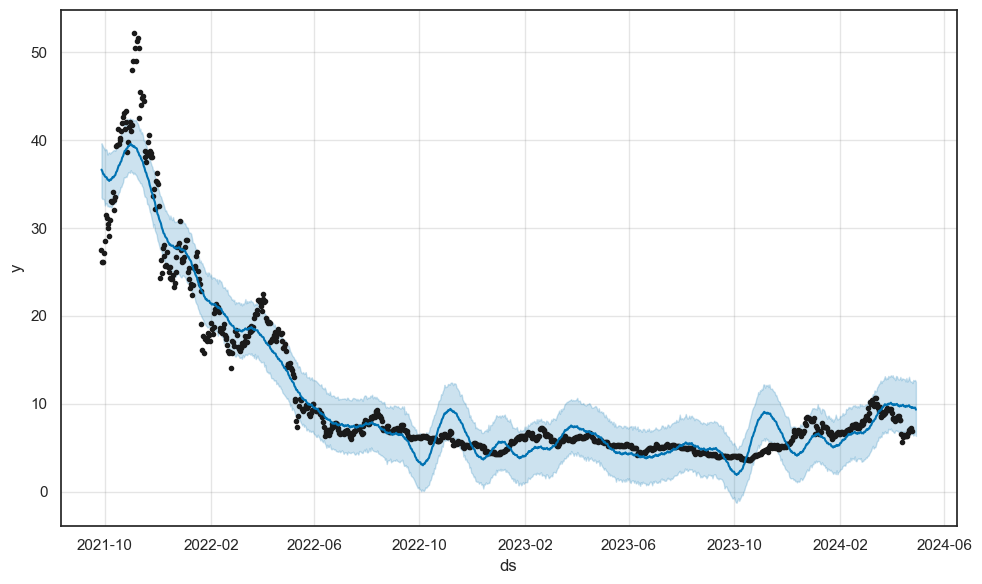

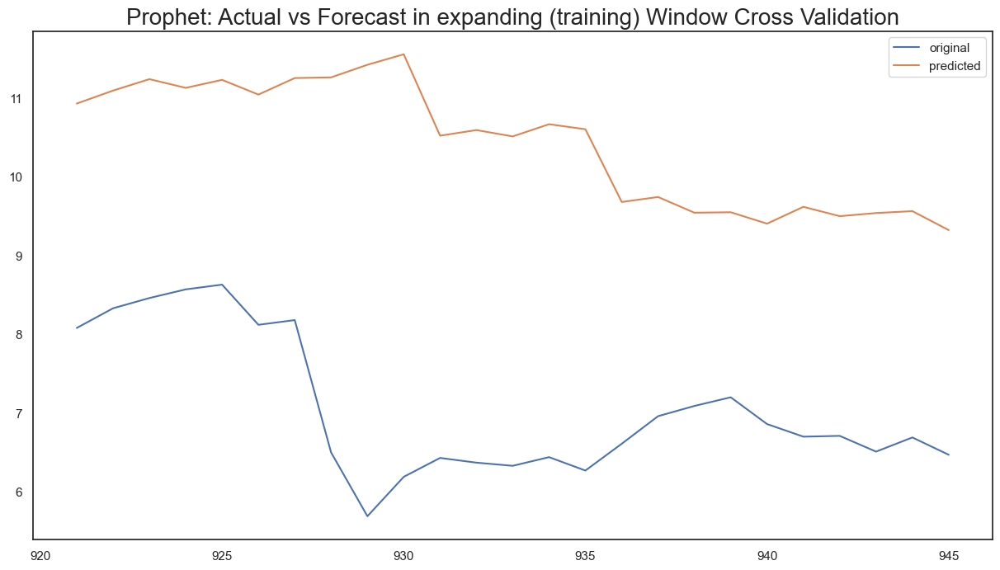

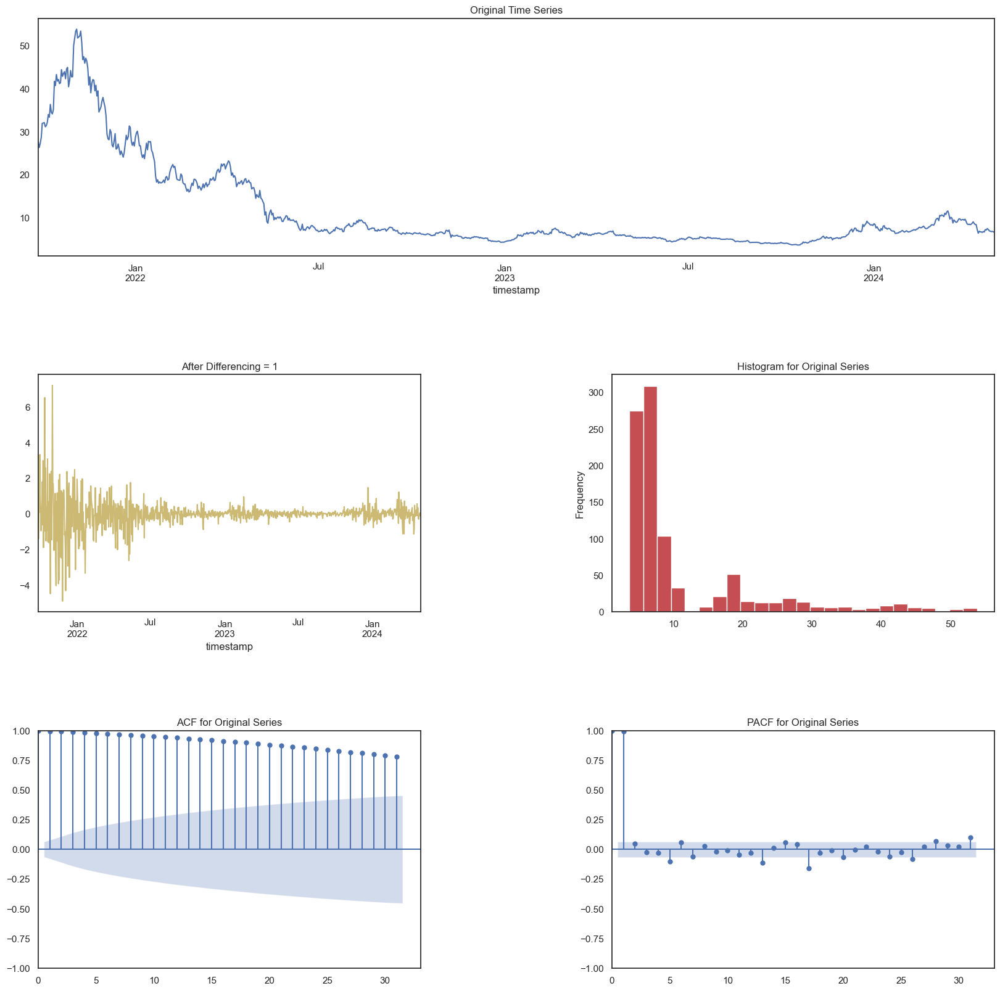

13:47:47 - cmdstanpy - INFO - Chain [1] start processing


Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 10, 'cv': 10}
    Fit-Predict data (shape=(946, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 921 Test Shape: 5


13:47:47 - cmdstanpy - INFO - Chain [1] done processing
13:47:48 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 3.33
    Std Deviation of actuals = 0.22
    Normalized RMSE (as pct of std dev) = 1480%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 926 Test Shape: 5


13:47:48 - cmdstanpy - INFO - Chain [1] done processing
13:47:48 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 4.50
    Std Deviation of actuals = 0.81
    Normalized RMSE (as pct of std dev) = 554%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 931 Test Shape: 5


13:47:48 - cmdstanpy - INFO - Chain [1] done processing
13:47:49 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 4.02
    Std Deviation of actuals = 0.06
    Normalized RMSE (as pct of std dev) = 6232%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 936 Test Shape: 5


13:47:49 - cmdstanpy - INFO - Chain [1] done processing
13:47:50 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 3.01
    Std Deviation of actuals = 0.17
    Normalized RMSE (as pct of std dev) = 1725%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 941 Test Shape: 5


13:47:50 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 3.72
    Std Deviation of actuals = 0.09
    Normalized RMSE (as pct of std dev) = 4074%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 3.70
    MSE (Mean Squared Error = 14.10
    MAPE (Mean Absolute Percent Error) = 51%
    RMSE (Root Mean Squared Error) = 3.7547
    Normalized RMSE (MinMax) = 142%
    Normalized RMSE (as Std Dev of Actuals)= 454%
Time Taken = 4 seconds


13:47:50 - cmdstanpy - INFO - Chain [1] start processing
13:47:51 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 3.72


--------------------------------------------------
Total time taken: 7 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name  rmse
0  Prophet  3.72
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (946, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+-------------------

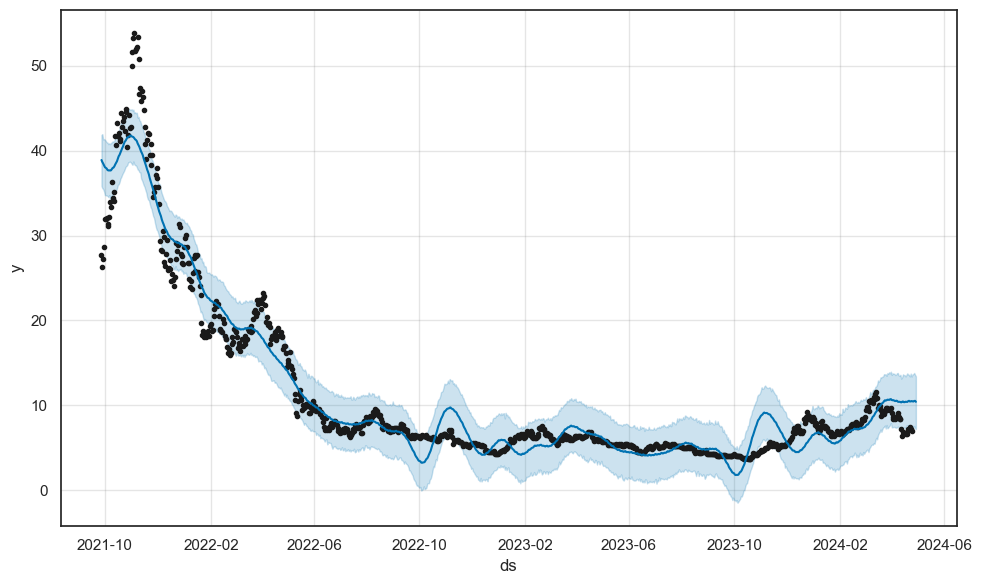

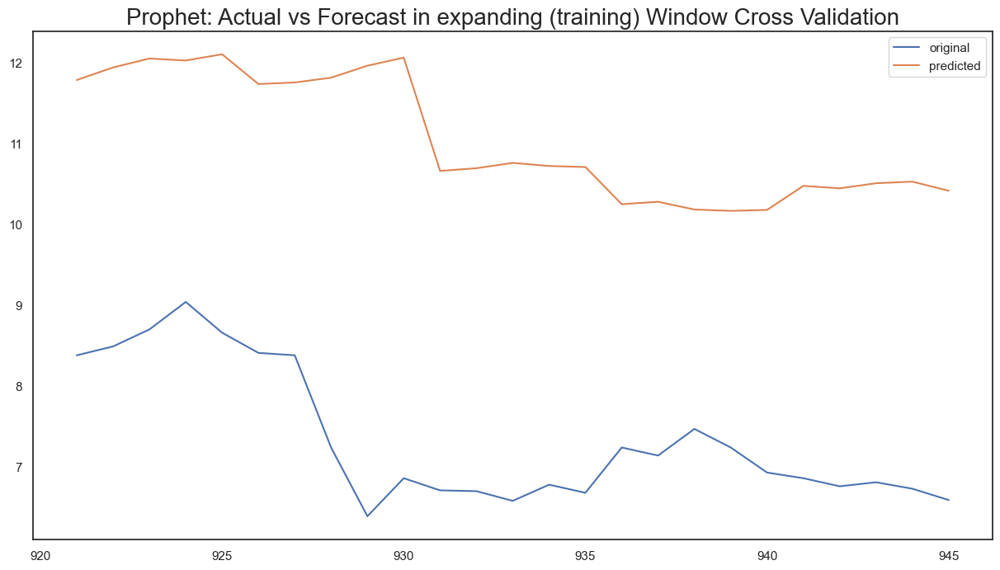

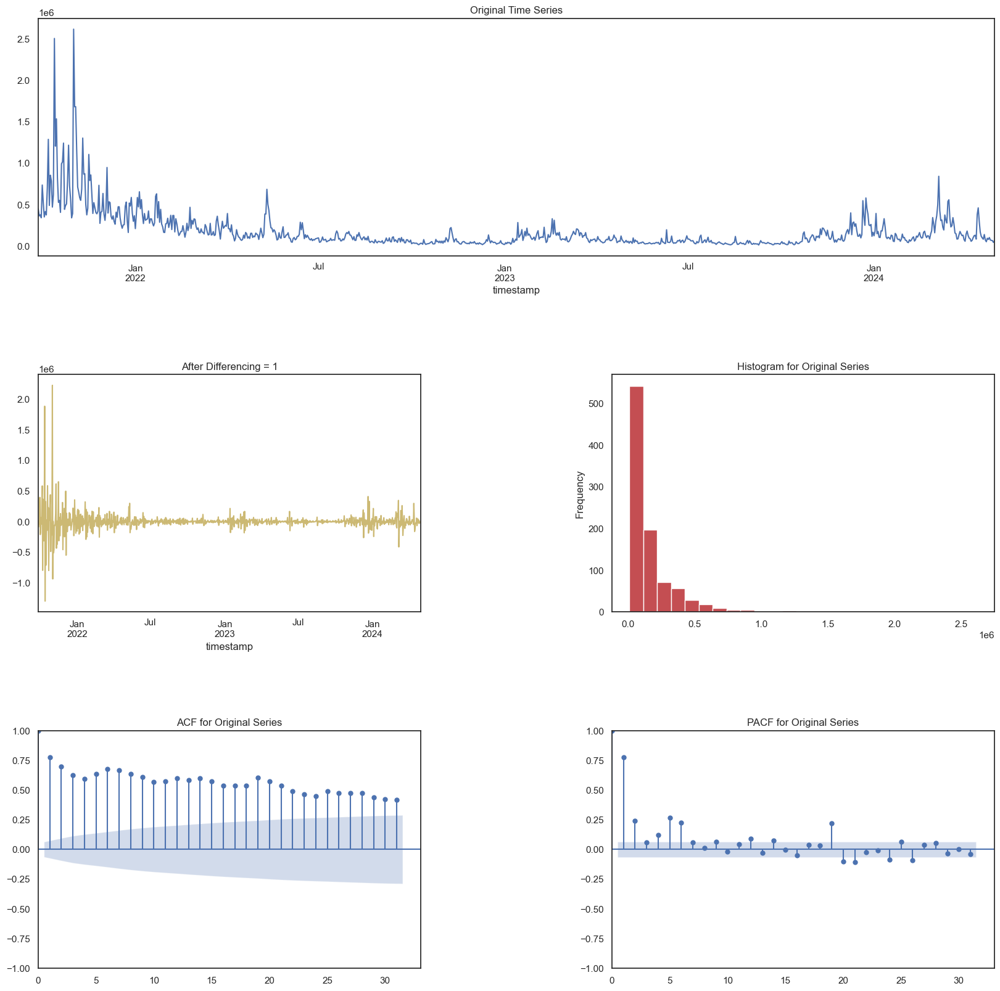

13:47:54 - cmdstanpy - INFO - Chain [1] start processing


Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 10, 'cv': 10}
    Fit-Predict data (shape=(946, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 921 Test Shape: 5


13:47:54 - cmdstanpy - INFO - Chain [1] done processing
13:47:55 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 95,341.42
    Std Deviation of actuals = 23,969.75
    Normalized RMSE (as pct of std dev) = 398%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 926 Test Shape: 5


13:47:55 - cmdstanpy - INFO - Chain [1] done processing
13:47:55 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 199,441.28
    Std Deviation of actuals = 143,915.23
    Normalized RMSE (as pct of std dev) = 139%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 931 Test Shape: 5


13:47:55 - cmdstanpy - INFO - Chain [1] done processing
13:47:56 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 97,805.49
    Std Deviation of actuals = 30,250.35
    Normalized RMSE (as pct of std dev) = 323%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 936 Test Shape: 5


13:47:56 - cmdstanpy - INFO - Chain [1] done processing
13:47:57 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 106,435.26
    Std Deviation of actuals = 17,558.72
    Normalized RMSE (as pct of std dev) = 606%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 941 Test Shape: 5


13:47:57 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 141,352.15
    Std Deviation of actuals = 9,730.21
    Normalized RMSE (as pct of std dev) = 1453%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 121004.17
    MSE (Mean Squared Error = 17948324529.54
    MAPE (Mean Absolute Percent Error) = 129%
    RMSE (Root Mean Squared Error) = 133971.3571
    Normalized RMSE (MinMax) = 32%
    Normalized RMSE (as Std Dev of Actuals)= 130%
Time Taken = 4 seconds


13:47:58 - cmdstanpy - INFO - Chain [1] start processing
13:47:58 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 128075.12


--------------------------------------------------
Total time taken: 7 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name      rmse
0  Prophet 128075.12
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (946, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+------

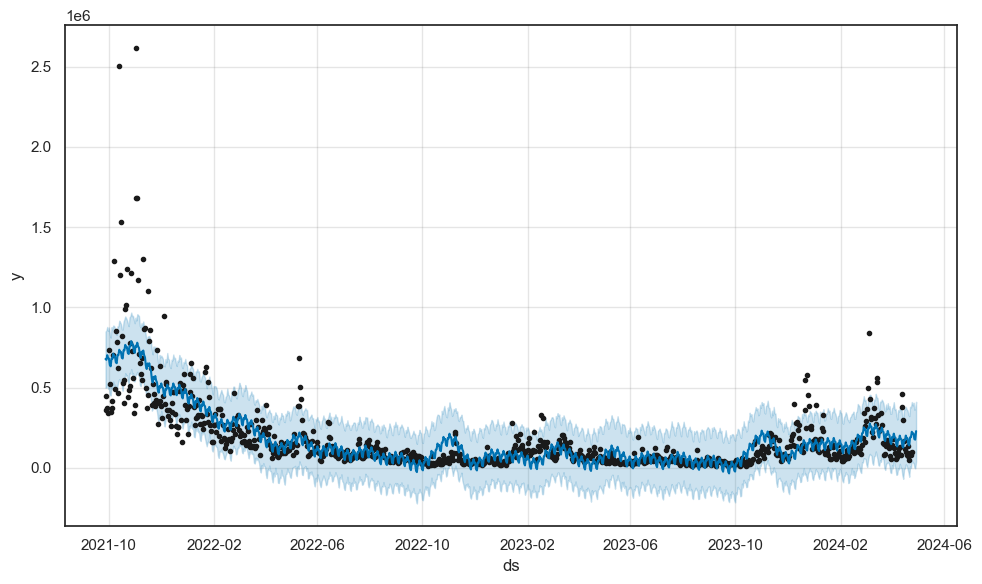

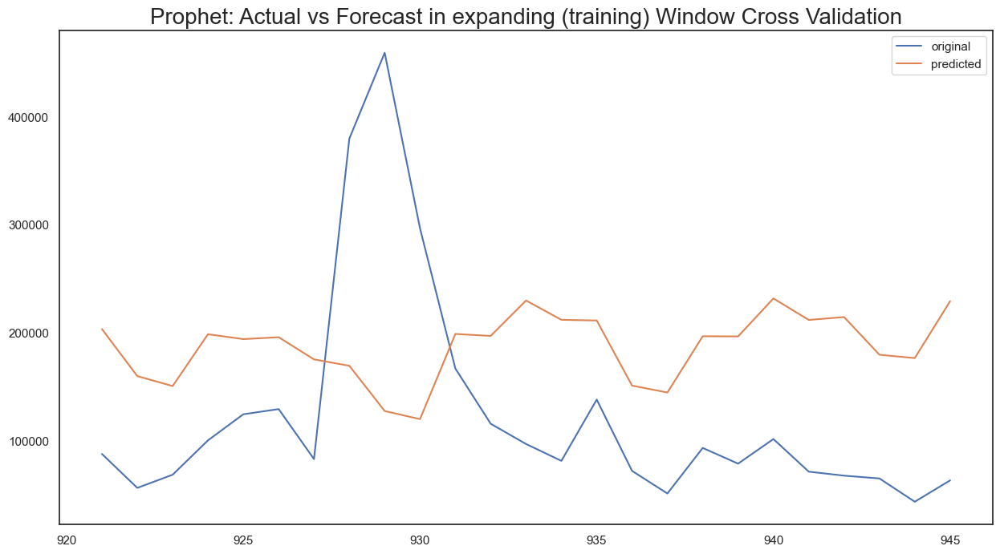

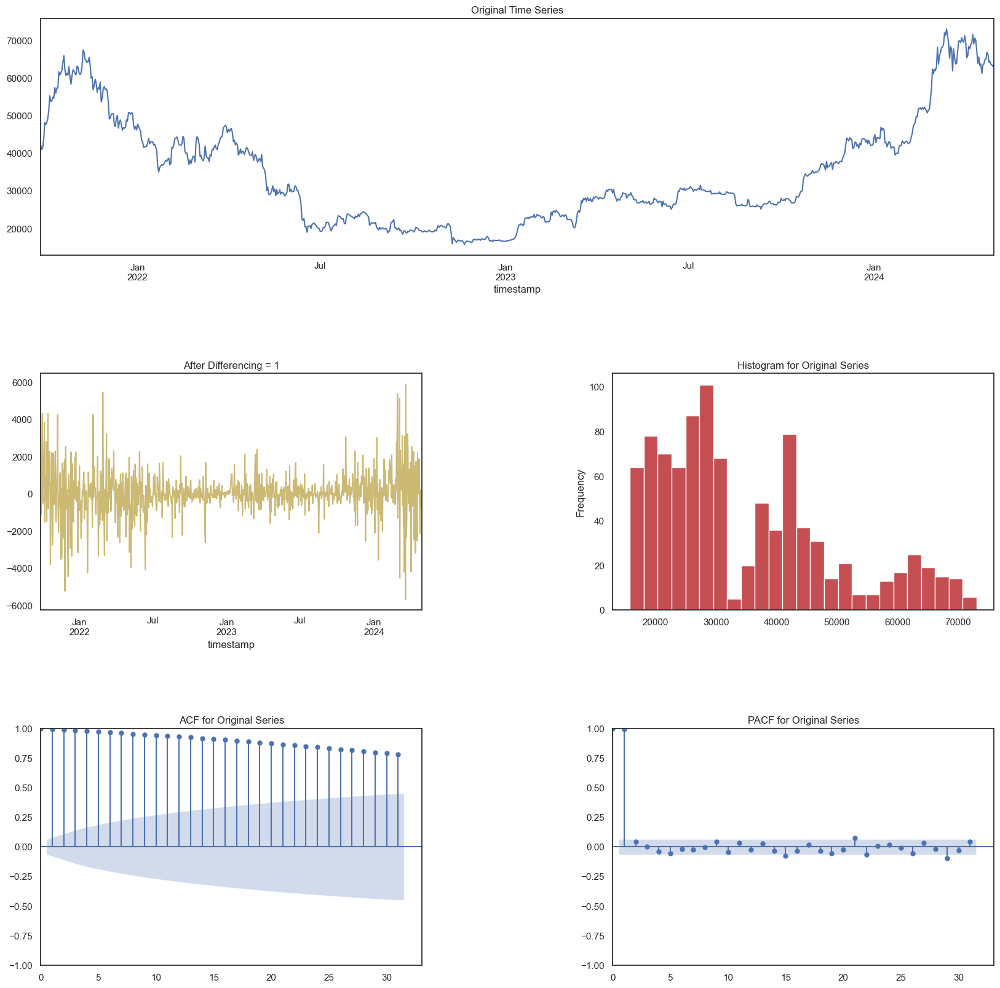

13:48:03 - cmdstanpy - INFO - Chain [1] start processing


Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 10, 'cv': 10}
    Fit-Predict data (shape=(946, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 921 Test Shape: 5


13:48:03 - cmdstanpy - INFO - Chain [1] done processing
13:48:03 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 1,323.78
    Std Deviation of actuals = 1,244.03
    Normalized RMSE (as pct of std dev) = 106%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 926 Test Shape: 5


13:48:03 - cmdstanpy - INFO - Chain [1] done processing
13:48:04 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 4,483.39
    Std Deviation of actuals = 2,545.18
    Normalized RMSE (as pct of std dev) = 176%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 931 Test Shape: 5


13:48:04 - cmdstanpy - INFO - Chain [1] done processing
13:48:05 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 8,381.43
    Std Deviation of actuals = 953.11
    Normalized RMSE (as pct of std dev) = 879%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 936 Test Shape: 5


13:48:05 - cmdstanpy - INFO - Chain [1] done processing
13:48:05 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 5,446.20
    Std Deviation of actuals = 965.87
    Normalized RMSE (as pct of std dev) = 564%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 941 Test Shape: 5


13:48:05 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 6,364.10
    Std Deviation of actuals = 459.40
    Normalized RMSE (as pct of std dev) = 1385%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 4972.03
    MSE (Mean Squared Error = 32452891.51
    MAPE (Mean Absolute Percent Error) = 8%
    RMSE (Root Mean Squared Error) = 5696.7439
    Normalized RMSE (MinMax) = 55%
    Normalized RMSE (as Std Dev of Actuals)= 205%
Time Taken = 3 seconds


13:48:06 - cmdstanpy - INFO - Chain [1] start processing
13:48:06 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 5199.78


--------------------------------------------------
Total time taken: 8 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name    rmse
0  Prophet 5199.78
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (946, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+------------

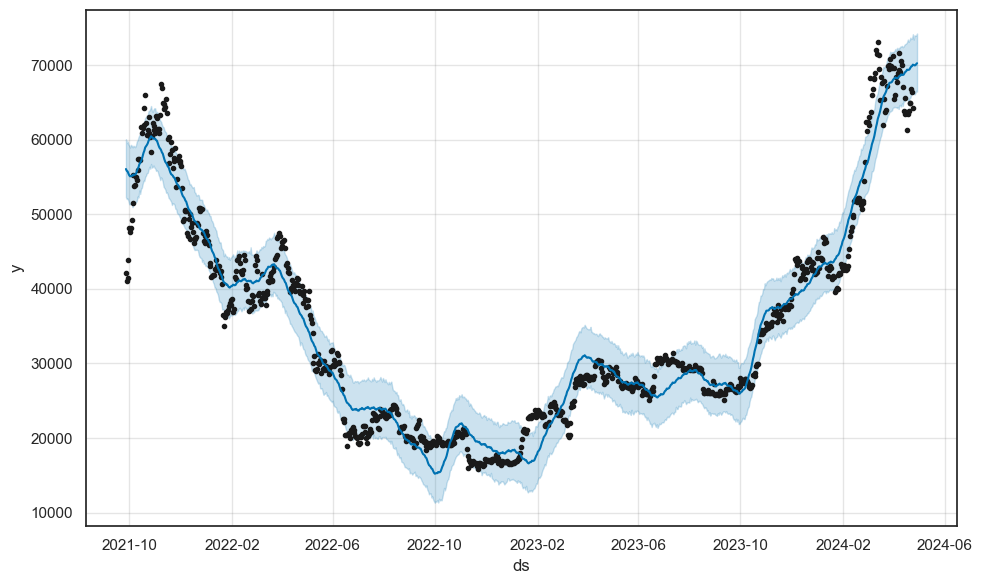

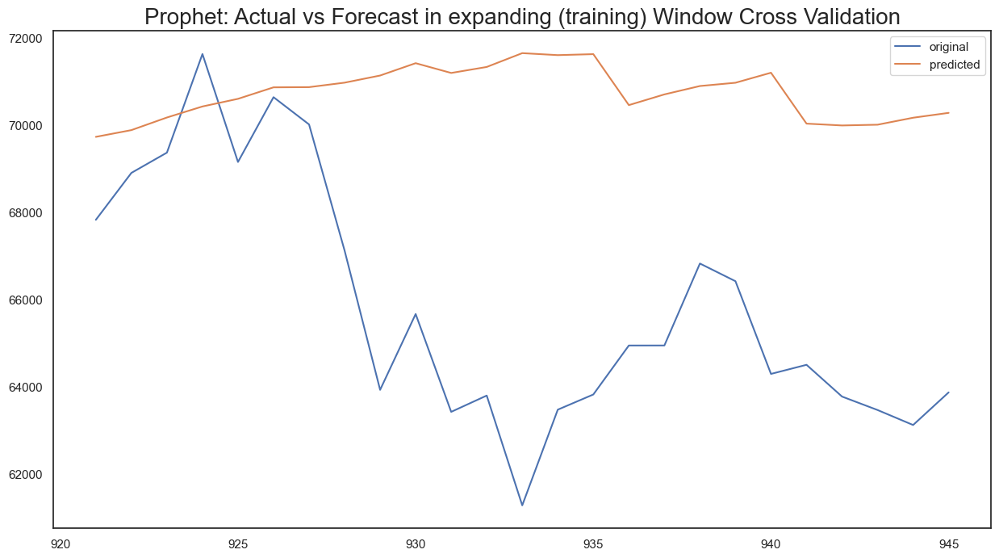

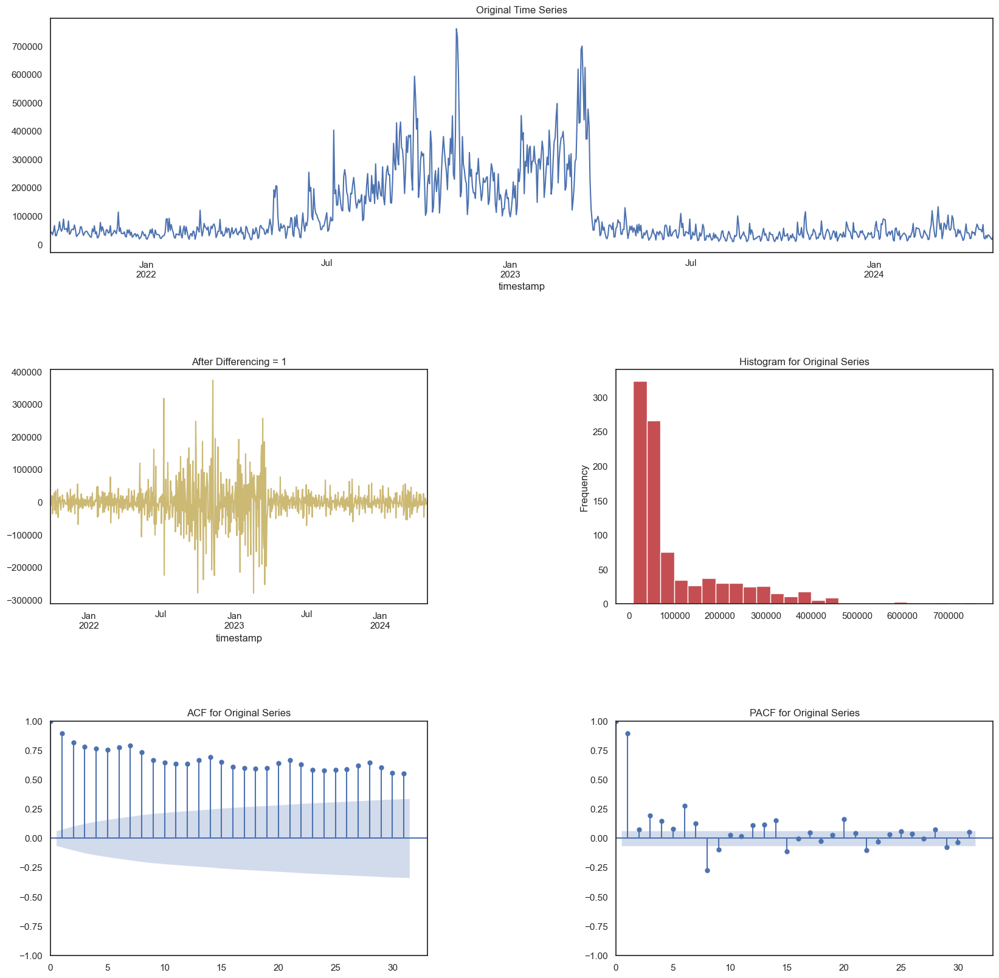

13:48:10 - cmdstanpy - INFO - Chain [1] start processing


Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 10, 'cv': 10}
    Fit-Predict data (shape=(946, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 921 Test Shape: 5


13:48:11 - cmdstanpy - INFO - Chain [1] done processing
13:48:11 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 118,956.54
    Std Deviation of actuals = 10,223.67
    Normalized RMSE (as pct of std dev) = 1164%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 926 Test Shape: 5


13:48:11 - cmdstanpy - INFO - Chain [1] done processing
13:48:12 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 139,352.47
    Std Deviation of actuals = 14,045.03
    Normalized RMSE (as pct of std dev) = 992%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 931 Test Shape: 5


13:48:12 - cmdstanpy - INFO - Chain [1] done processing
13:48:13 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 79,796.91
    Std Deviation of actuals = 8,617.99
    Normalized RMSE (as pct of std dev) = 926%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 936 Test Shape: 5


13:48:13 - cmdstanpy - INFO - Chain [1] done processing
13:48:13 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 51,468.39
    Std Deviation of actuals = 5,500.14
    Normalized RMSE (as pct of std dev) = 936%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 941 Test Shape: 5


13:48:14 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 28,941.26
    Std Deviation of actuals = 5,211.20
    Normalized RMSE (as pct of std dev) = 555%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 80283.26
    MSE (Mean Squared Error = 8684781699.70
    MAPE (Mean Absolute Percent Error) = 226%
    RMSE (Root Mean Squared Error) = 93192.1762
    Normalized RMSE (MinMax) = 171%
    Normalized RMSE (as Std Dev of Actuals)= 579%
Time Taken = 4 seconds


13:48:14 - cmdstanpy - INFO - Chain [1] start processing
13:48:15 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 83703.11


--------------------------------------------------
Total time taken: 8 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name     rmse
0  Prophet 83703.11
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (946, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+---------

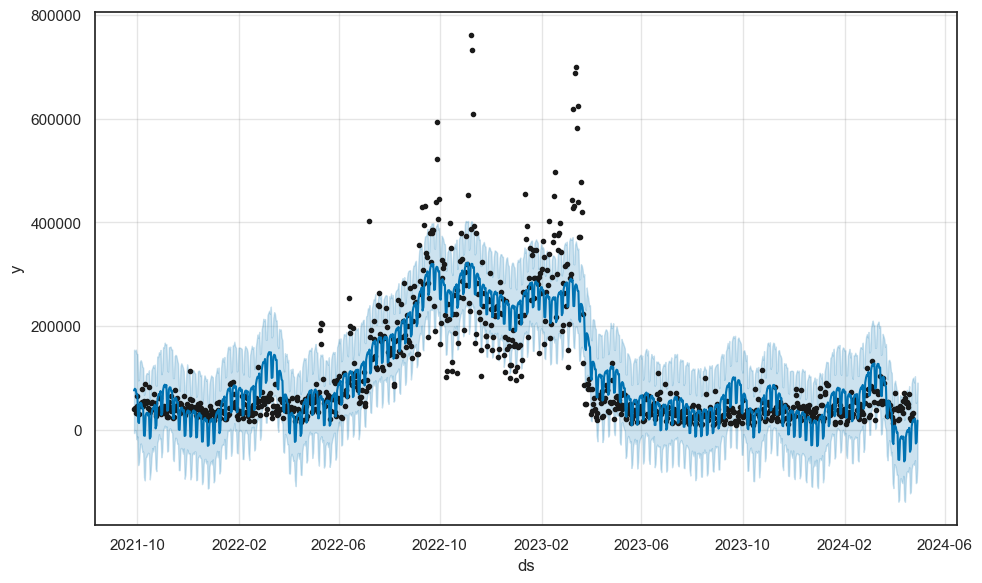

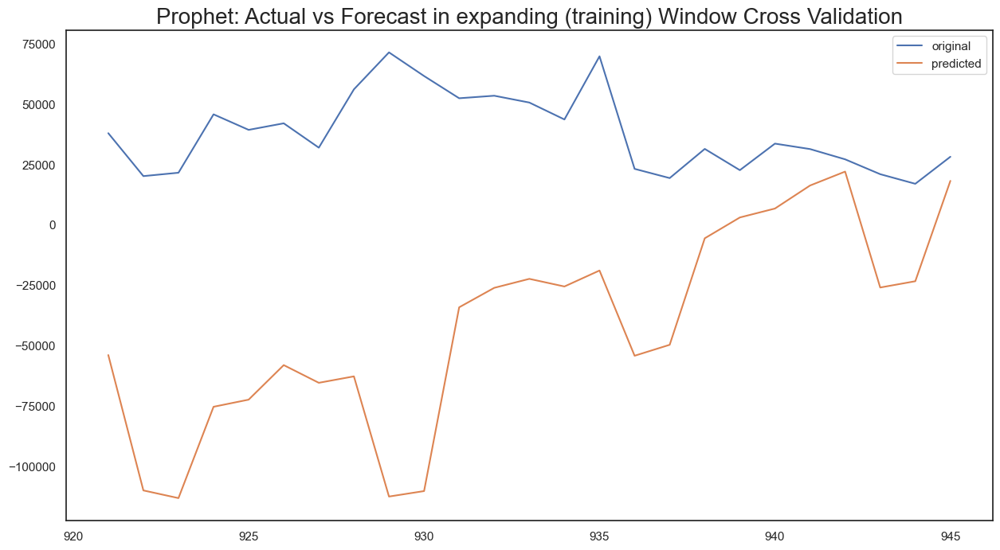

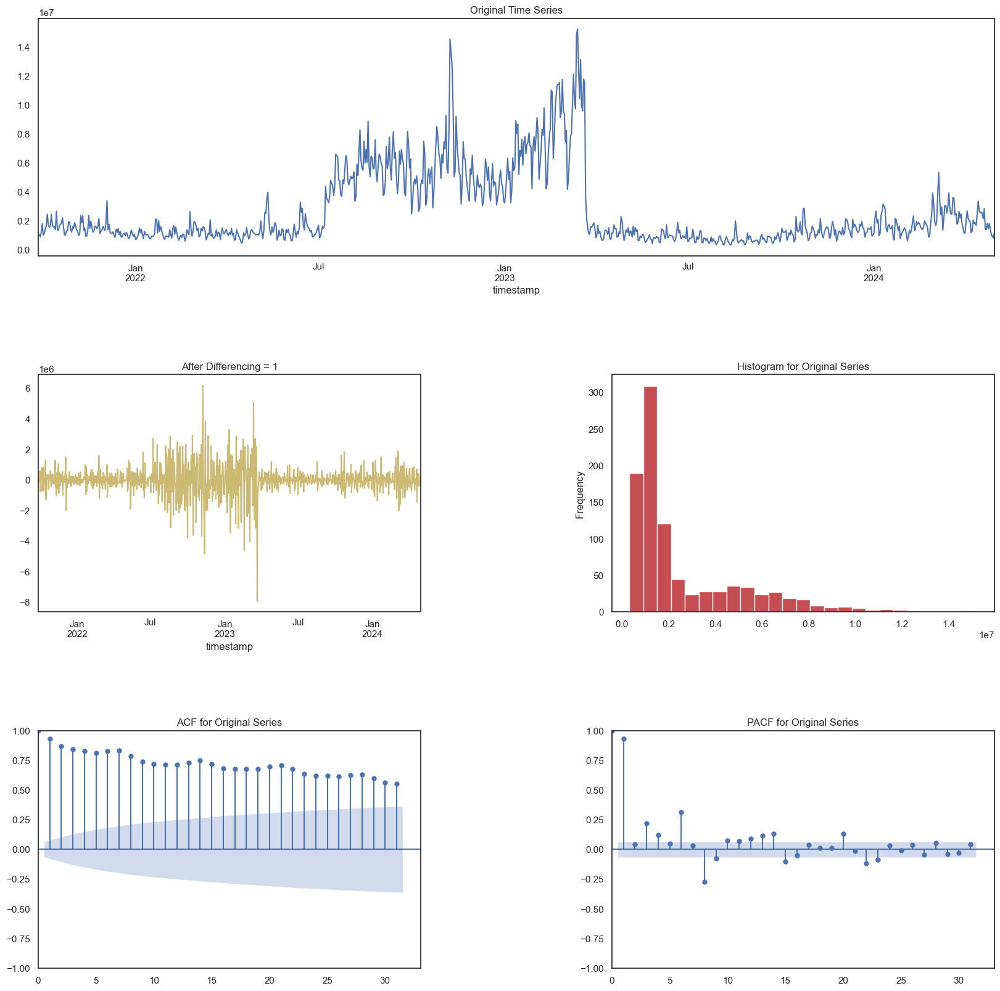

13:48:20 - cmdstanpy - INFO - Chain [1] start processing


Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 10, 'cv': 10}
    Fit-Predict data (shape=(946, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 921 Test Shape: 5


13:48:20 - cmdstanpy - INFO - Chain [1] done processing
13:48:21 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 2,646,170.29
    Std Deviation of actuals = 349,368.48
    Normalized RMSE (as pct of std dev) = 757%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 926 Test Shape: 5


13:48:21 - cmdstanpy - INFO - Chain [1] done processing
13:48:21 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 3,195,947.40
    Std Deviation of actuals = 601,862.39
    Normalized RMSE (as pct of std dev) = 531%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 931 Test Shape: 5


13:48:22 - cmdstanpy - INFO - Chain [1] done processing
13:48:22 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 2,225,245.25
    Std Deviation of actuals = 223,010.30
    Normalized RMSE (as pct of std dev) = 998%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 936 Test Shape: 5


13:48:22 - cmdstanpy - INFO - Chain [1] done processing
13:48:23 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 970,566.44
    Std Deviation of actuals = 197,360.83
    Normalized RMSE (as pct of std dev) = 492%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 941 Test Shape: 5


13:48:23 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 304,372.77
    Std Deviation of actuals = 201,533.47
    Normalized RMSE (as pct of std dev) = 151%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 1808338.59
    MSE (Mean Squared Error = 4640531090332.26
    MAPE (Mean Absolute Percent Error) = 94%
    RMSE (Root Mean Squared Error) = 2154189.1956
    Normalized RMSE (MinMax) = 84%
    Normalized RMSE (as Std Dev of Actuals)= 324%
Time Taken = 3 seconds


13:48:24 - cmdstanpy - INFO - Chain [1] start processing
13:48:24 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 1868460.43


--------------------------------------------------
Total time taken: 9 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name       rmse
0  Prophet 1868460.43
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (946, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+---

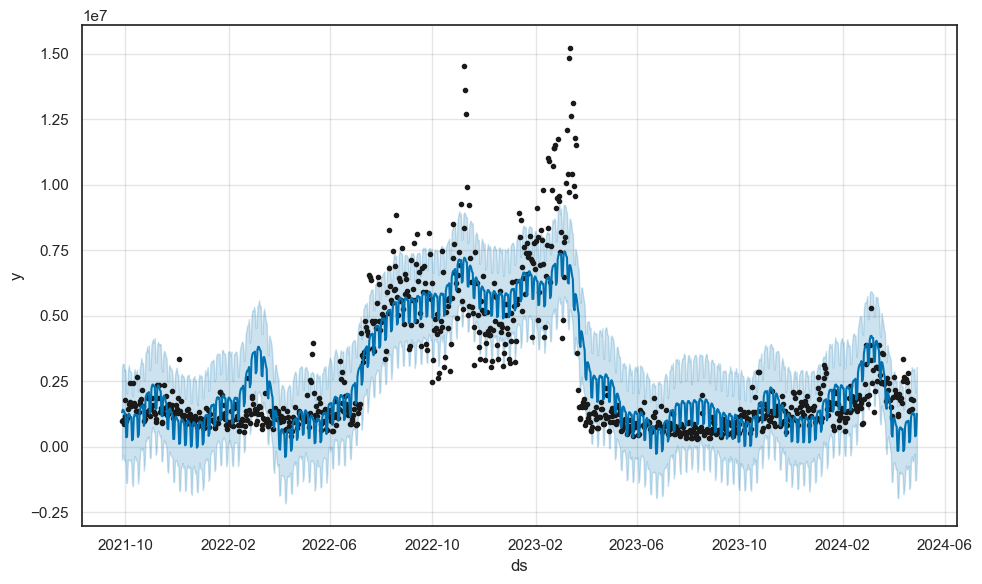

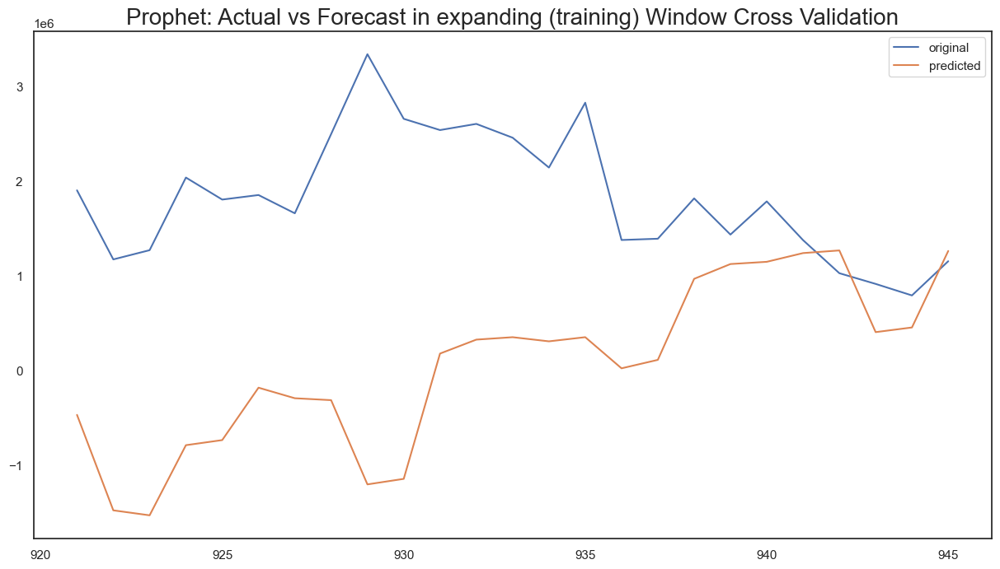

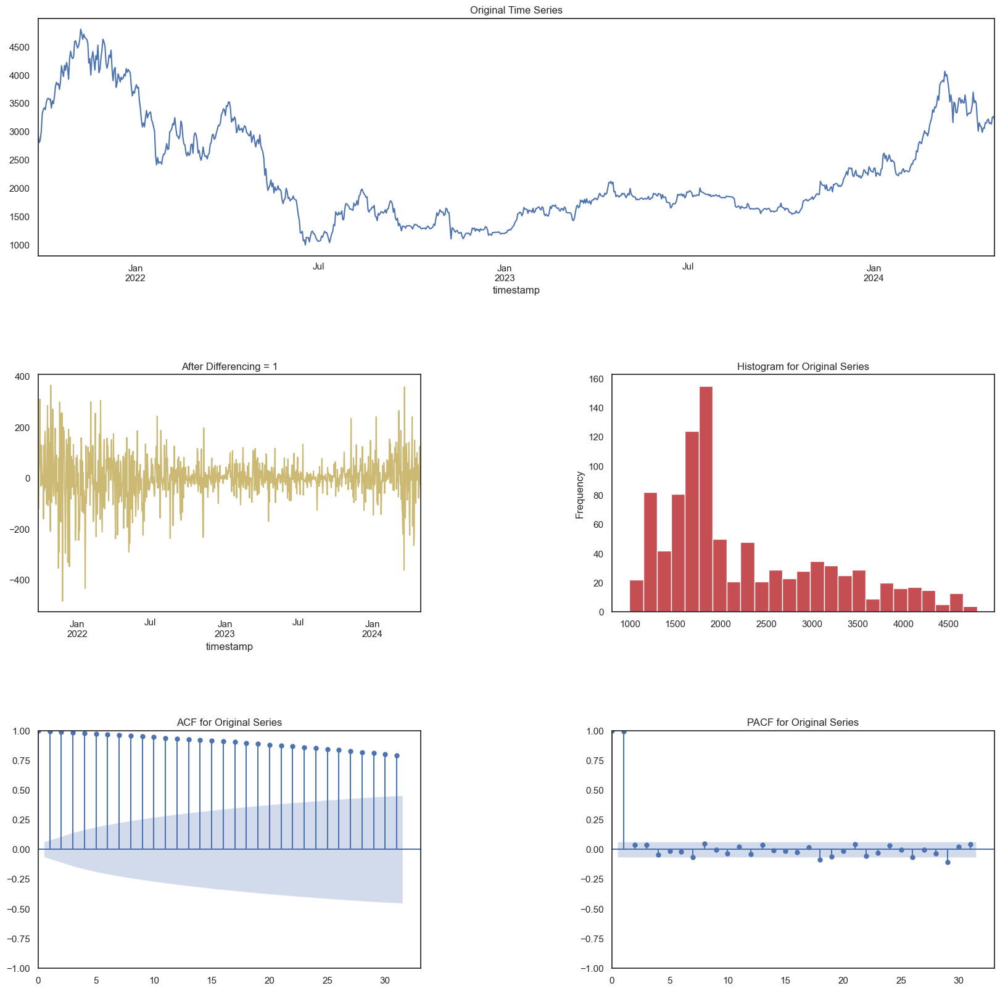

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 10, 'cv': 10}
    Fit-Predict data (shape=(946, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 921 Test Shape: 5


13:48:28 - cmdstanpy - INFO - Chain [1] start processing
13:48:28 - cmdstanpy - INFO - Chain [1] done processing
13:48:29 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 351.98
    Std Deviation of actuals = 133.47
    Normalized RMSE (as pct of std dev) = 264%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 926 Test Shape: 5


13:48:29 - cmdstanpy - INFO - Chain [1] done processing
13:48:29 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 503.45
    Std Deviation of actuals = 205.70
    Normalized RMSE (as pct of std dev) = 245%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 931 Test Shape: 5


13:48:30 - cmdstanpy - INFO - Chain [1] done processing
13:48:30 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 686.16
    Std Deviation of actuals = 39.83
    Normalized RMSE (as pct of std dev) = 1723%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 936 Test Shape: 5


13:48:30 - cmdstanpy - INFO - Chain [1] done processing
13:48:31 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 404.72
    Std Deviation of actuals = 31.22
    Normalized RMSE (as pct of std dev) = 1296%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 941 Test Shape: 5


13:48:31 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 338.19
    Std Deviation of actuals = 52.84
    Normalized RMSE (as pct of std dev) = 640%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 441.42
    MSE (Mean Squared Error = 225268.24
    MAPE (Mean Absolute Percent Error) = 14%
    RMSE (Root Mean Squared Error) = 474.6243
    Normalized RMSE (MinMax) = 67%
    Normalized RMSE (as Std Dev of Actuals)= 262%
Time Taken = 4 seconds


13:48:32 - cmdstanpy - INFO - Chain [1] start processing
13:48:32 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 456.90


--------------------------------------------------
Total time taken: 8 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name   rmse
0  Prophet 456.90
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (946, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+---------------

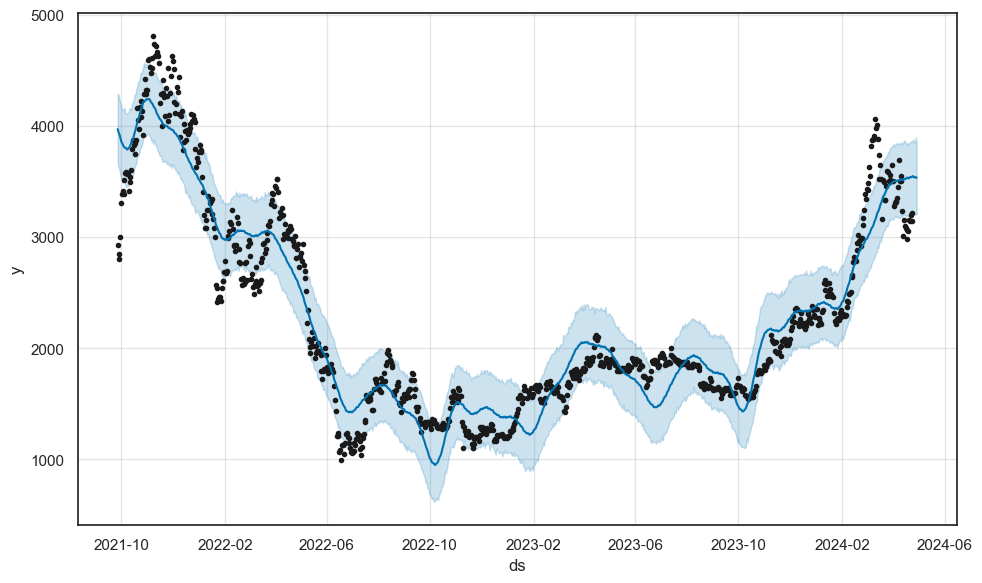

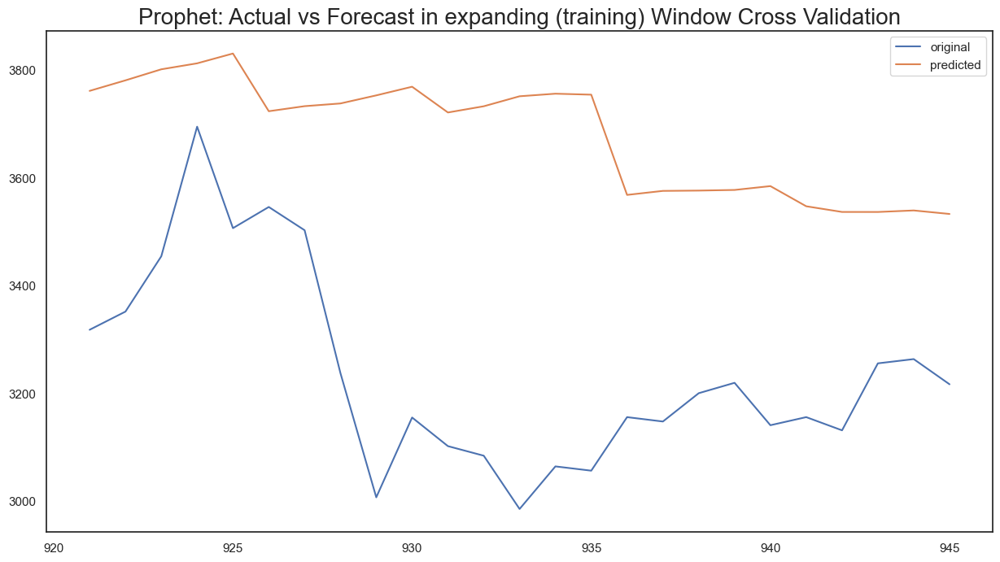

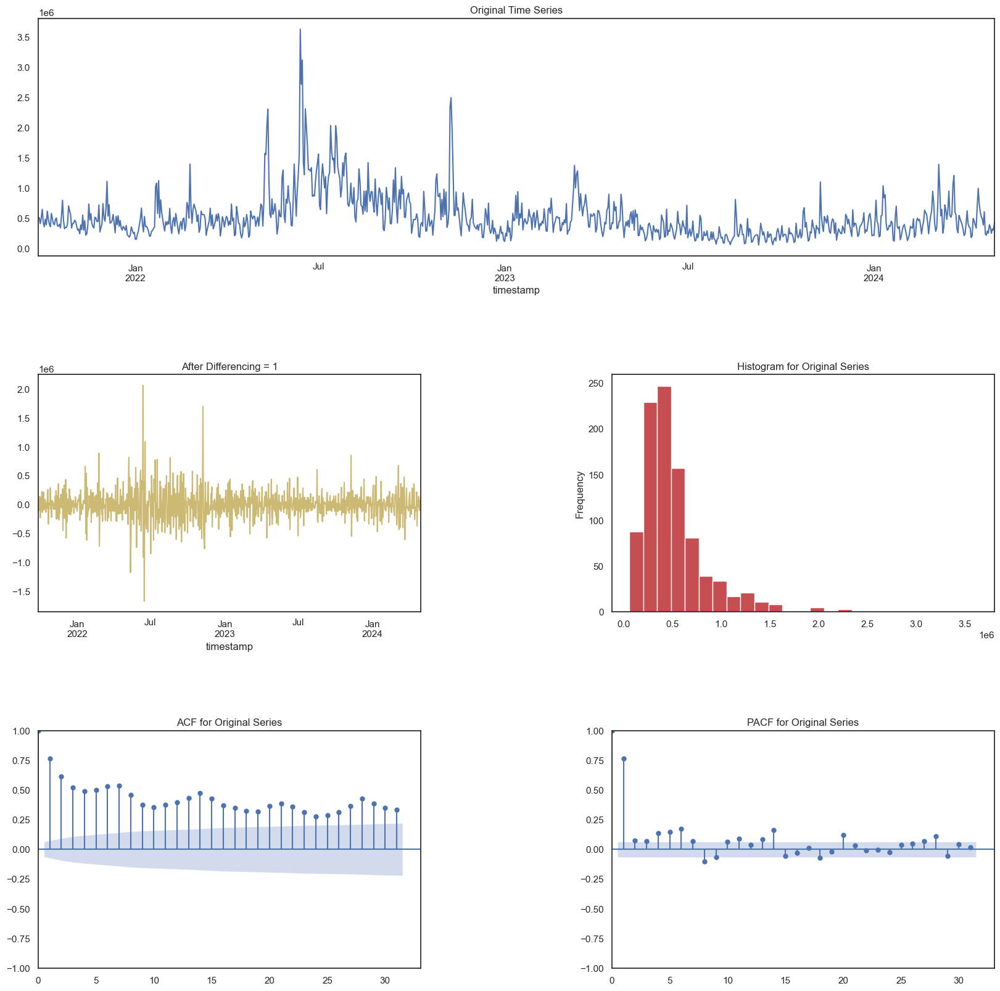

13:48:35 - cmdstanpy - INFO - Chain [1] start processing


Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 10, 'cv': 10}
    Fit-Predict data (shape=(946, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 921 Test Shape: 5


13:48:36 - cmdstanpy - INFO - Chain [1] done processing
13:48:36 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 89,077.44
    Std Deviation of actuals = 126,308.63
    Normalized RMSE (as pct of std dev) = 71%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 926 Test Shape: 5


13:48:36 - cmdstanpy - INFO - Chain [1] done processing
13:48:37 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 430,641.66
    Std Deviation of actuals = 241,813.15
    Normalized RMSE (as pct of std dev) = 178%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 931 Test Shape: 5


13:48:37 - cmdstanpy - INFO - Chain [1] done processing
13:48:38 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 102,622.25
    Std Deviation of actuals = 81,123.98
    Normalized RMSE (as pct of std dev) = 127%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 936 Test Shape: 5


13:48:38 - cmdstanpy - INFO - Chain [1] done processing
13:48:38 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 293,136.12
    Std Deviation of actuals = 61,062.05
    Normalized RMSE (as pct of std dev) = 480%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 941 Test Shape: 5


13:48:39 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 300,254.36
    Std Deviation of actuals = 55,860.74
    Normalized RMSE (as pct of std dev) = 538%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 213743.05
    MSE (Mean Squared Error = 75999964346.71
    MAPE (Mean Absolute Percent Error) = 57%
    RMSE (Root Mean Squared Error) = 275680.9104
    Normalized RMSE (MinMax) = 34%
    Normalized RMSE (as Std Dev of Actuals)= 143%
Time Taken = 4 seconds


13:48:39 - cmdstanpy - INFO - Chain [1] start processing
13:48:40 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 243146.37


--------------------------------------------------
Total time taken: 8 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name      rmse
0  Prophet 243146.37
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (946, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+------

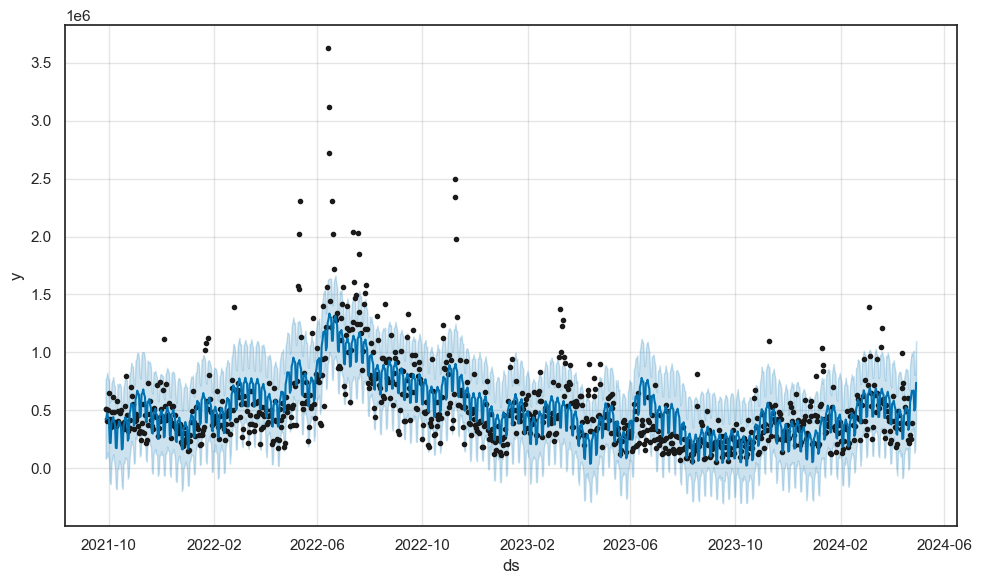

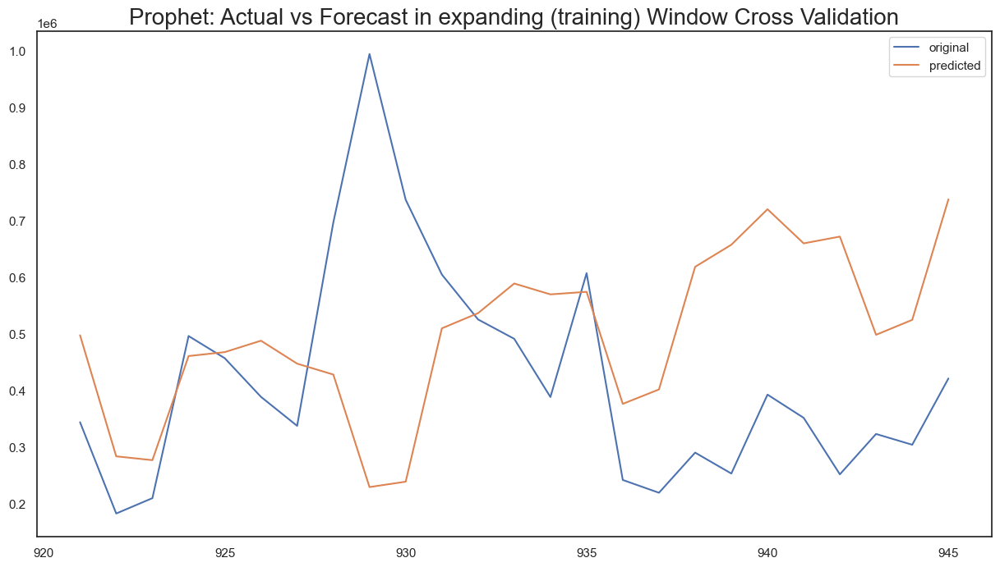

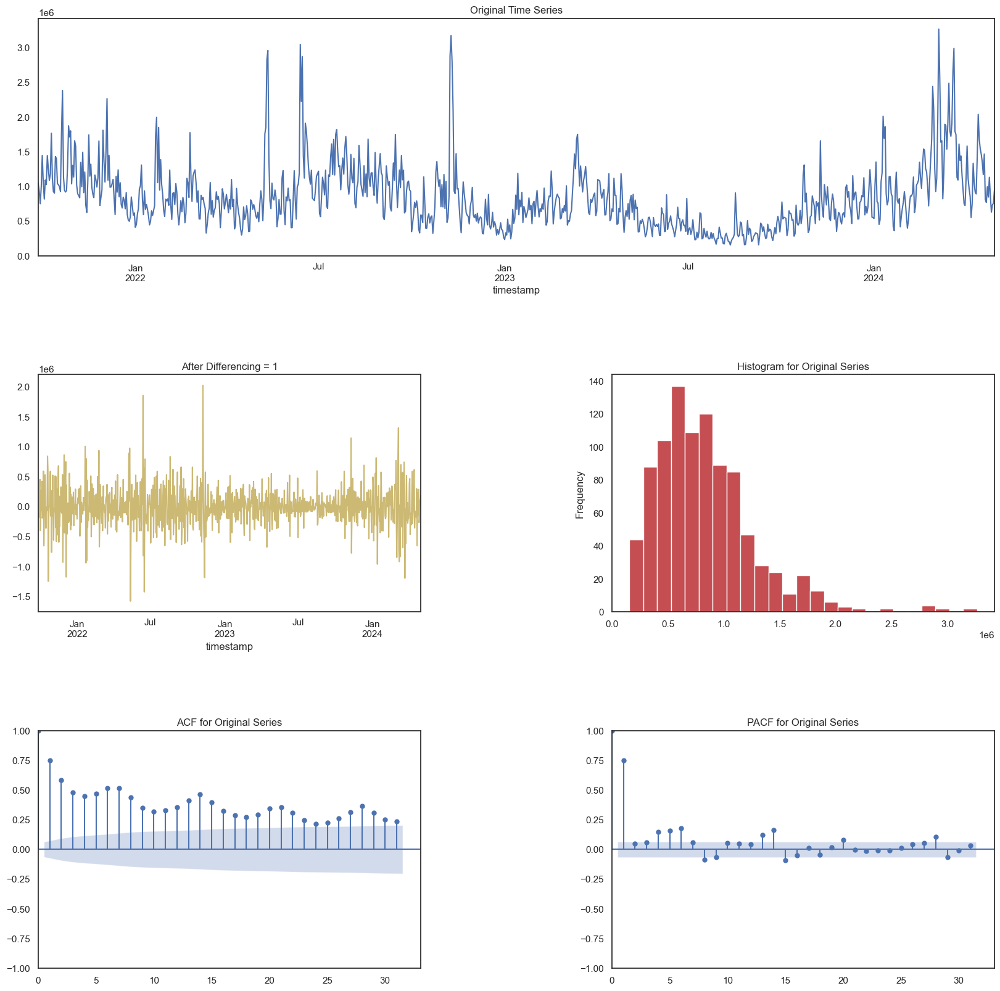

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 10, 'cv': 10}
    Fit-Predict data (shape=(946, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 921 Test Shape: 5


13:48:44 - cmdstanpy - INFO - Chain [1] start processing
13:48:44 - cmdstanpy - INFO - Chain [1] done processing
13:48:45 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 385,044.86
    Std Deviation of actuals = 267,064.82
    Normalized RMSE (as pct of std dev) = 144%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 926 Test Shape: 5


13:48:45 - cmdstanpy - INFO - Chain [1] done processing
13:48:45 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 631,706.86
    Std Deviation of actuals = 442,640.22
    Normalized RMSE (as pct of std dev) = 143%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 931 Test Shape: 5


13:48:45 - cmdstanpy - INFO - Chain [1] done processing
13:48:46 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 165,977.02
    Std Deviation of actuals = 129,846.78
    Normalized RMSE (as pct of std dev) = 128%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 936 Test Shape: 5


13:48:46 - cmdstanpy - INFO - Chain [1] done processing
13:48:47 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 463,158.02
    Std Deviation of actuals = 133,971.84
    Normalized RMSE (as pct of std dev) = 346%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 941 Test Shape: 5


13:48:47 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 633,709.27
    Std Deviation of actuals = 108,658.04
    Normalized RMSE (as pct of std dev) = 583%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 421751.69
    MSE (Mean Squared Error = 238192851921.56
    MAPE (Mean Absolute Percent Error) = 46%
    RMSE (Root Mean Squared Error) = 488050.0506
    Normalized RMSE (MinMax) = 33%
    Normalized RMSE (as Std Dev of Actuals)= 132%
Time Taken = 4 seconds


13:48:48 - cmdstanpy - INFO - Chain [1] start processing
13:48:48 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 455919.21


--------------------------------------------------
Total time taken: 8 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name      rmse
0  Prophet 455919.21
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (946, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+------

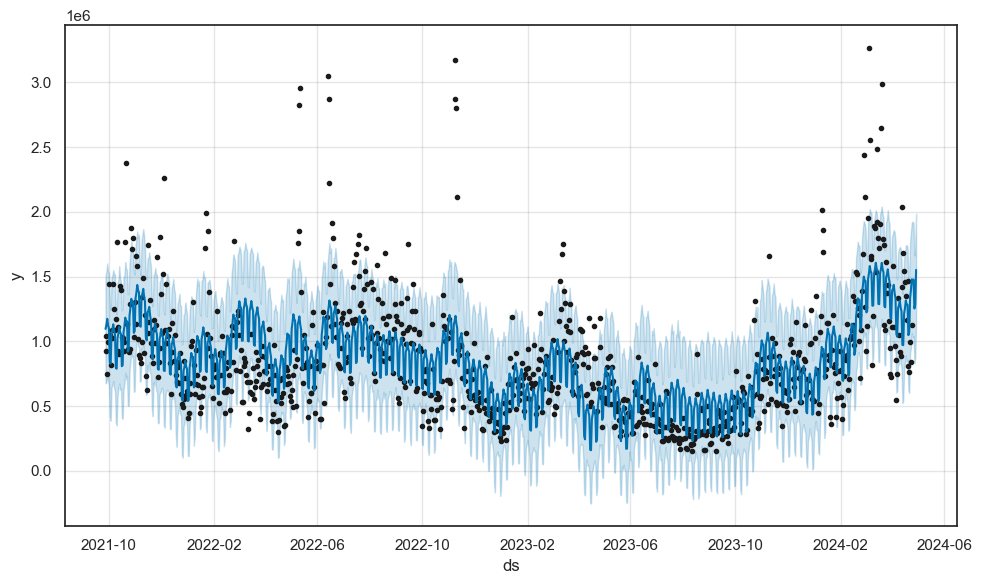

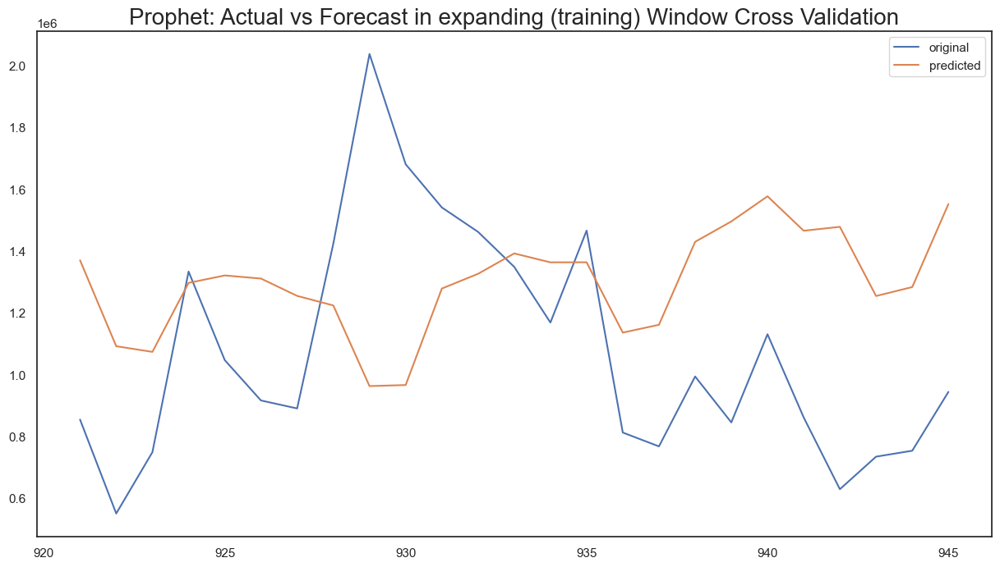

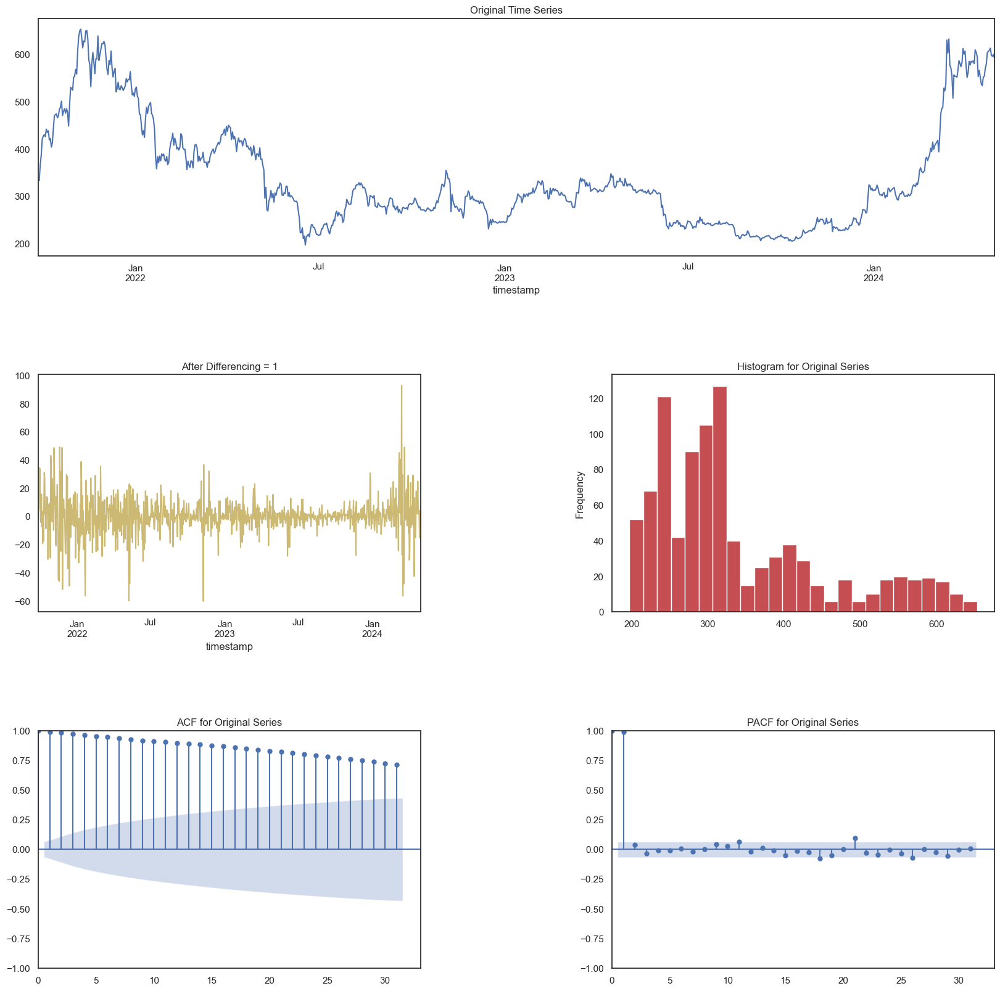

13:48:52 - cmdstanpy - INFO - Chain [1] start processing


Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 10, 'cv': 10}
    Fit-Predict data (shape=(946, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 921 Test Shape: 5


13:48:52 - cmdstanpy - INFO - Chain [1] done processing
13:48:53 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 68.86
    Std Deviation of actuals = 3.20
    Normalized RMSE (as pct of std dev) = 2151%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 926 Test Shape: 5


13:48:53 - cmdstanpy - INFO - Chain [1] done processing
13:48:53 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 48.82
    Std Deviation of actuals = 22.21
    Normalized RMSE (as pct of std dev) = 220%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 931 Test Shape: 5


13:48:54 - cmdstanpy - INFO - Chain [1] done processing
13:48:54 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 8.71
    Std Deviation of actuals = 8.46
    Normalized RMSE (as pct of std dev) = 103%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 936 Test Shape: 5


13:48:54 - cmdstanpy - INFO - Chain [1] done processing
13:48:55 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 49.90
    Std Deviation of actuals = 15.61
    Normalized RMSE (as pct of std dev) = 320%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 941 Test Shape: 5


13:48:55 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 36.93
    Std Deviation of actuals = 6.99
    Normalized RMSE (as pct of std dev) = 528%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 40.44
    MSE (Mean Squared Error = 2210.83
    MAPE (Mean Absolute Percent Error) = 7%
    RMSE (Root Mean Squared Error) = 47.0194
    Normalized RMSE (MinMax) = 59%
    Normalized RMSE (as Std Dev of Actuals)= 200%
Time Taken = 4 seconds


13:48:56 - cmdstanpy - INFO - Chain [1] start processing
13:48:56 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 42.64


--------------------------------------------------
Total time taken: 8 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name  rmse
0  Prophet 42.64
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (946, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+------------------

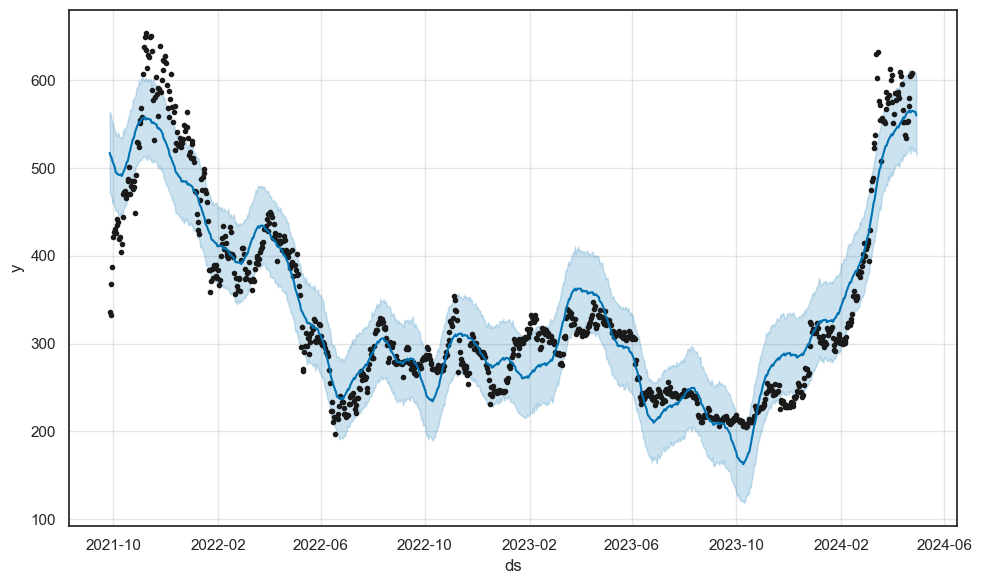

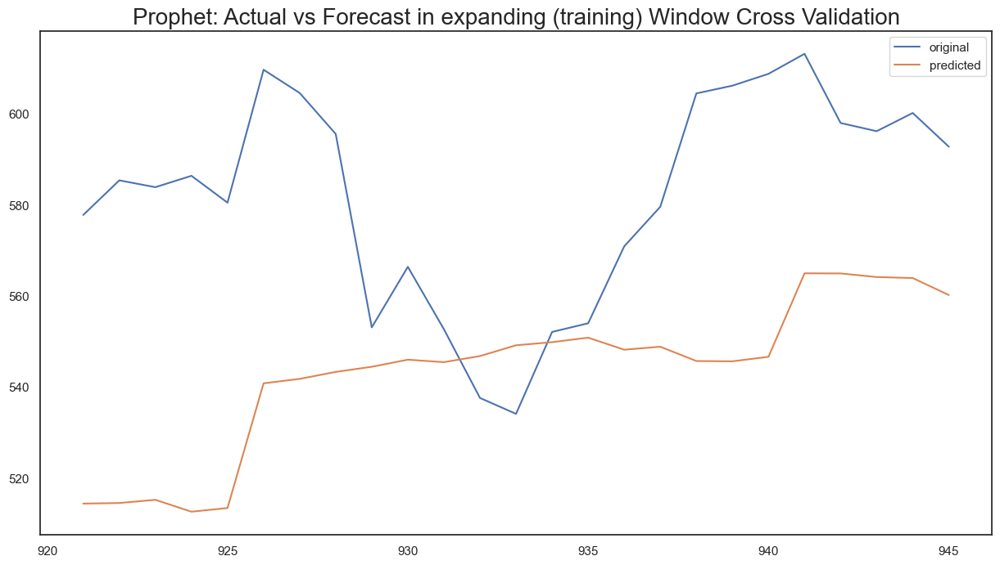

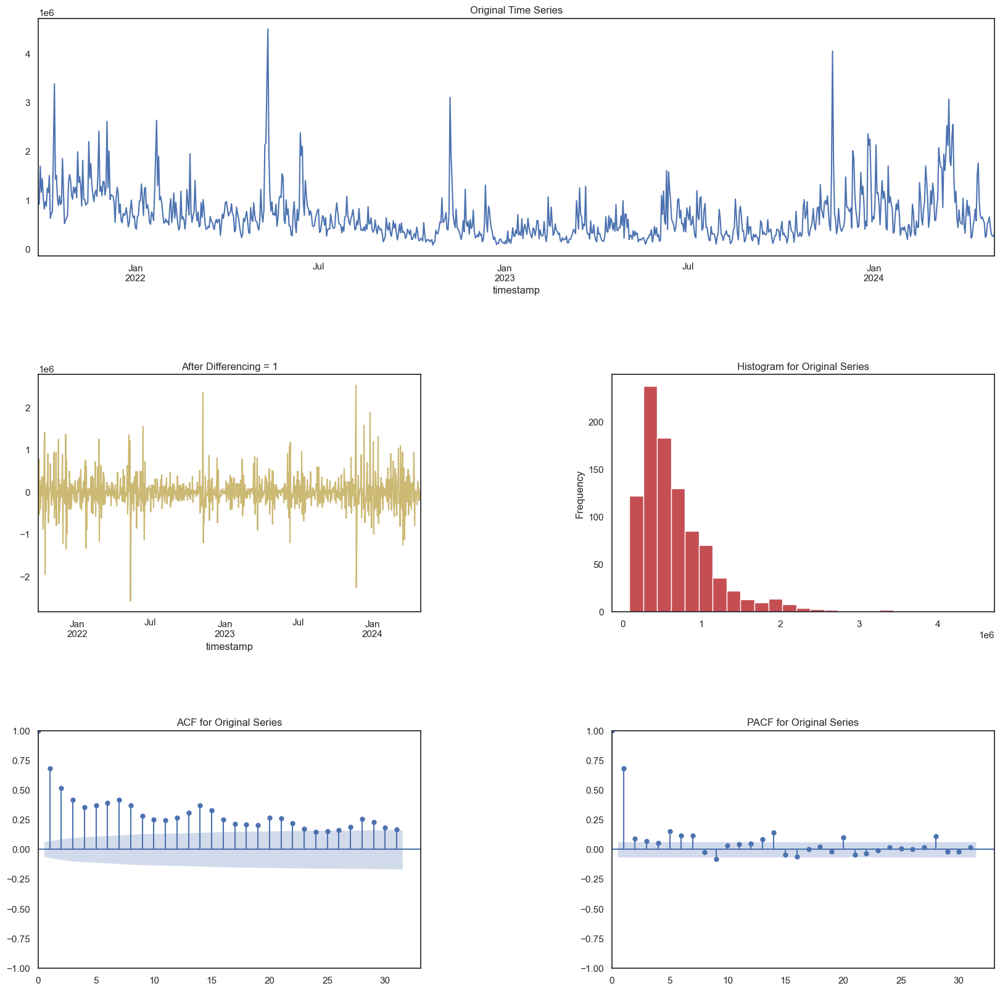

13:49:00 - cmdstanpy - INFO - Chain [1] start processing


Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 10, 'cv': 10}
    Fit-Predict data (shape=(946, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 921 Test Shape: 5


13:49:00 - cmdstanpy - INFO - Chain [1] done processing
13:49:00 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 447,053.39
    Std Deviation of actuals = 167,594.81
    Normalized RMSE (as pct of std dev) = 267%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 926 Test Shape: 5


13:49:01 - cmdstanpy - INFO - Chain [1] done processing
13:49:01 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 608,210.79
    Std Deviation of actuals = 442,209.92
    Normalized RMSE (as pct of std dev) = 138%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 931 Test Shape: 5


13:49:01 - cmdstanpy - INFO - Chain [1] done processing
13:49:02 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 453,691.66
    Std Deviation of actuals = 52,963.13
    Normalized RMSE (as pct of std dev) = 857%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 936 Test Shape: 5


13:49:02 - cmdstanpy - INFO - Chain [1] done processing
13:49:03 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 582,207.96
    Std Deviation of actuals = 162,748.41
    Normalized RMSE (as pct of std dev) = 358%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 941 Test Shape: 5


13:49:03 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 761,854.93
    Std Deviation of actuals = 70,345.20
    Normalized RMSE (as pct of std dev) = 1083%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 545153.02
    MSE (Mean Squared Error = 339000454271.31
    MAPE (Mean Absolute Percent Error) = 126%
    RMSE (Root Mean Squared Error) = 582237.4552
    Normalized RMSE (MinMax) = 38%
    Normalized RMSE (as Std Dev of Actuals)= 157%
Time Taken = 4 seconds


13:49:03 - cmdstanpy - INFO - Chain [1] start processing
13:49:04 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 570603.75


--------------------------------------------------
Total time taken: 7 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name      rmse
0  Prophet 570603.75
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (946, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+------

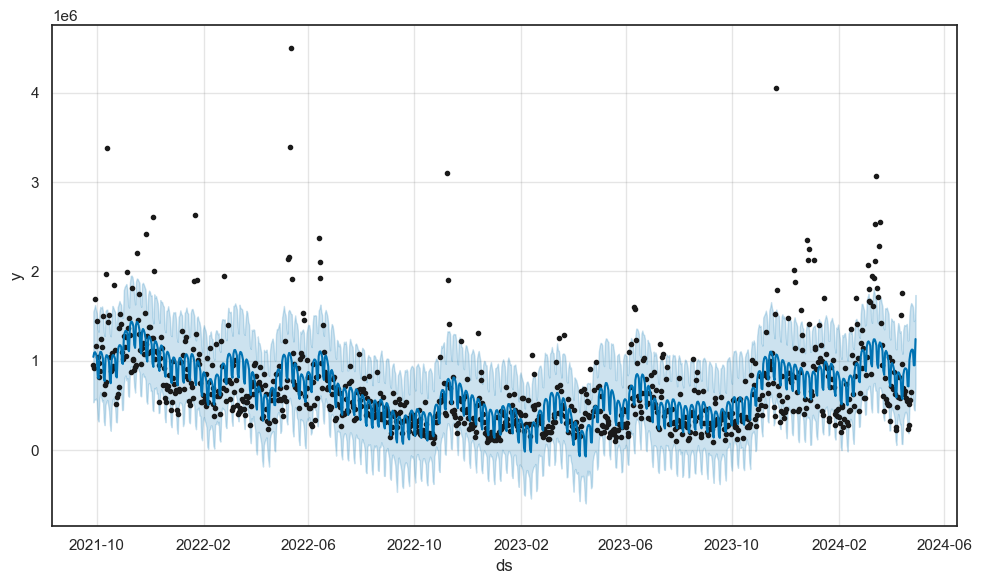

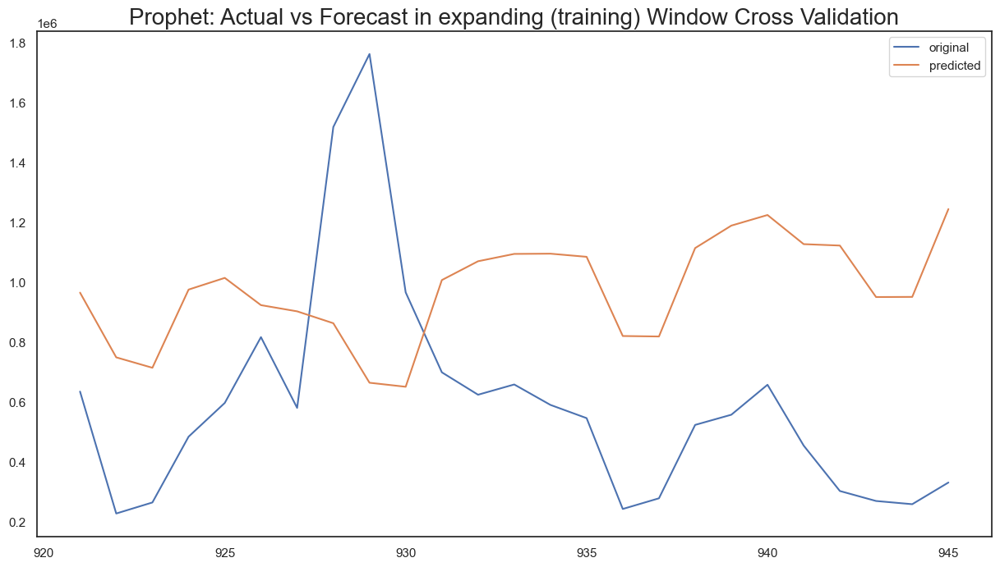

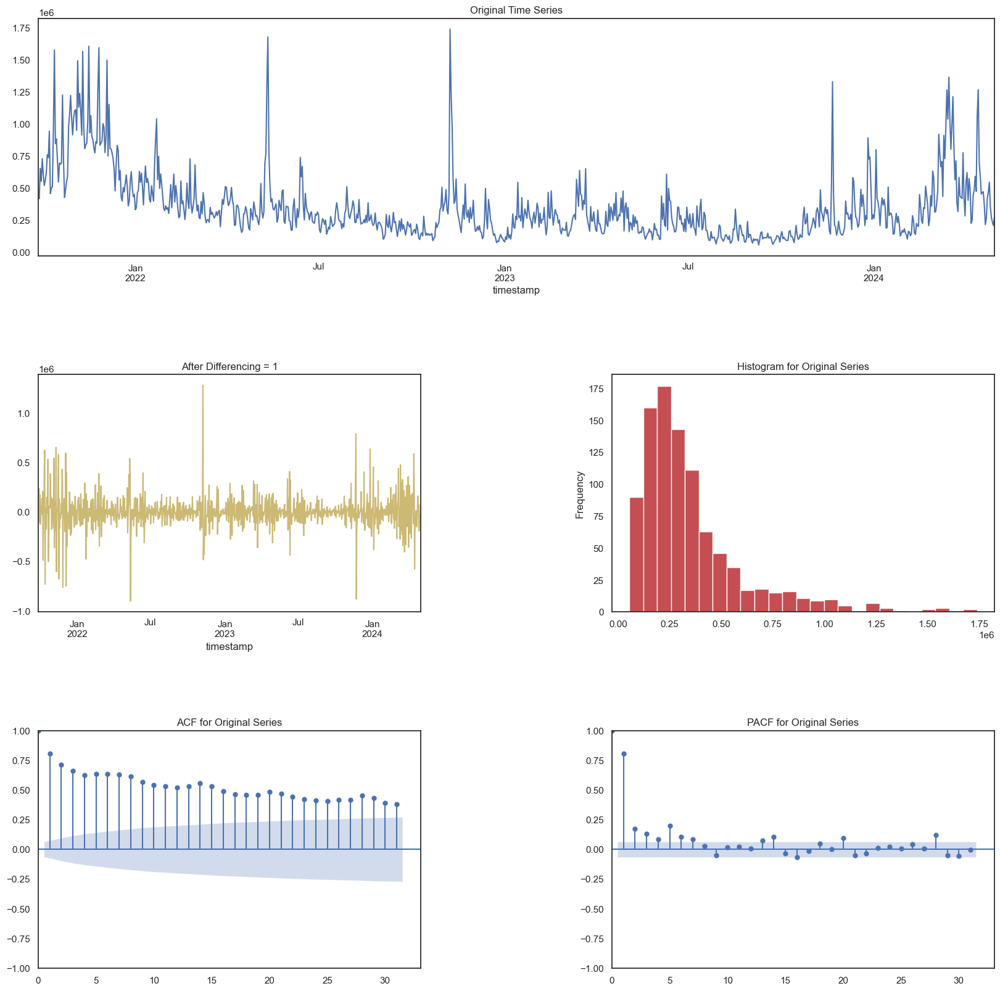

13:49:08 - cmdstanpy - INFO - Chain [1] start processing


Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 10, 'cv': 10}
    Fit-Predict data (shape=(946, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 921 Test Shape: 5


13:49:08 - cmdstanpy - INFO - Chain [1] done processing
13:49:08 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 90,409.16
    Std Deviation of actuals = 115,199.77
    Normalized RMSE (as pct of std dev) = 78%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 926 Test Shape: 5


13:49:08 - cmdstanpy - INFO - Chain [1] done processing
13:49:09 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 518,097.20
    Std Deviation of actuals = 298,915.54
    Normalized RMSE (as pct of std dev) = 173%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 931 Test Shape: 5


13:49:09 - cmdstanpy - INFO - Chain [1] done processing
13:49:10 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 112,231.02
    Std Deviation of actuals = 73,279.72
    Normalized RMSE (as pct of std dev) = 153%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 936 Test Shape: 5


13:49:10 - cmdstanpy - INFO - Chain [1] done processing
13:49:10 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 188,027.11
    Std Deviation of actuals = 125,279.71
    Normalized RMSE (as pct of std dev) = 150%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 941 Test Shape: 5


13:49:10 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 304,558.75
    Std Deviation of actuals = 49,361.56
    Normalized RMSE (as pct of std dev) = 617%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 210161.13
    MSE (Mean Squared Error = 83460910831.31
    MAPE (Mean Absolute Percent Error) = 54%
    RMSE (Root Mean Squared Error) = 288896.0208
    Normalized RMSE (MinMax) = 27%
    Normalized RMSE (as Std Dev of Actuals)= 115%
Time Taken = 3 seconds


13:49:11 - cmdstanpy - INFO - Chain [1] start processing
13:49:11 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 242664.65


--------------------------------------------------
Total time taken: 8 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name      rmse
0  Prophet 242664.65
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (946, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+------

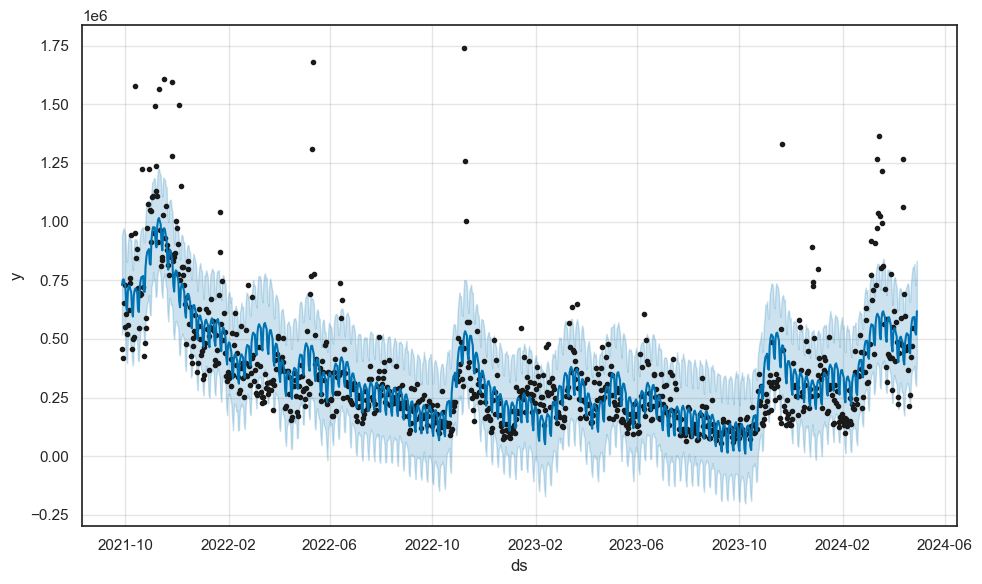

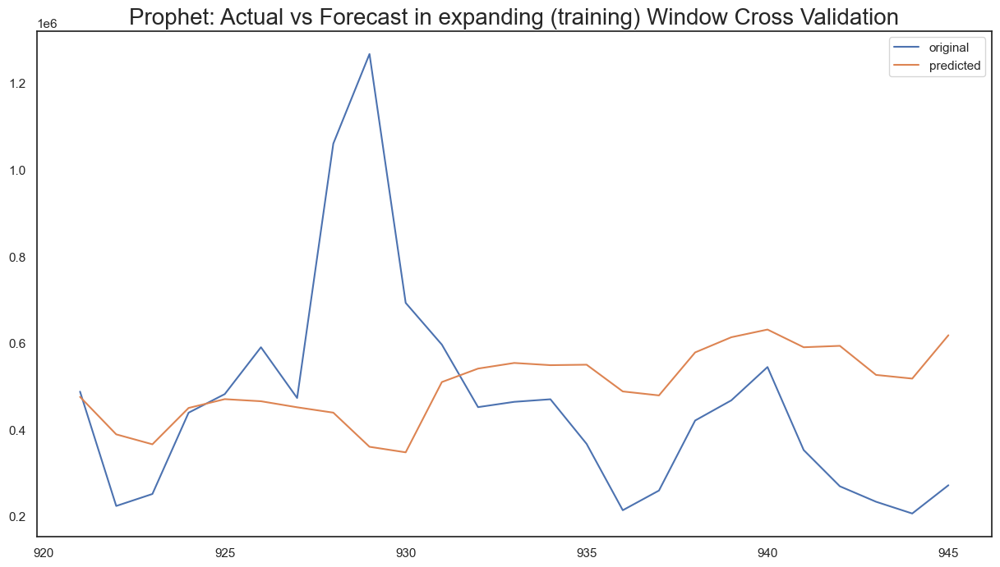

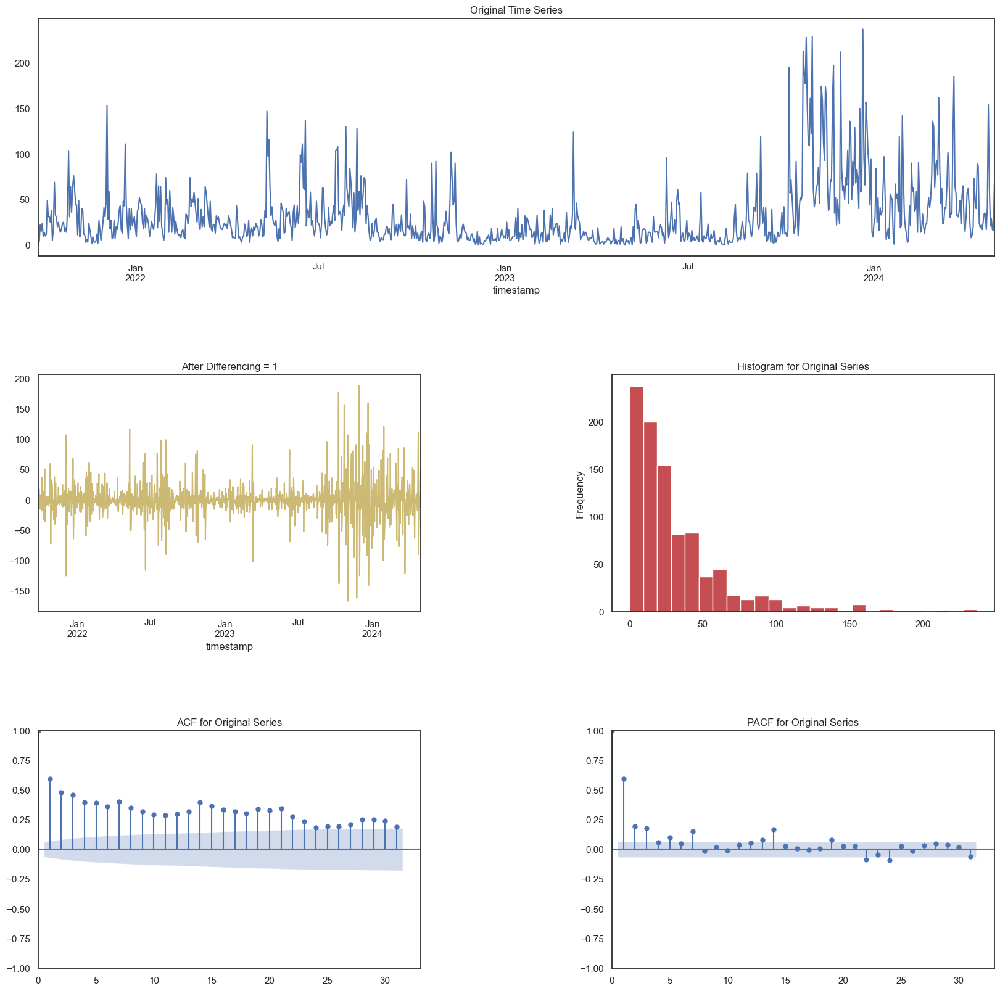

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 10, 'cv': 10}
    Fit-Predict data (shape=(946, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 921 Test Shape: 5


13:49:15 - cmdstanpy - INFO - Chain [1] start processing
13:49:15 - cmdstanpy - INFO - Chain [1] done processing
13:49:16 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 35.07
    Std Deviation of actuals = 23.79
    Normalized RMSE (as pct of std dev) = 147%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 926 Test Shape: 5


13:49:16 - cmdstanpy - INFO - Chain [1] done processing
13:49:17 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 27.70
    Std Deviation of actuals = 26.08
    Normalized RMSE (as pct of std dev) = 106%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 931 Test Shape: 5


13:49:17 - cmdstanpy - INFO - Chain [1] done processing
13:49:17 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 36.24
    Std Deviation of actuals = 6.45
    Normalized RMSE (as pct of std dev) = 562%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 936 Test Shape: 5


13:49:18 - cmdstanpy - INFO - Chain [1] done processing
13:49:18 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 45.72
    Std Deviation of actuals = 48.33
    Normalized RMSE (as pct of std dev) = 95%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 941 Test Shape: 5


13:49:18 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 33.86
    Std Deviation of actuals = 19.84
    Normalized RMSE (as pct of std dev) = 171%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 30.90
    MSE (Mean Squared Error = 1309.41
    MAPE (Mean Absolute Percent Error) = 134%
    RMSE (Root Mean Squared Error) = 36.1858
    Normalized RMSE (MinMax) = 25%
    Normalized RMSE (as Std Dev of Actuals)= 108%
Time Taken = 4 seconds


13:49:19 - cmdstanpy - INFO - Chain [1] start processing
13:49:19 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 35.72


--------------------------------------------------
Total time taken: 8 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name  rmse
0  Prophet 35.72
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (946, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+------------------

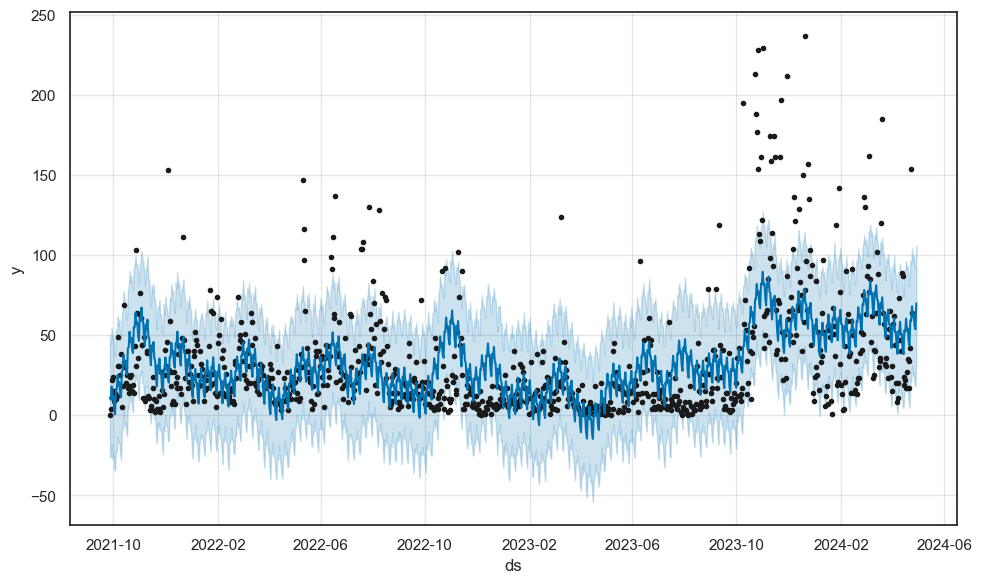

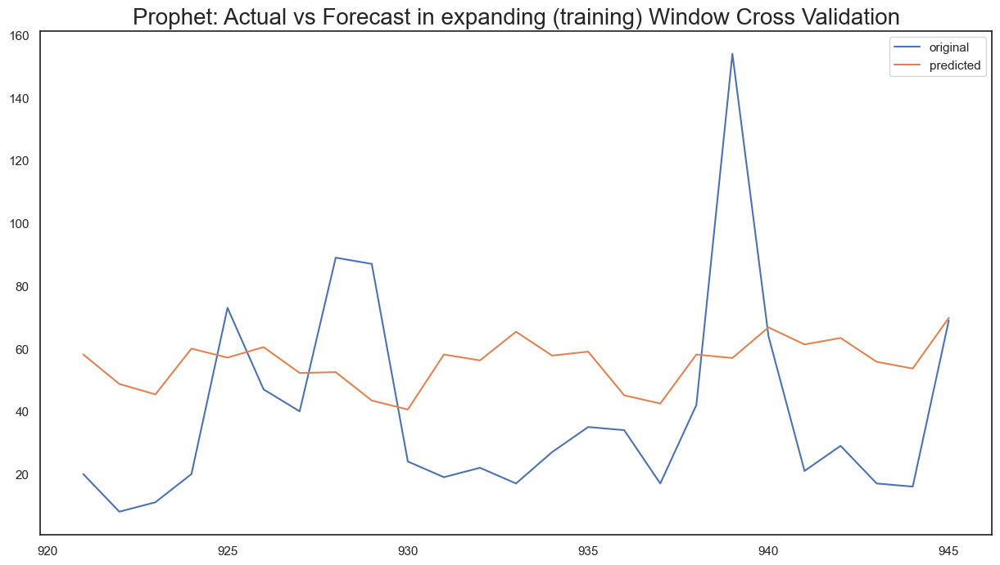

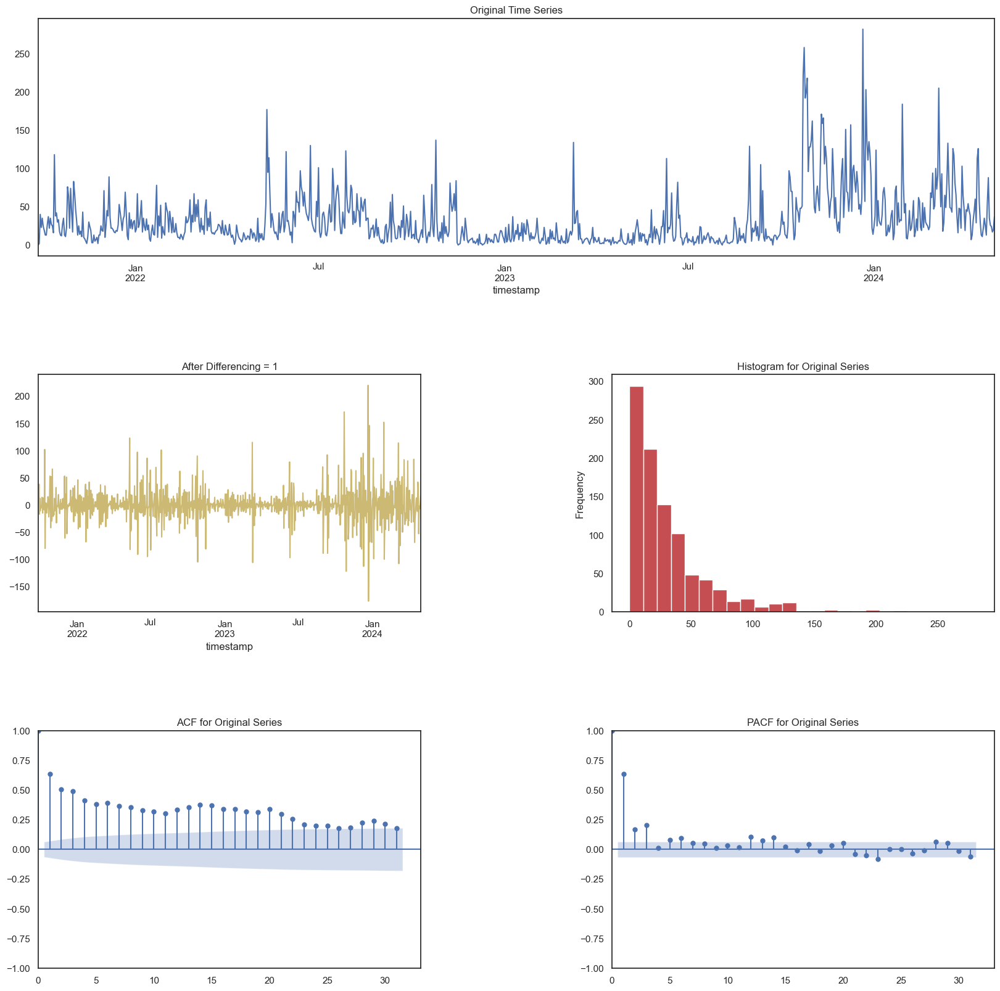

13:49:23 - cmdstanpy - INFO - Chain [1] start processing


Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 10, 'cv': 10}
    Fit-Predict data (shape=(946, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 921 Test Shape: 5


13:49:23 - cmdstanpy - INFO - Chain [1] done processing
13:49:24 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 30.12
    Std Deviation of actuals = 14.52
    Normalized RMSE (as pct of std dev) = 207%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 926 Test Shape: 5


13:49:24 - cmdstanpy - INFO - Chain [1] done processing
13:49:25 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 46.05
    Std Deviation of actuals = 36.58
    Normalized RMSE (as pct of std dev) = 126%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 931 Test Shape: 5


13:49:25 - cmdstanpy - INFO - Chain [1] done processing
13:49:26 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 43.63
    Std Deviation of actuals = 9.33
    Normalized RMSE (as pct of std dev) = 468%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 936 Test Shape: 5


13:49:26 - cmdstanpy - INFO - Chain [1] done processing
13:49:26 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 25.96
    Std Deviation of actuals = 26.29
    Normalized RMSE (as pct of std dev) = 99%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 941 Test Shape: 5


13:49:27 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 35.66
    Std Deviation of actuals = 6.85
    Normalized RMSE (as pct of std dev) = 520%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 33.42
    MSE (Mean Squared Error = 1375.35
    MAPE (Mean Absolute Percent Error) = 153%
    RMSE (Root Mean Squared Error) = 37.0857
    Normalized RMSE (MinMax) = 31%
    Normalized RMSE (as Std Dev of Actuals)= 122%
Time Taken = 4 seconds


13:49:27 - cmdstanpy - INFO - Chain [1] start processing
13:49:28 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 36.28


--------------------------------------------------
Total time taken: 8 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name  rmse
0  Prophet 36.28
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (946, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+------------------

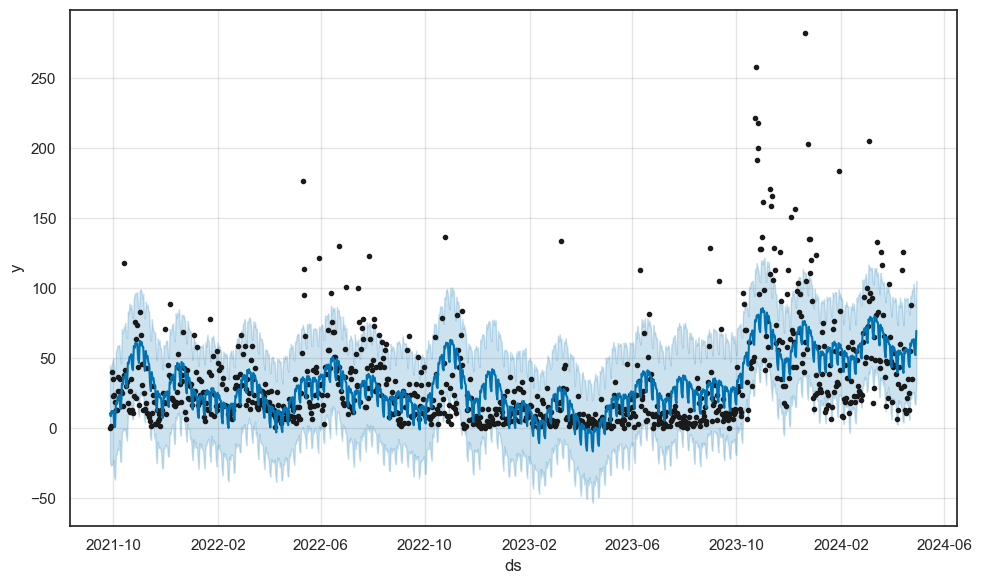

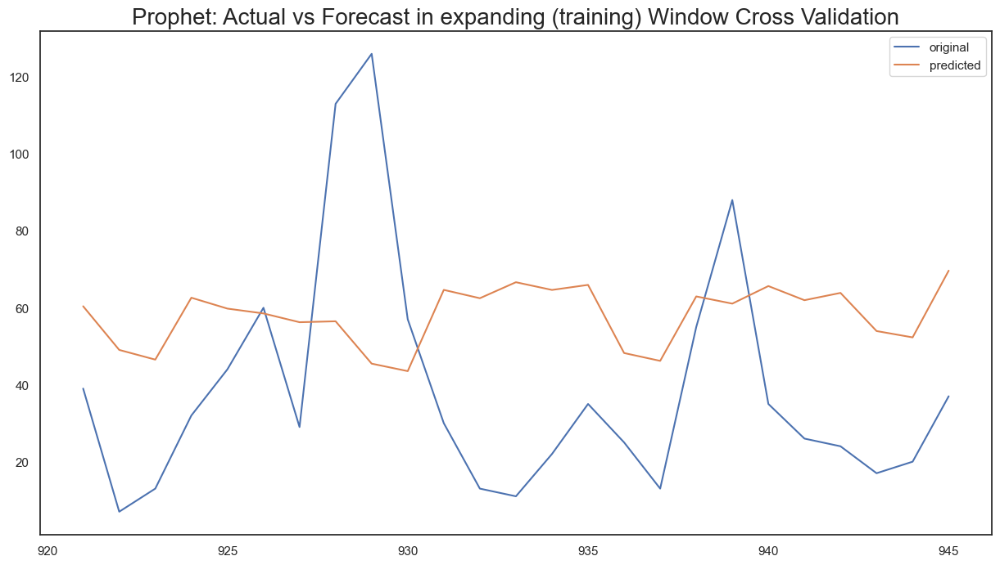

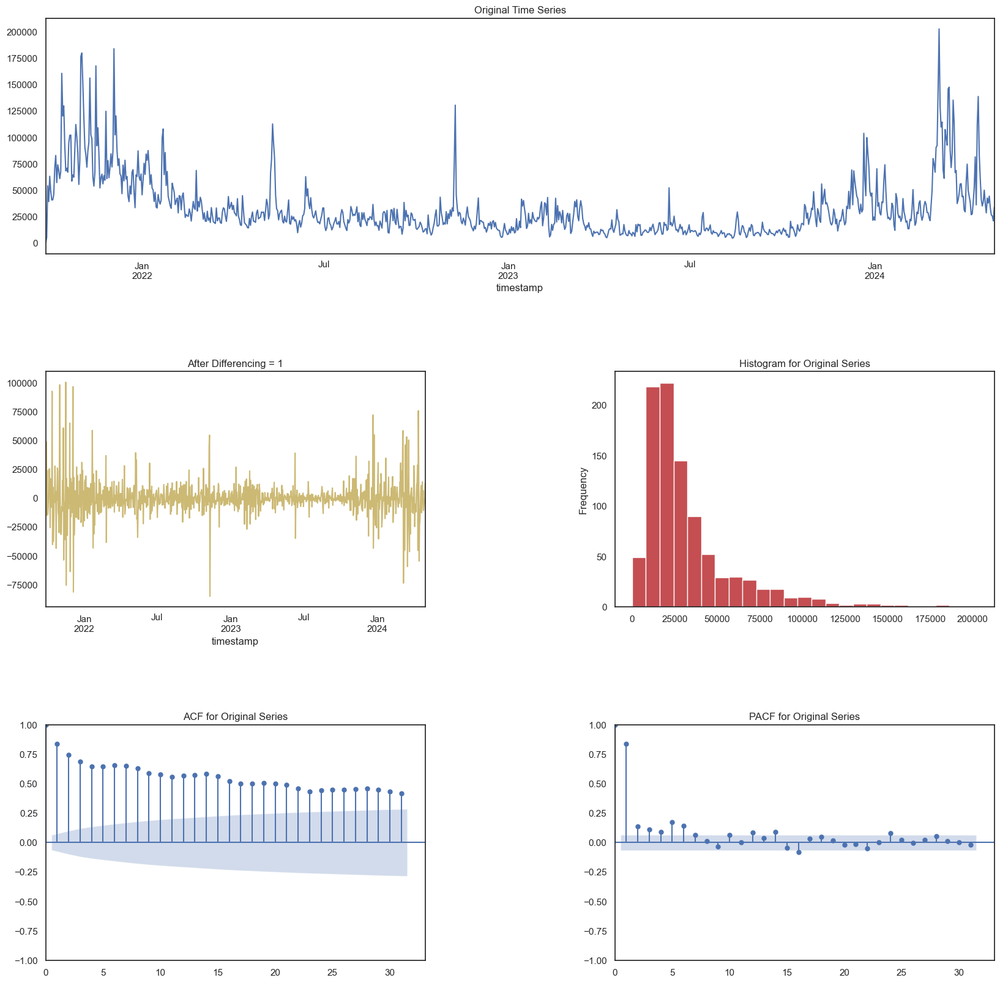

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 10, 'cv': 10}
    Fit-Predict data (shape=(946, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 921 Test Shape: 5


13:49:32 - cmdstanpy - INFO - Chain [1] start processing
13:49:33 - cmdstanpy - INFO - Chain [1] done processing
13:49:33 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 16,354.47
    Std Deviation of actuals = 9,473.20
    Normalized RMSE (as pct of std dev) = 173%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 926 Test Shape: 5


13:49:33 - cmdstanpy - INFO - Chain [1] done processing
13:49:34 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 53,409.54
    Std Deviation of actuals = 34,247.40
    Normalized RMSE (as pct of std dev) = 156%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 931 Test Shape: 5


13:49:34 - cmdstanpy - INFO - Chain [1] done processing
13:49:34 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 23,512.57
    Std Deviation of actuals = 9,193.28
    Normalized RMSE (as pct of std dev) = 256%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 936 Test Shape: 5


13:49:35 - cmdstanpy - INFO - Chain [1] done processing
13:49:35 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 25,011.85
    Std Deviation of actuals = 5,515.81
    Normalized RMSE (as pct of std dev) = 453%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 941 Test Shape: 5


13:49:35 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 36,019.18
    Std Deviation of actuals = 4,956.36
    Normalized RMSE (as pct of std dev) = 727%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 28604.78
    MSE (Mean Squared Error = 1119172436.93
    MAPE (Mean Absolute Percent Error) = 70%
    RMSE (Root Mean Squared Error) = 33454.0347
    Normalized RMSE (MinMax) = 28%
    Normalized RMSE (as Std Dev of Actuals)= 118%
Time Taken = 4 seconds


13:49:36 - cmdstanpy - INFO - Chain [1] start processing
13:49:36 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 30861.52


--------------------------------------------------
Total time taken: 9 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name     rmse
0  Prophet 30861.52
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (946, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+---------

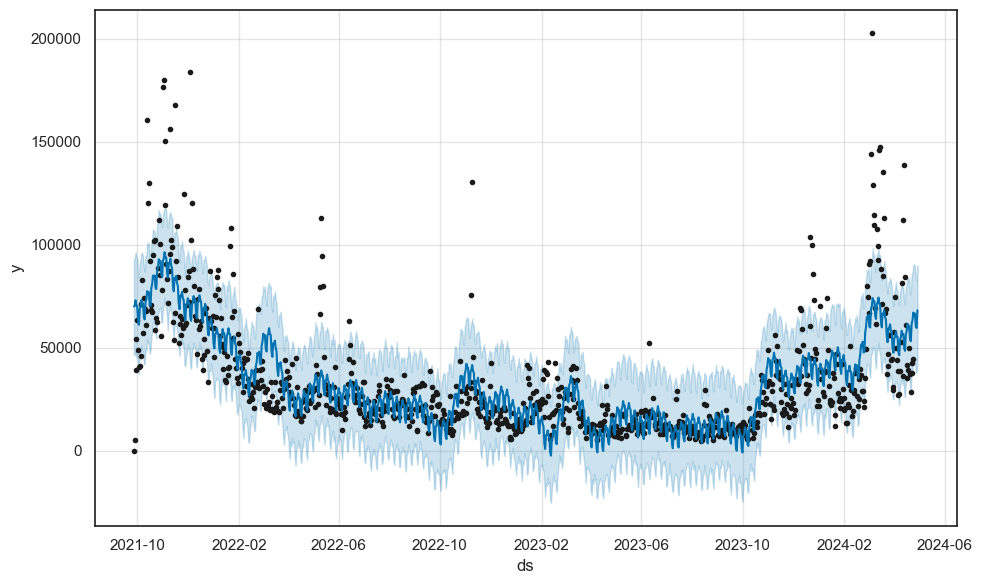

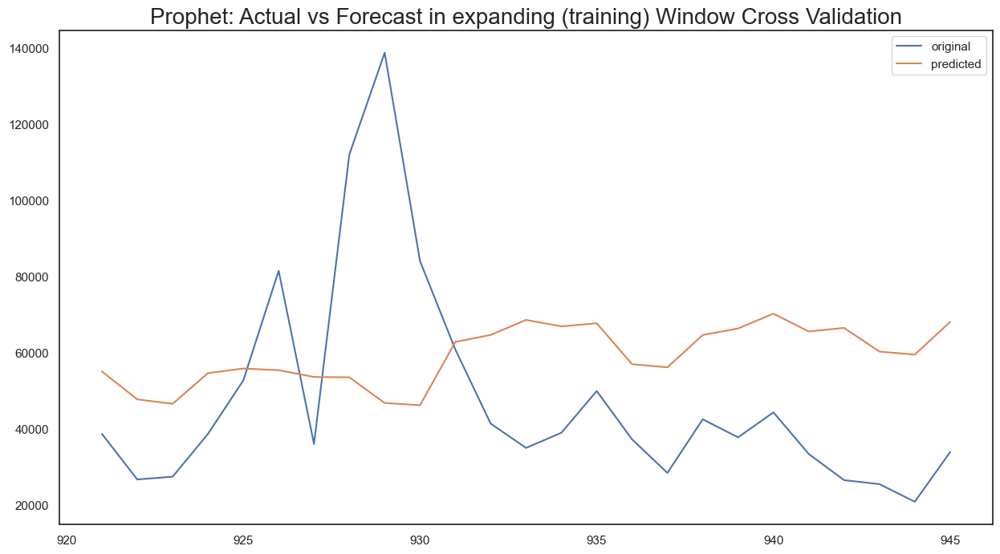

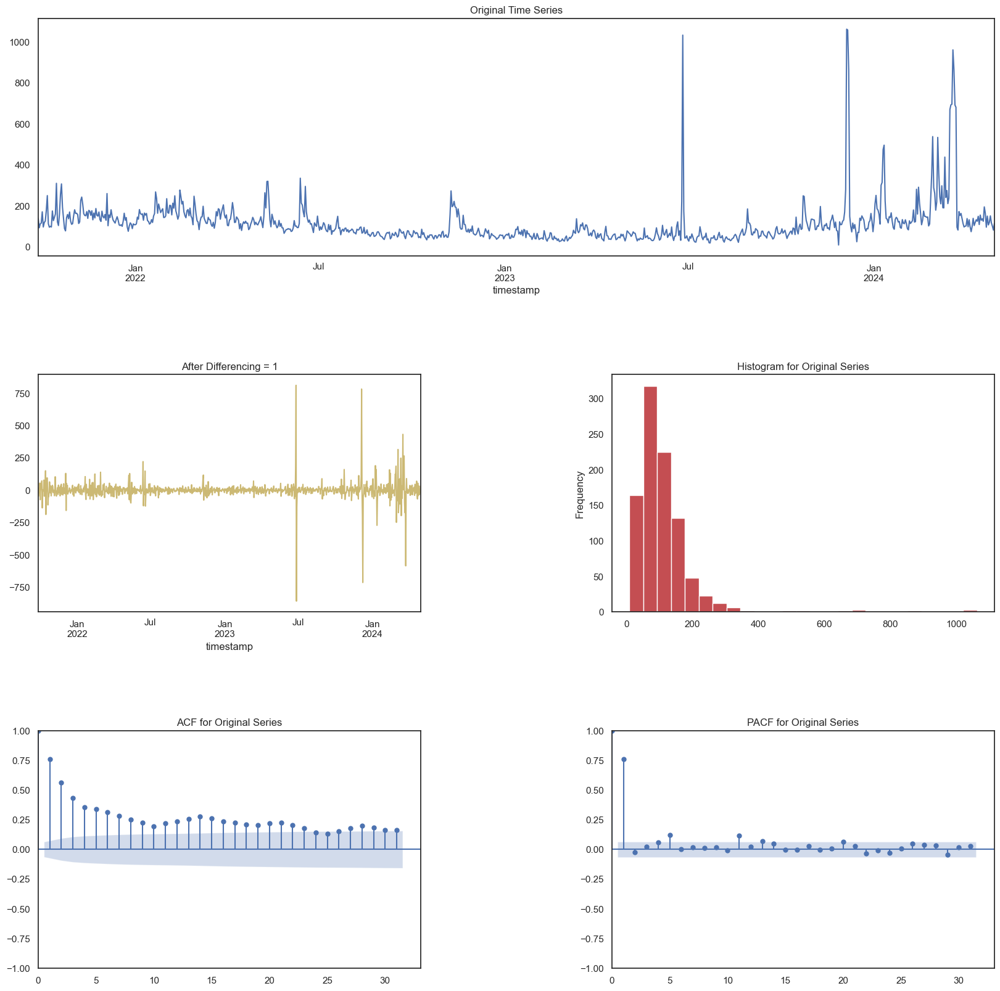

13:49:40 - cmdstanpy - INFO - Chain [1] start processing


Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 10, 'cv': 10}
    Fit-Predict data (shape=(946, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 921 Test Shape: 5


13:49:41 - cmdstanpy - INFO - Chain [1] done processing
13:49:41 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 104.23
    Std Deviation of actuals = 20.89
    Normalized RMSE (as pct of std dev) = 499%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 926 Test Shape: 5


13:49:41 - cmdstanpy - INFO - Chain [1] done processing
13:49:42 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 55.52
    Std Deviation of actuals = 13.42
    Normalized RMSE (as pct of std dev) = 414%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 931 Test Shape: 5


13:49:42 - cmdstanpy - INFO - Chain [1] done processing
13:49:42 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 57.48
    Std Deviation of actuals = 25.42
    Normalized RMSE (as pct of std dev) = 226%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 936 Test Shape: 5


13:49:42 - cmdstanpy - INFO - Chain [1] done processing
13:49:43 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 90.66
    Std Deviation of actuals = 25.78
    Normalized RMSE (as pct of std dev) = 352%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 941 Test Shape: 5


13:49:43 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 110.91
    Std Deviation of actuals = 22.67
    Normalized RMSE (as pct of std dev) = 489%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 78.38
    MSE (Mean Squared Error = 7553.76
    MAPE (Mean Absolute Percent Error) = 72%
    RMSE (Root Mean Squared Error) = 86.9123
    Normalized RMSE (MinMax) = 72%
    Normalized RMSE (as Std Dev of Actuals)= 316%
Time Taken = 3 seconds


13:49:44 - cmdstanpy - INFO - Chain [1] start processing
13:49:44 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 83.76


--------------------------------------------------
Total time taken: 8 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name  rmse
0  Prophet 83.76
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (946, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+------------------

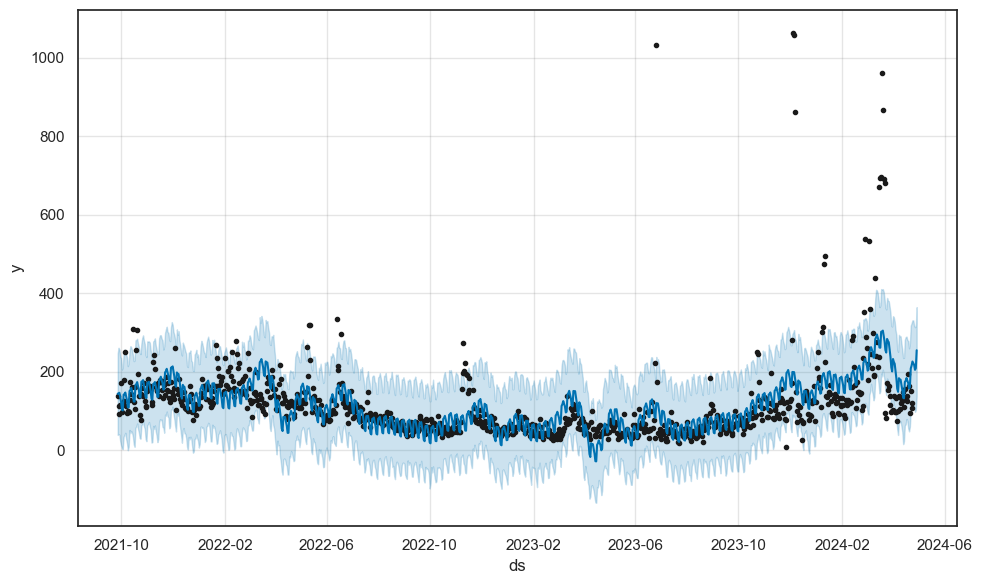

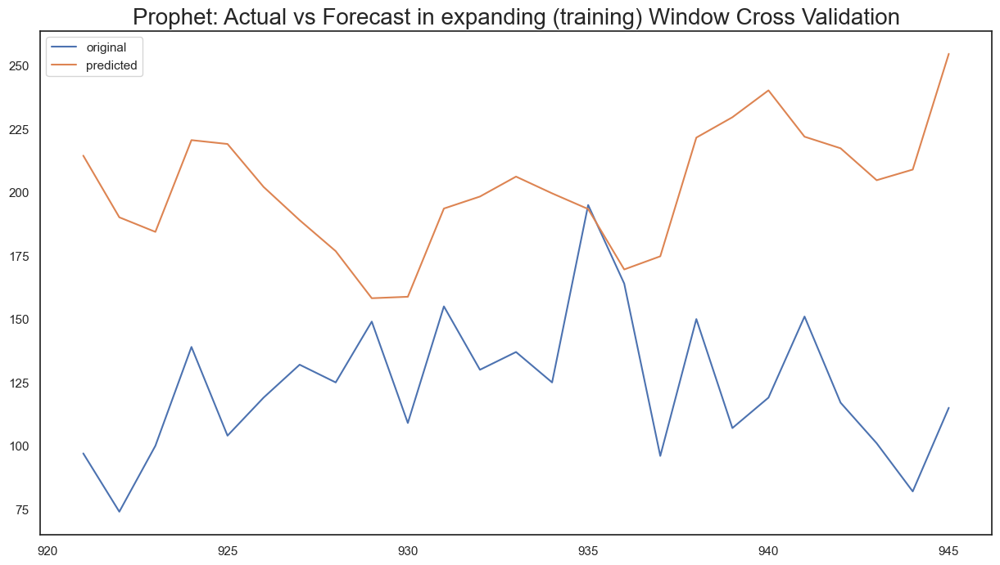

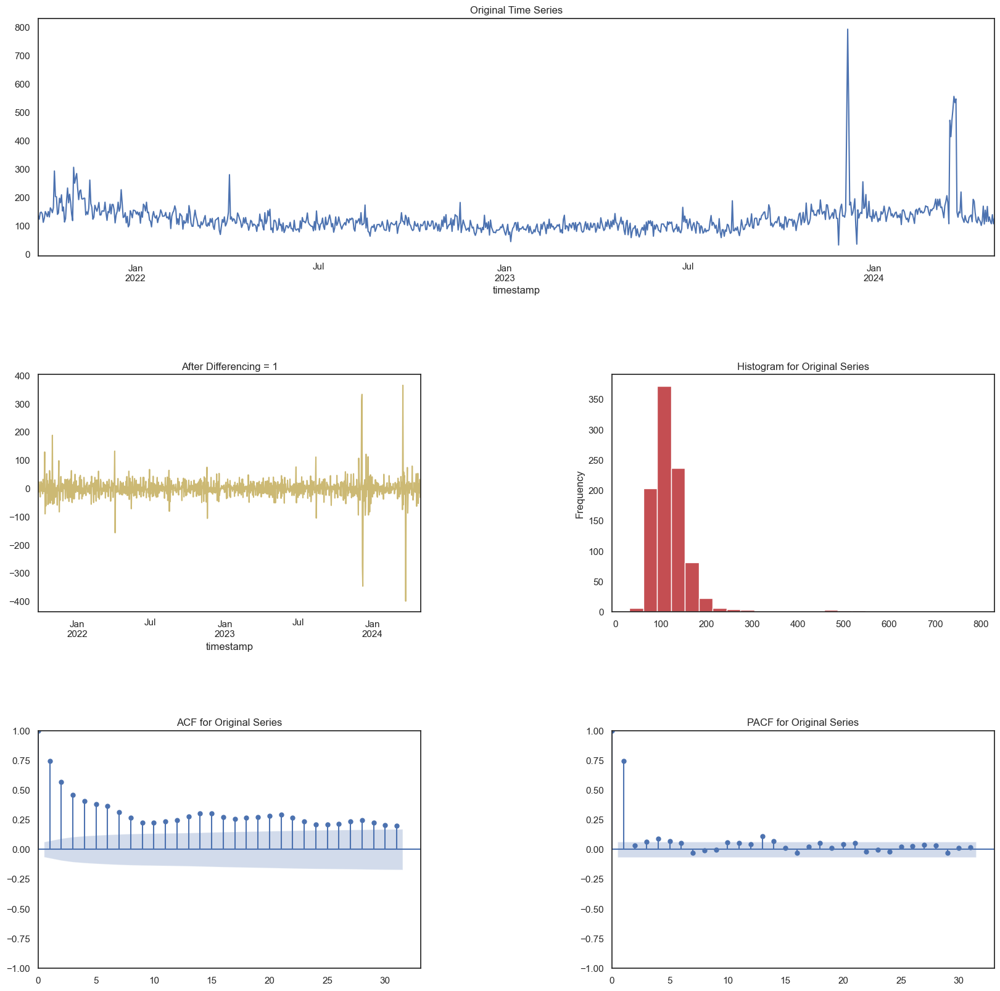

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 10, 'cv': 10}
    Fit-Predict data (shape=(946, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 921 Test Shape: 5


13:49:48 - cmdstanpy - INFO - Chain [1] start processing
13:49:48 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 39.93
    Std Deviation of actuals = 30.97
    Normalized RMSE (as pct of std dev) = 129%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 926 Test Shape: 5


13:49:49 - cmdstanpy - INFO - Chain [1] start processing
13:49:49 - cmdstanpy - INFO - Chain [1] done processing
13:49:50 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 56.58
    Std Deviation of actuals = 12.17
    Normalized RMSE (as pct of std dev) = 465%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 931 Test Shape: 5


13:49:51 - cmdstanpy - INFO - Chain [1] done processing
13:49:51 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 65.09
    Std Deviation of actuals = 24.41
    Normalized RMSE (as pct of std dev) = 267%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 936 Test Shape: 5


13:49:51 - cmdstanpy - INFO - Chain [1] done processing
13:49:52 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 45.29
    Std Deviation of actuals = 21.40
    Normalized RMSE (as pct of std dev) = 212%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 941 Test Shape: 5


13:49:52 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 58.31
    Std Deviation of actuals = 12.27
    Normalized RMSE (as pct of std dev) = 475%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 48.22
    MSE (Mean Squared Error = 2896.51
    MAPE (Mean Absolute Percent Error) = 41%
    RMSE (Root Mean Squared Error) = 53.8192
    Normalized RMSE (MinMax) = 58%
    Normalized RMSE (as Std Dev of Actuals)= 212%
Time Taken = 5 seconds


13:49:53 - cmdstanpy - INFO - Chain [1] start processing
13:49:53 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 53.04


--------------------------------------------------
Total time taken: 9 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name  rmse
0  Prophet 53.04
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (946, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+------------------

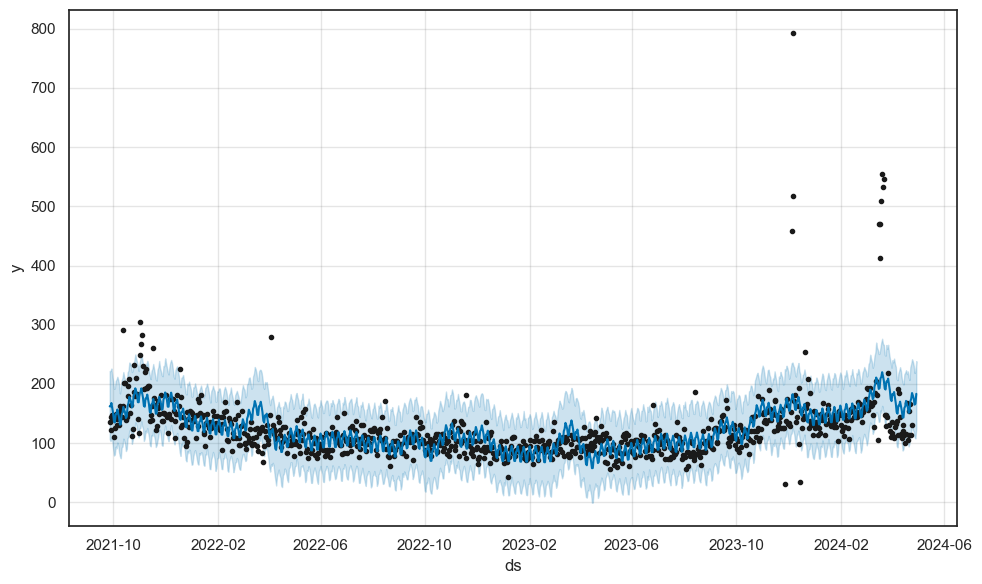

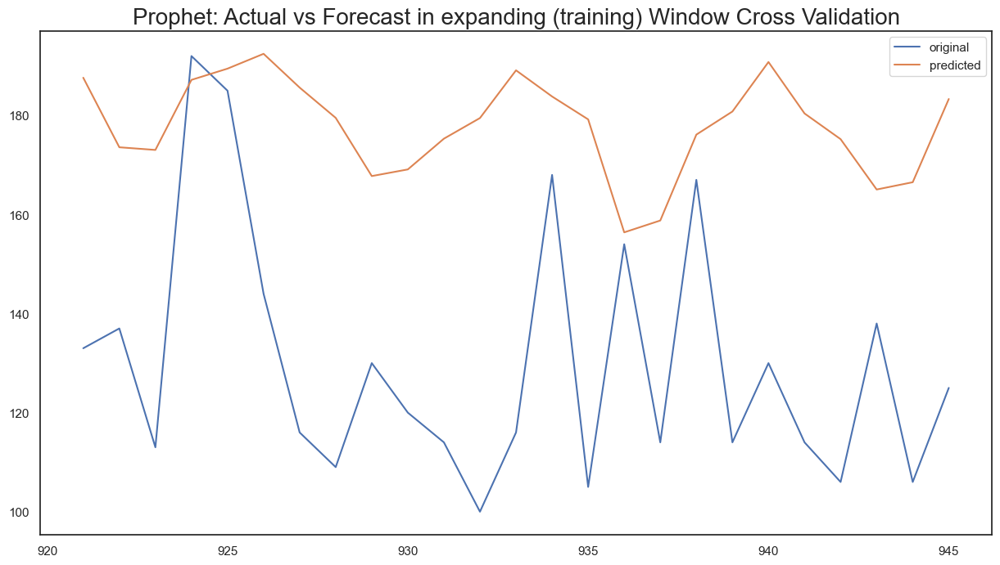

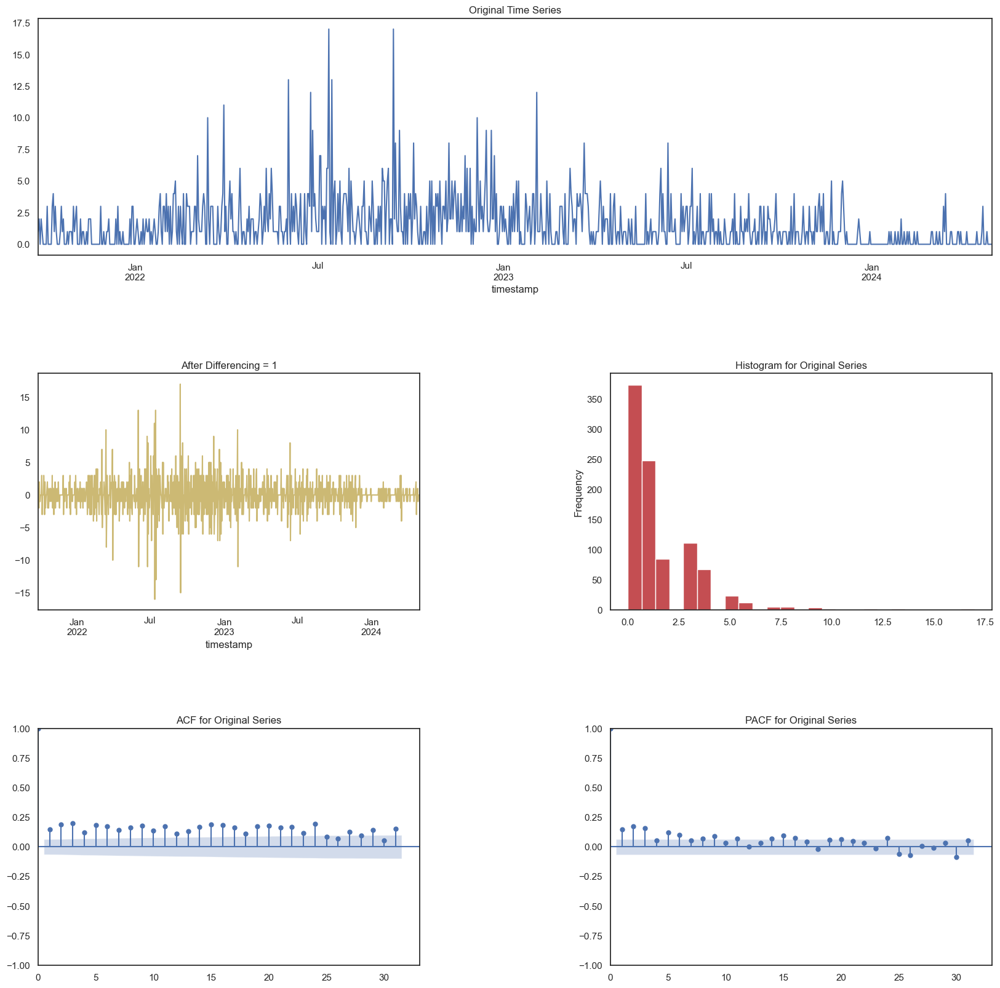

13:49:57 - cmdstanpy - INFO - Chain [1] start processing


Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 10, 'cv': 10}
    Fit-Predict data (shape=(946, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 921 Test Shape: 5


13:49:57 - cmdstanpy - INFO - Chain [1] done processing
13:49:57 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 0.40
    Std Deviation of actuals = 0.00
    Normalized RMSE (as pct of std dev) = inf%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 926 Test Shape: 5


13:49:57 - cmdstanpy - INFO - Chain [1] done processing
13:49:58 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 0.85
    Std Deviation of actuals = 0.40
    Normalized RMSE (as pct of std dev) = 214%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 931 Test Shape: 5


13:49:58 - cmdstanpy - INFO - Chain [1] done processing
13:49:59 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 0.51
    Std Deviation of actuals = 0.40
    Normalized RMSE (as pct of std dev) = 126%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 936 Test Shape: 5


13:49:59 - cmdstanpy - INFO - Chain [1] done processing
13:49:59 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 1.83
    Std Deviation of actuals = 1.17
    Normalized RMSE (as pct of std dev) = 157%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 941 Test Shape: 5


13:50:00 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 0.57
    Std Deviation of actuals = 0.00
    Normalized RMSE (as pct of std dev) = inf%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 0.57
    MSE (Mean Squared Error = 0.96
    MAPE (Mean Absolute Percent Error) = inf%
    RMSE (Root Mean Squared Error) = 0.9804
    Normalized RMSE (MinMax) = 33%
    Normalized RMSE (as Std Dev of Actuals)= 148%
Time Taken = 4 seconds


13:50:00 - cmdstanpy - INFO - Chain [1] start processing
13:50:01 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 0.83


--------------------------------------------------
Total time taken: 8 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name  rmse
0  Prophet  0.83
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (946, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+-------------------

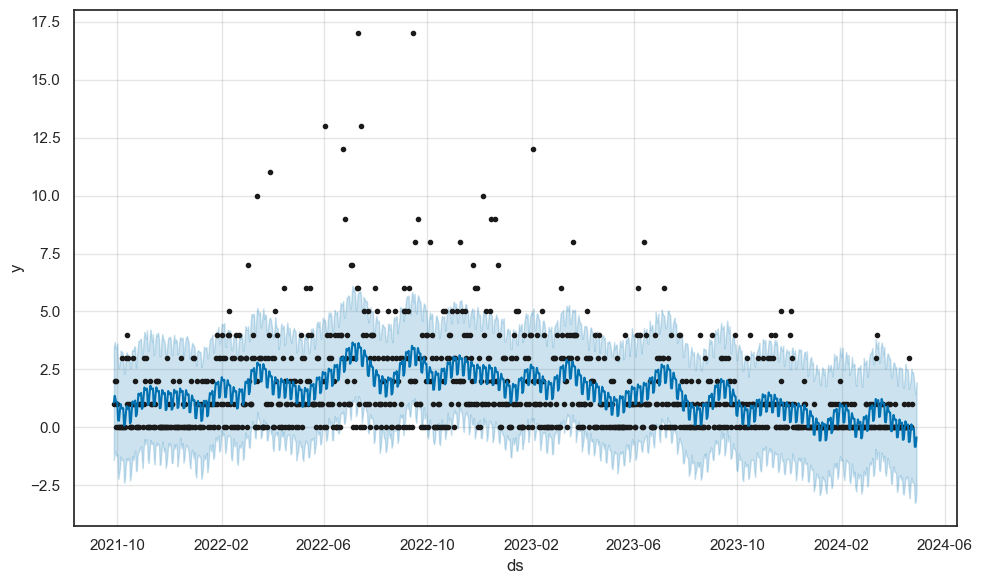

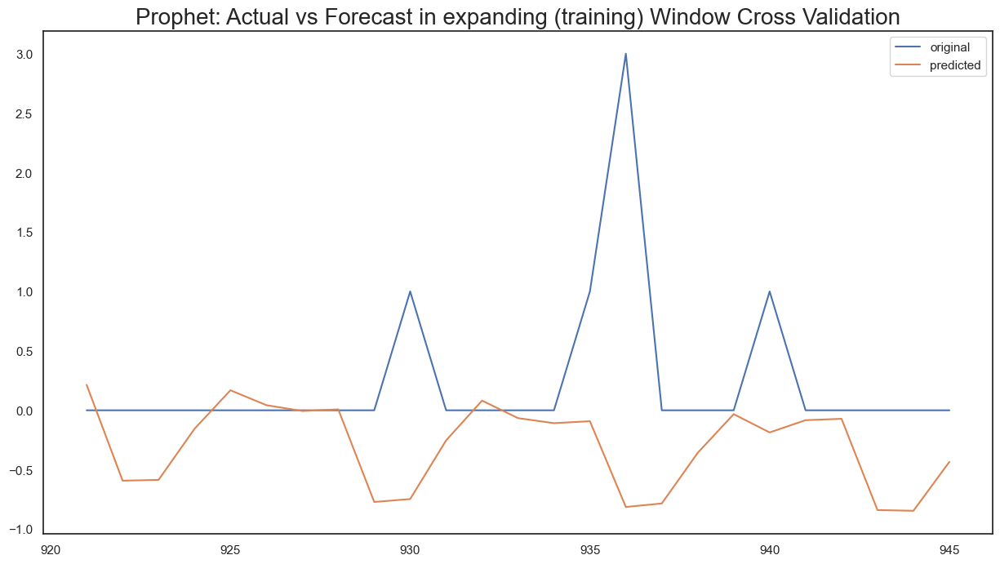

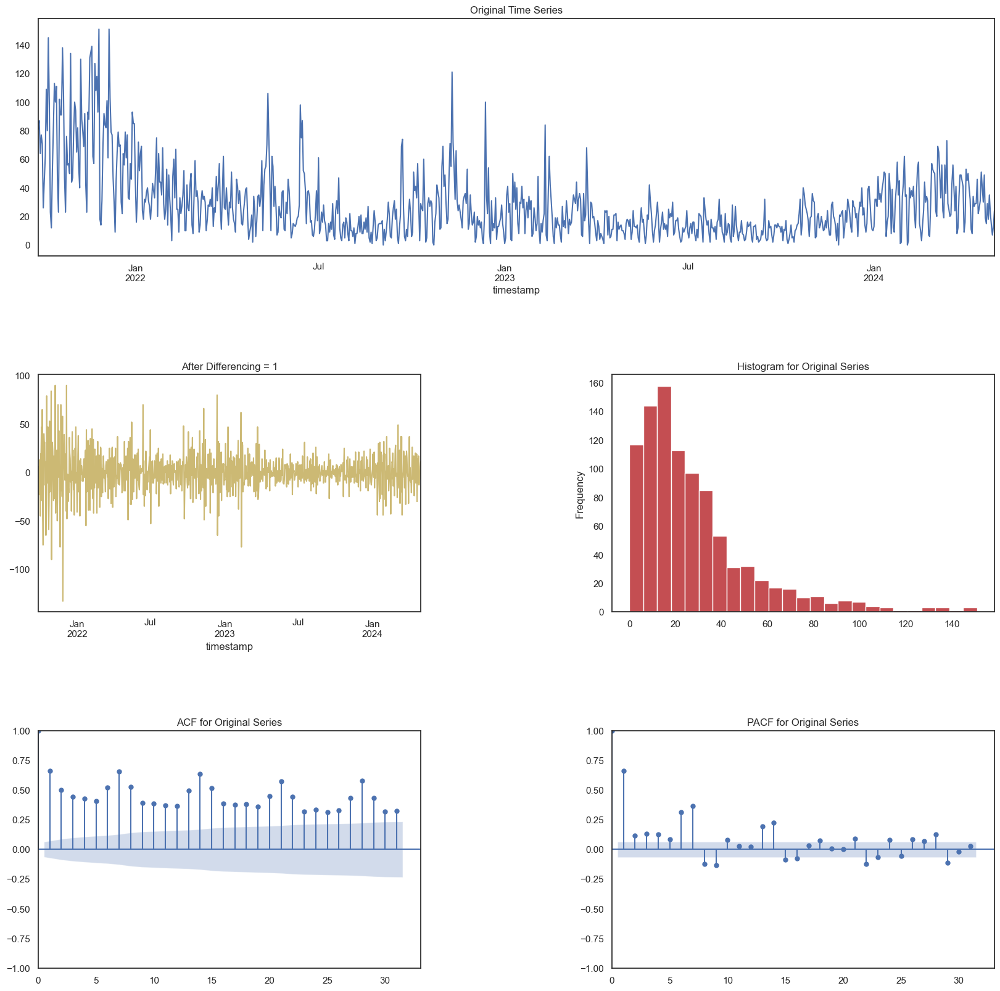

13:50:04 - cmdstanpy - INFO - Chain [1] start processing


Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 10, 'cv': 10}
    Fit-Predict data (shape=(946, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 921 Test Shape: 5


13:50:04 - cmdstanpy - INFO - Chain [1] done processing
13:50:05 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 3.79
    Std Deviation of actuals = 10.82
    Normalized RMSE (as pct of std dev) = 35%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 926 Test Shape: 5


13:50:05 - cmdstanpy - INFO - Chain [1] done processing
13:50:06 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 9.57
    Std Deviation of actuals = 8.21
    Normalized RMSE (as pct of std dev) = 117%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 931 Test Shape: 5


13:50:06 - cmdstanpy - INFO - Chain [1] done processing
13:50:06 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 11.40
    Std Deviation of actuals = 8.75
    Normalized RMSE (as pct of std dev) = 130%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 936 Test Shape: 5


13:50:06 - cmdstanpy - INFO - Chain [1] done processing
13:50:07 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 8.93
    Std Deviation of actuals = 7.55
    Normalized RMSE (as pct of std dev) = 118%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 941 Test Shape: 5


13:50:07 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 16.34
    Std Deviation of actuals = 6.23
    Normalized RMSE (as pct of std dev) = 262%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 8.57
    MSE (Mean Squared Error = 116.56
    MAPE (Mean Absolute Percent Error) = 42%
    RMSE (Root Mean Squared Error) = 10.7965
    Normalized RMSE (MinMax) = 25%
    Normalized RMSE (as Std Dev of Actuals)= 90%
Time Taken = 4 seconds


13:50:08 - cmdstanpy - INFO - Chain [1] start processing
13:50:08 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 10.01


--------------------------------------------------
Total time taken: 8 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name  rmse
0  Prophet 10.01
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (946, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+------------------

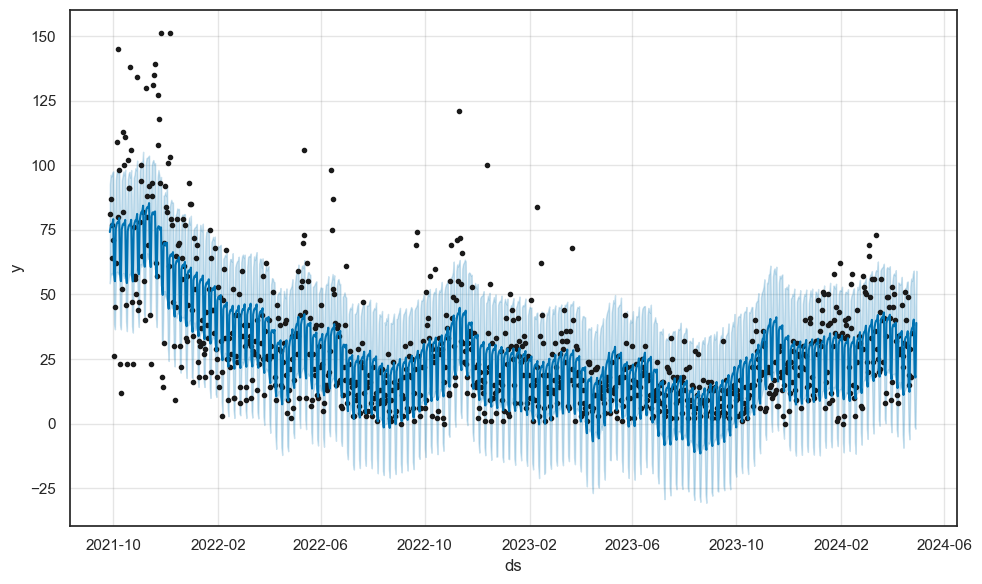

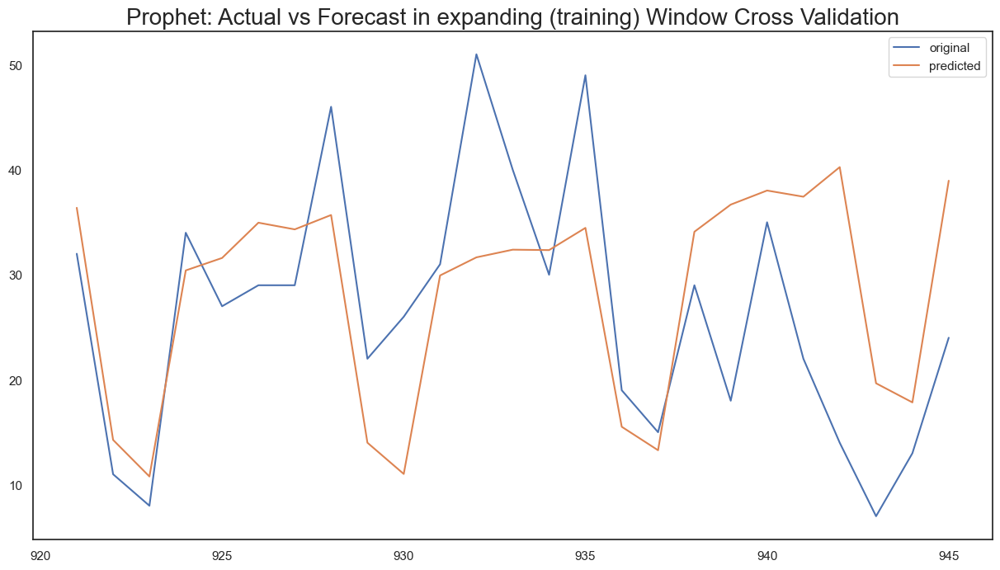

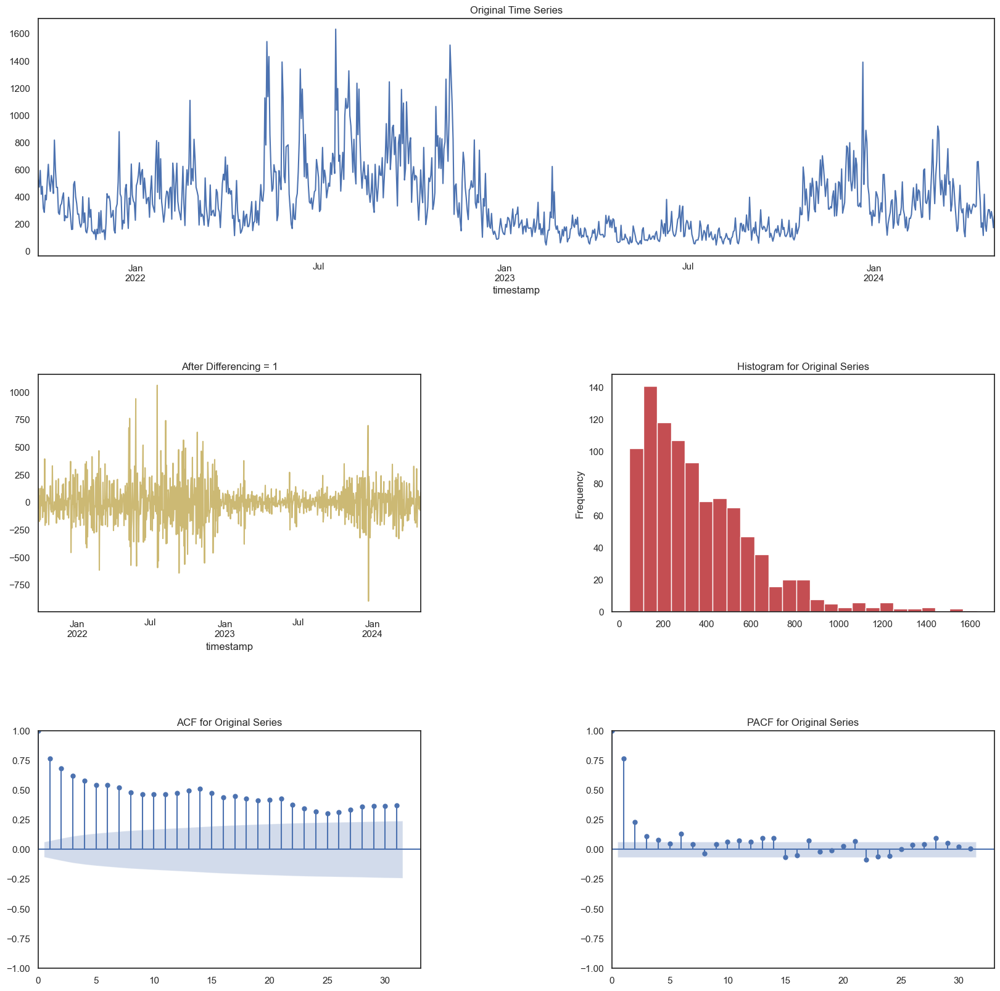

13:50:12 - cmdstanpy - INFO - Chain [1] start processing


Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 10, 'cv': 10}
    Fit-Predict data (shape=(946, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 921 Test Shape: 5


13:50:12 - cmdstanpy - INFO - Chain [1] done processing
13:50:13 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 114.64
    Std Deviation of actuals = 25.84
    Normalized RMSE (as pct of std dev) = 444%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 926 Test Shape: 5


13:50:13 - cmdstanpy - INFO - Chain [1] done processing
13:50:13 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 219.15
    Std Deviation of actuals = 147.60
    Normalized RMSE (as pct of std dev) = 148%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 931 Test Shape: 5


13:50:13 - cmdstanpy - INFO - Chain [1] done processing
13:50:14 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 194.89
    Std Deviation of actuals = 115.65
    Normalized RMSE (as pct of std dev) = 169%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 936 Test Shape: 5


13:50:14 - cmdstanpy - INFO - Chain [1] done processing
13:50:14 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 134.85
    Std Deviation of actuals = 62.73
    Normalized RMSE (as pct of std dev) = 215%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 941 Test Shape: 5


13:50:15 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 166.57
    Std Deviation of actuals = 39.03
    Normalized RMSE (as pct of std dev) = 427%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 152.57
    MSE (Mean Squared Error = 29015.82
    MAPE (Mean Absolute Percent Error) = 61%
    RMSE (Root Mean Squared Error) = 170.3403
    Normalized RMSE (MinMax) = 31%
    Normalized RMSE (as Std Dev of Actuals)= 126%
Time Taken = 3 seconds


13:50:15 - cmdstanpy - INFO - Chain [1] start processing
13:50:15 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 166.02


--------------------------------------------------
Total time taken: 7 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name   rmse
0  Prophet 166.02
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (946, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+---------------

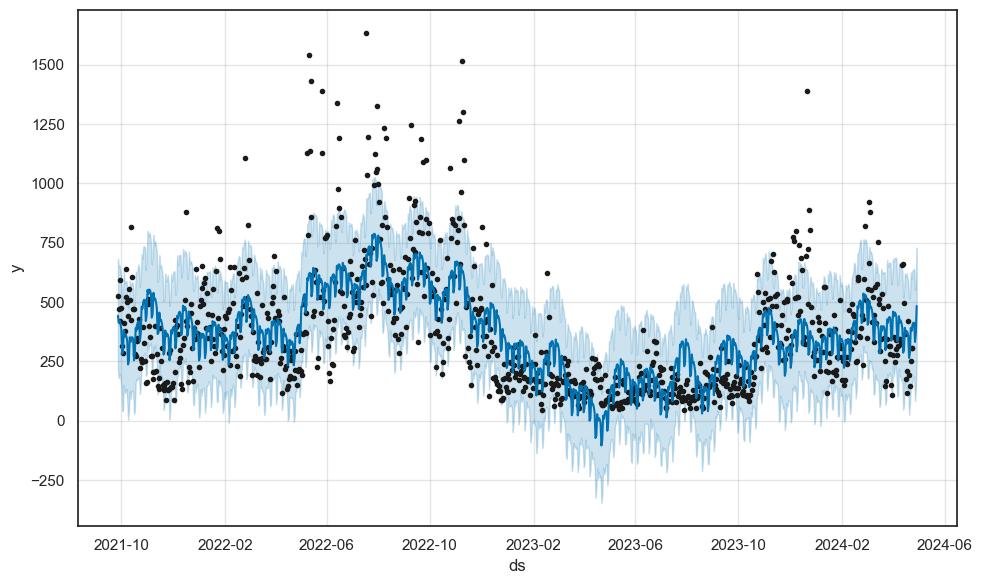

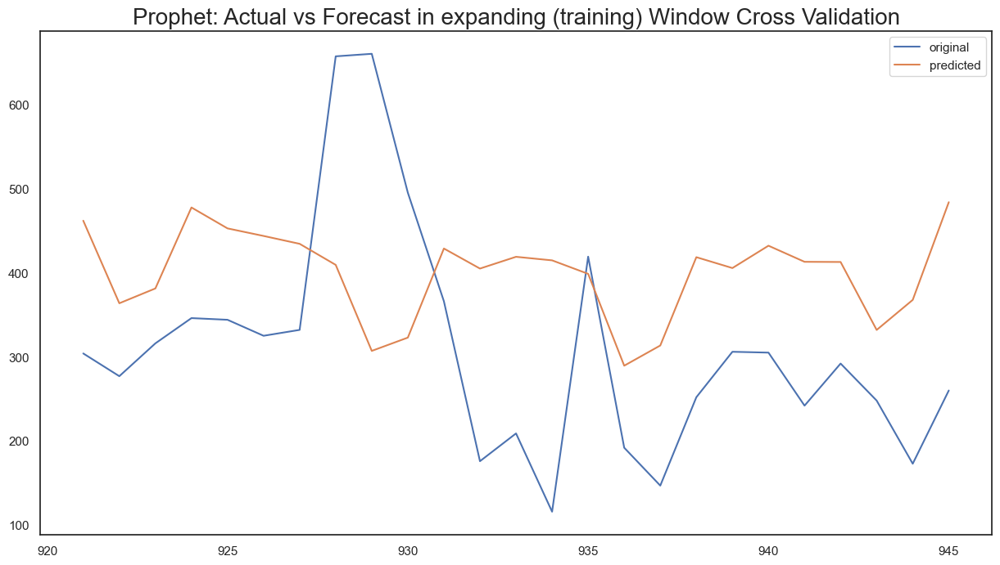

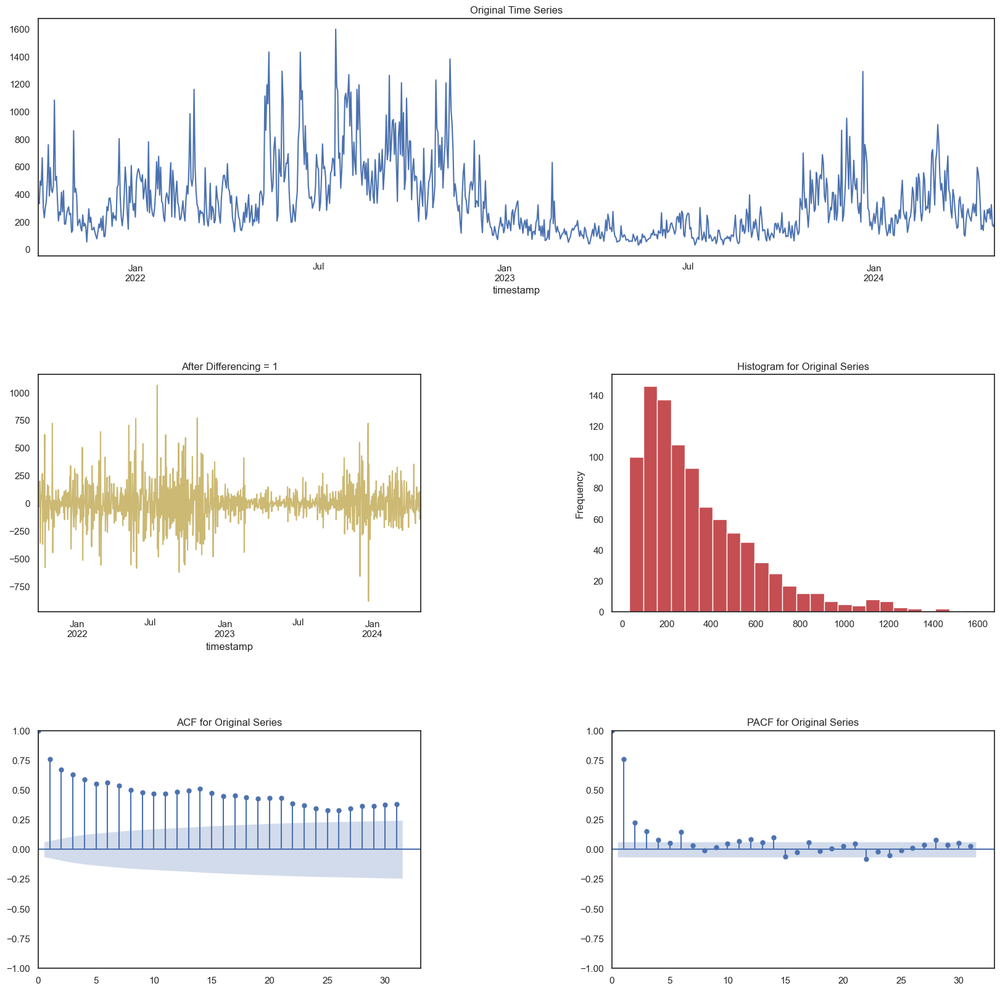

13:50:19 - cmdstanpy - INFO - Chain [1] start processing


Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 10, 'cv': 10}
    Fit-Predict data (shape=(946, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 921 Test Shape: 5


13:50:19 - cmdstanpy - INFO - Chain [1] done processing
13:50:20 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 127.74
    Std Deviation of actuals = 44.56
    Normalized RMSE (as pct of std dev) = 287%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 926 Test Shape: 5


13:50:20 - cmdstanpy - INFO - Chain [1] done processing
13:50:20 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 197.34
    Std Deviation of actuals = 134.36
    Normalized RMSE (as pct of std dev) = 147%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 931 Test Shape: 5


13:50:21 - cmdstanpy - INFO - Chain [1] done processing
13:50:21 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 171.03
    Std Deviation of actuals = 77.70
    Normalized RMSE (as pct of std dev) = 220%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 936 Test Shape: 5


13:50:21 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 87.51
    Std Deviation of actuals = 38.62
    Normalized RMSE (as pct of std dev) = 227%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 941 Test Shape: 5


13:50:22 - cmdstanpy - INFO - Chain [1] start processing
13:50:22 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 175.50
    Std Deviation of actuals = 57.31
    Normalized RMSE (as pct of std dev) = 306%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 140.57
    MSE (Mean Squared Error = 24594.46
    MAPE (Mean Absolute Percent Error) = 61%
    RMSE (Root Mean Squared Error) = 156.8262
    Normalized RMSE (MinMax) = 34%
    Normalized RMSE (as Std Dev of Actuals)= 134%
Time Taken = 4 seconds


13:50:23 - cmdstanpy - INFO - Chain [1] start processing
13:50:23 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 151.83


--------------------------------------------------
Total time taken: 8 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name   rmse
0  Prophet 151.83
Start of Fit.....
    Target variable given as = target
Start of loading of data.....
    Inputs: ts_column = timestamp, sep = ,, target = ['target']
    Using given input: pandas dataframe...
    timestamp column exists in given train data...
    train data shape = (946, 1)
Alert: Could not detect strf_time_format of timestamp. Provide strf_time format during "setup" for better results.

Running Augmented Dickey-Fuller test with paramters:
    maxlag: 31 regression: c autolag: BIC
Results of Augmented Dickey-Fuller Test:
+-----------------------------+------------------------------+
|                             | Dickey-Fuller Augmented Test |
+-----------------------------+---------------

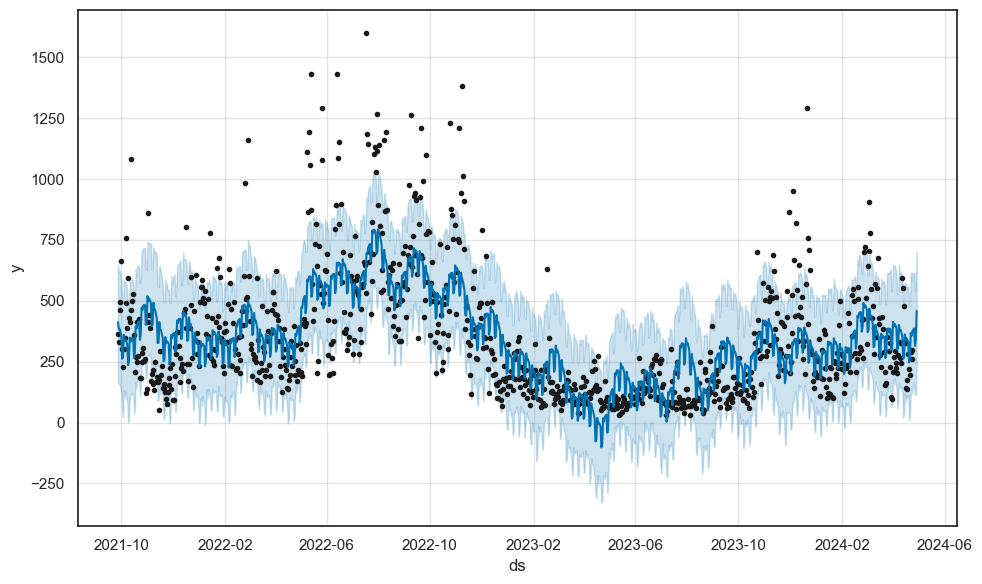

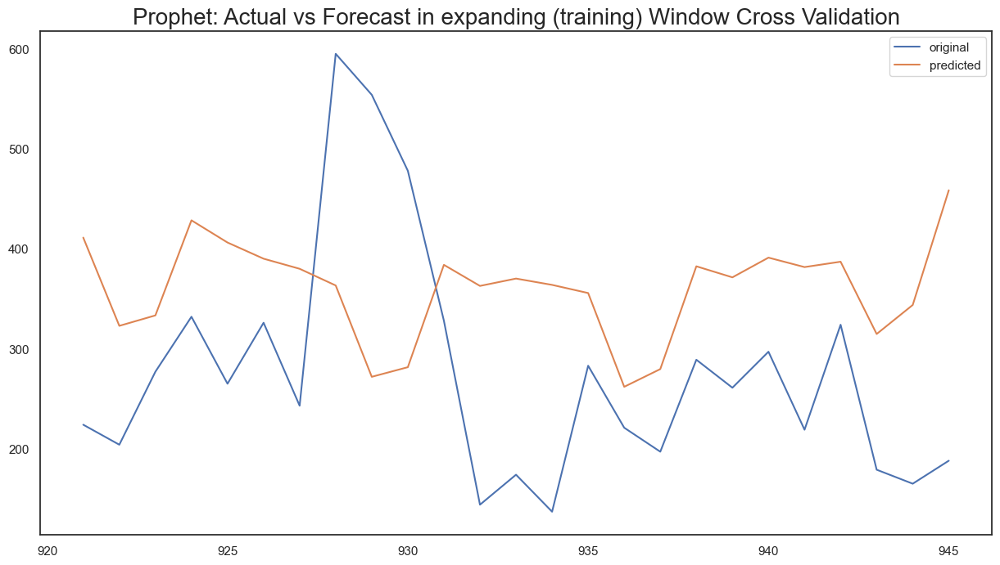

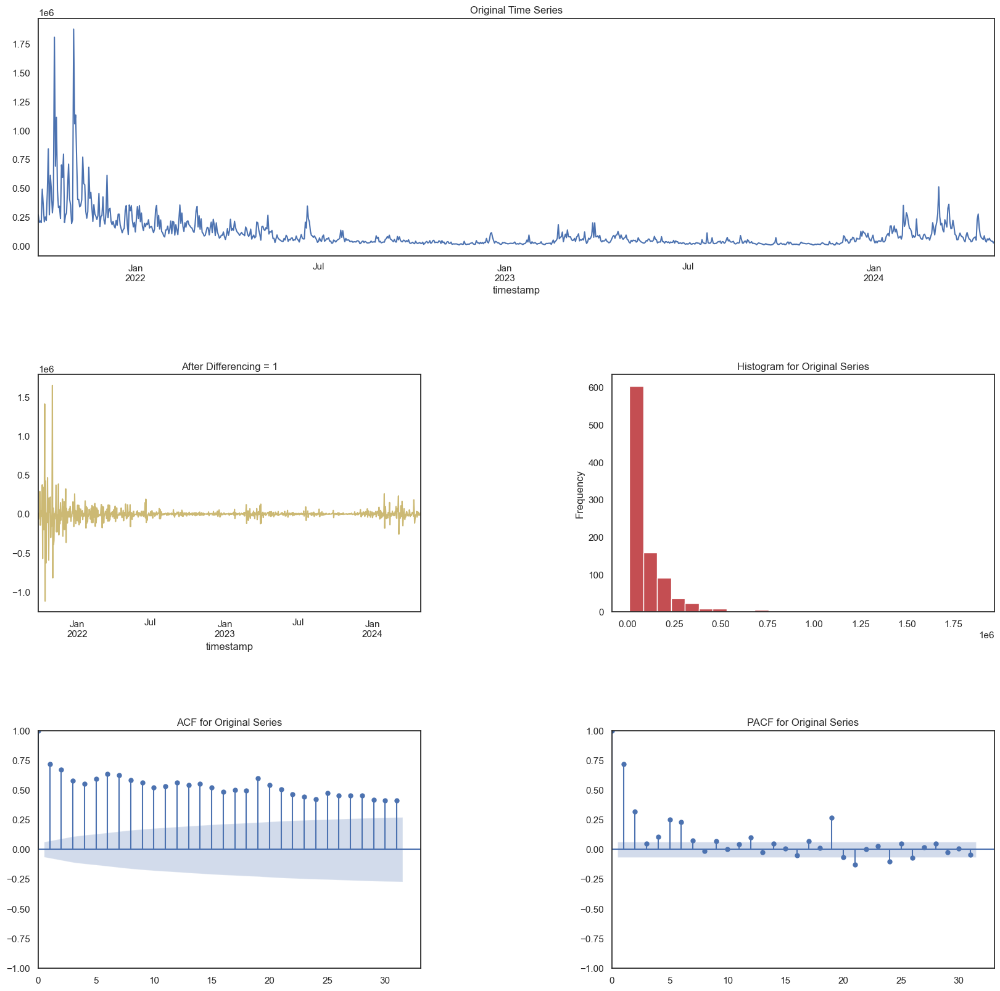

Time Interval is given as D
    Correct Time interval given as a valid Pandas date-range frequency...


Building Prophet Model



Running Facebook Prophet Model...
kwargs for Prophet model: {'forecast_periods': 10, 'cv': 10}
    Fit-Predict data (shape=(946, 2)) with Confidence Interval = 0.95...
  Starting Prophet Fit
       Adding daily seasonality to Prophet with period=12, fourier_order=15 and prior_scale=0.10
  Starting Prophet Cross Validation
Max. iterations using expanding window cross validation = 5

Fold Number: 1 --> Train Shape: 921 Test Shape: 5


13:50:27 - cmdstanpy - INFO - Chain [1] start processing
13:50:27 - cmdstanpy - INFO - Chain [1] done processing
13:50:28 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 93,969.96
    Std Deviation of actuals = 13,257.45
    Normalized RMSE (as pct of std dev) = 709%
Cross Validation window: 1 completed

Fold Number: 2 --> Train Shape: 926 Test Shape: 5


13:50:28 - cmdstanpy - INFO - Chain [1] done processing
13:50:29 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 92,524.18
    Std Deviation of actuals = 86,388.43
    Normalized RMSE (as pct of std dev) = 107%
Cross Validation window: 2 completed

Fold Number: 3 --> Train Shape: 931 Test Shape: 5


13:50:29 - cmdstanpy - INFO - Chain [1] done processing
13:50:29 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 104,192.48
    Std Deviation of actuals = 14,413.88
    Normalized RMSE (as pct of std dev) = 723%
Cross Validation window: 3 completed

Fold Number: 4 --> Train Shape: 936 Test Shape: 5


13:50:29 - cmdstanpy - INFO - Chain [1] done processing
13:50:30 - cmdstanpy - INFO - Chain [1] start processing


    RMSE = 104,343.63
    Std Deviation of actuals = 11,106.75
    Normalized RMSE (as pct of std dev) = 939%
Cross Validation window: 4 completed

Fold Number: 5 --> Train Shape: 941 Test Shape: 5


13:50:30 - cmdstanpy - INFO - Chain [1] done processing


    RMSE = 104,096.07
    Std Deviation of actuals = 7,282.86
    Normalized RMSE (as pct of std dev) = 1429%
Cross Validation window: 5 completed

-------------------------------------------
Model Cross Validation Results:
-------------------------------------------
    MAE (Mean Absolute Error = 97953.61
    MSE (Mean Squared Error = 9994147013.46
    MAPE (Mean Absolute Percent Error) = 180%
    RMSE (Root Mean Squared Error) = 99970.7308
    Normalized RMSE (MinMax) = 40%
    Normalized RMSE (as Std Dev of Actuals)= 167%
Time Taken = 4 seconds


13:50:31 - cmdstanpy - INFO - Chain [1] start processing
13:50:31 - cmdstanpy - INFO - Chain [1] done processing


  End of Prophet Fit

Best Model is: Prophet
    Best Model (Mean CV) Score: 99825.26


--------------------------------------------------
Total time taken: 8 seconds.
--------------------------------------------------


Leaderboard with best model on top of list:
       name     rmse
0  Prophet 99825.26


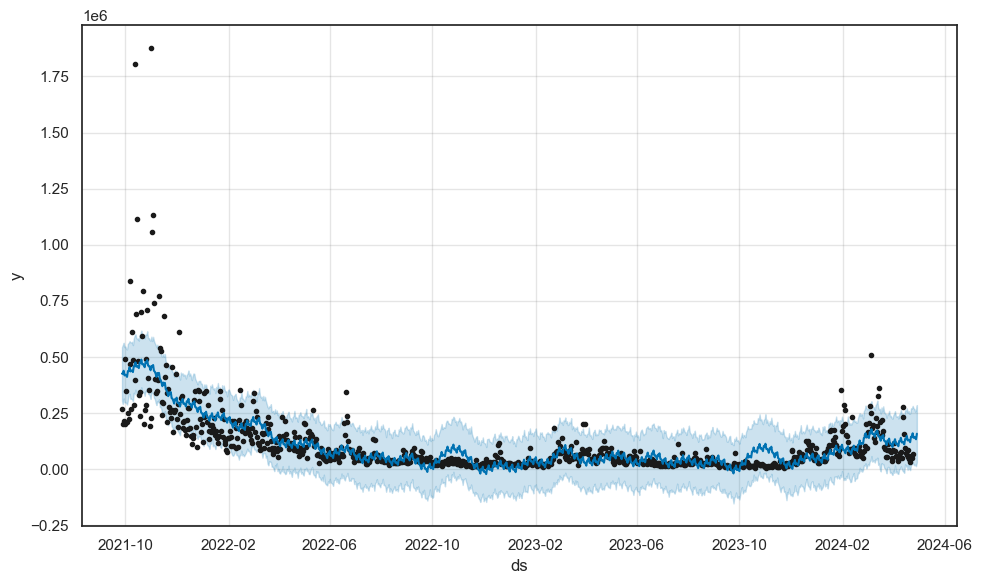

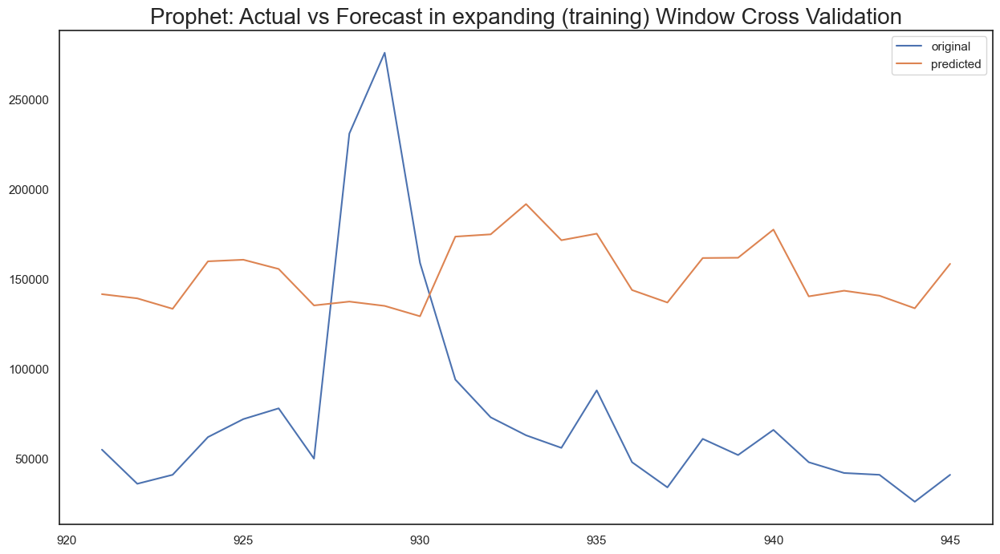

In [22]:
# Crear un diccionario para almacenar los modelos
trained_models = {}

# Iterar sobre cada columna seleccionada
for column in columns_to_model:
    # Excluir 'Open_time' del bucle de iteración
    if column != 'Open_time':
        # Seleccionar solo la columna actual y la columna de tiempo (Open_time)
        data = feature_dataset[['Open_time', column]]
        
        # Renombrar las columnas para que auto_ts pueda identificar la columna de tiempo
        data.columns = ['timestamp', 'target']
        
        # Convertir la columna de tiempo a tipo datetime
        data['timestamp'] = pd.to_datetime(data['timestamp'])
        
        # Entrenar el modelo utilizando auto_timeseries
        model = auto_timeseries(score_type='rmse', time_interval='D',
                                non_seasonal_pdq=None, seasonality=True,
                                model_type='prophet', verbose=2, forecast_periods=n_days_to_predict, cv=10)
        
        model.fit(data, 'timestamp', 'target')
        
        # Guardar el modelo en el diccionario
        trained_models[column] = model

#### Guardo el mejor modelo para cada columna

In [23]:
for column, model in trained_models.items():
    # Guarda el modelo en un archivo usando dill
    with open(f"auto_timeseries_models_prophet/{column}.pkl", "wb") as file:
        dill.dump(model, file)

#### Vuelvo a armar el mejor modelo para cada columna

In [24]:
loaded_models = {}

# Itera sobre los archivos guardados
for column in columns_to_model:
    if column != 'Open_time':
        # Cargar el modelo desde el archivo
        with open(f"auto_timeseries_models_prophet/{column}.pkl", "rb") as file:
            loaded_model = dill.load(file)
        
        # Guardar el modelo cargado en el diccionario
        loaded_models[column] = loaded_model

#### Prediccion N dias en el futuro

In [25]:
def calcular_indicadores_tecnicos(predictions_next_day, feature_dataset, n_days_to_predict):
    # Concatenar la columna Close de predictions_next_day y feature_dataset
    concatenated_df = pd.concat([feature_dataset['Close'], predictions_next_day['Close']], axis=0)

    # Calcular los indicadores sobre el nuevo dataset
    close_prices = np.array(concatenated_df, dtype=np.double)
    sma_20 = talib.SMA(close_prices, timeperiod=20)
    ema_20 = talib.EMA(close_prices, timeperiod=20)
    upper_band, middle_band, lower_band = talib.BBANDS(close_prices, timeperiod=20, nbdevup=2, nbdevdn=2)
    rsi = talib.RSI(close_prices, timeperiod=14)

    # Crear un DataFrame para almacenar los indicadores técnicos
    indicadores = pd.DataFrame({
        'SMA_20': sma_20,
        'EMA_20': ema_20,
        'Upper_Band': upper_band,
        'Middle_Band': middle_band,
        'Lower_Band': lower_band,
        'RSI': rsi
    })

    # Obtener los últimos 5 registros del dataset con los indicadores
    ultimos_indicadores = indicadores.tail(n_days_to_predict)
    ultimos_indicadores.index = predictions_next_day.index

    # Unir los DataFrames por sus índices
    resultado = pd.concat([predictions_next_day, ultimos_indicadores], axis=1)


    return resultado

In [26]:
def hacer_predicciones_para_N_dias_siguientes(trained_models, n_days_to_predict):
    predictions = {}

    for feature, model in trained_models.items():
        
        # Realizar la predicción para la característica actual
        prediction = model.predict(testdata=n_days_to_predict, model='best')
        # display(prediction)
        # Obtener solo el valor 'yhat' de la predicción
        prediction_yhat = prediction['yhat']
        prediction_open_time = prediction.index
        
        # Almacenar la predicción en el diccionario
        predictions[feature] = prediction_yhat
        predictions['Open_time'] = prediction_open_time

    # Convertir el diccionario de predicciones en un DataFrame de pandas
    predictions_df = pd.DataFrame(predictions)

    return predictions_df

In [27]:
predictions_next_day = hacer_predicciones_para_N_dias_siguientes(loaded_models, n_days_to_predict)
display(predictions_next_day)

predictions_next_day = calcular_indicadores_tecnicos(predictions_next_day, feature_dataset, n_days_to_predict)
display(predictions_next_day)

Predicting using forecast period=10 as input for Prophet model
Building Forecast dataframe. Forecast Period = 10
Predicting using forecast period=10 as input for Prophet model
Building Forecast dataframe. Forecast Period = 10
Predicting using forecast period=10 as input for Prophet model
Building Forecast dataframe. Forecast Period = 10
Predicting using forecast period=10 as input for Prophet model
Building Forecast dataframe. Forecast Period = 10
Predicting using forecast period=10 as input for Prophet model
Building Forecast dataframe. Forecast Period = 10
Predicting using forecast period=10 as input for Prophet model
Building Forecast dataframe. Forecast Period = 10
Predicting using forecast period=10 as input for Prophet model
Building Forecast dataframe. Forecast Period = 10
Predicting using forecast period=10 as input for Prophet model
Building Forecast dataframe. Forecast Period = 10
Predicting using forecast period=10 as input for Prophet model
Building Forecast dataframe. Fore

,Open,Open_time,High,Low,Close,Number of trades,Close_BTCUSDT,Volume_BTCUSDT,Number_of_trades_BTCUSDT,Close_ETHUSDT,Volume_ETHUSDT,Number_of_trades_ETHUSDT,Close_BNBUSDT,Volume_BNBUSDT,Number_of_trades_BNBUSDT,buy_1000x_high_coinbase,sell_1000x_high_coinbase,total_trades_coinbase,Tweets_Utilizados,Tweets_Utilizados_coin,Tweets_Utilizados_referentes,Tweets_Utilizados_whale_alert,Buy_1000x_high,sell_1000x_high,total_trades_binance
946,9.12,946,8.93,8.31,8.60,190602.22,68555.58,26945.56,1302960.84,3474.88,714701.73,1498070.13,560.21,1187261.38,599287.43,64.86,63.02,63413.62,243.51,175.06,-0.07,38.80,449.52,428.08,128737.72
947,9.06,947,8.99,8.12,8.56,227704.38,68677.57,27894.39,1275926.08,3477.25,770183.39,1575310.58,560.17,1216794.96,615053.42,74.15,67.49,67377.66,251.55,183.95,-0.23,40.46,485.13,456.65,144050.41
948,9.04,948,8.84,8.16,8.42,213072.11,68512.30,21382.21,1162663.44,3468.44,748020.98,1548766.49,558.67,1215405.13,609397.82,67.24,66.26,65744.70,243.97,177.84,-0.29,41.03,501.08,469.48,123154.64
949,8.92,949,8.73,8.00,8.32,216182.01,68408.70,23810.89,1135481.10,3452.81,746222.12,1548854.93,557.32,1198942.41,608108.13,69.31,68.34,66651.92,235.65,171.31,-0.28,43.84,508.09,481.94,125968.45
950,8.83,950,8.59,8.00,8.32,179861.76,68378.46,-25986.70,221582.11,3448.90,559267.21,1312942.87,555.49,1014992.42,536569.67,61.51,58.59,60463.40,219.08,160.09,-1.04,23.30,433.55,415.12,122838.66
951,8.83,951,8.55,7.99,8.28,175967.98,68502.16,-26514.54,222885.46,3447.44,567984.92,1325731.59,554.49,1000281.52,522598.93,59.09,57.03,59601.32,218.81,159.99,-1.04,21.42,471.19,446.35,115291.83
952,8.73,952,8.48,7.73,8.11,229947.41,68603.66,11066.48,991001.21,3436.27,761675.15,1576371.49,550.03,1275327.00,616443.86,75.16,74.33,68103.83,259.86,175.63,-0.62,42.30,587.40,560.45,139595.06
953,8.67,953,8.40,7.70,8.05,231637.50,68627.22,14274.15,1059848.45,3431.42,777002.95,1621482.66,548.53,1333225.19,645905.72,74.66,73.15,69949.37,261.77,178.01,-0.30,44.87,586.05,559.55,139506.08
954,8.60,954,8.45,7.51,8.02,267097.32,68775.30,12920.28,1005414.77,3431.05,811676.41,1676723.73,548.67,1342609.59,654589.25,83.29,77.37,73755.47,265.01,185.82,-0.43,46.15,618.39,585.01,154183.50
955,8.57,955,8.29,7.58,7.90,250122.33,68644.53,4495.82,871679.38,3420.14,768238.11,1626739.99,547.64,1319618.16,641333.68,75.59,75.77,71888.11,252.59,178.71,-0.47,46.25,629.00,592.78,132371.76


,Open,Open_time,High,Low,Close,Number of trades,Close_BTCUSDT,Volume_BTCUSDT,Number_of_trades_BTCUSDT,Close_ETHUSDT,Volume_ETHUSDT,Number_of_trades_ETHUSDT,Close_BNBUSDT,Volume_BNBUSDT,Number_of_trades_BNBUSDT,buy_1000x_high_coinbase,sell_1000x_high_coinbase,total_trades_coinbase,Tweets_Utilizados,Tweets_Utilizados_coin,Tweets_Utilizados_referentes,Tweets_Utilizados_whale_alert,Buy_1000x_high,sell_1000x_high,total_trades_binance,SMA_20,EMA_20,Upper_Band,Middle_Band,Lower_Band,RSI
946,9.12,946,8.93,8.31,8.60,190602.22,68555.58,26945.56,1302960.84,3474.88,714701.73,1498070.13,560.21,1187261.38,599287.43,64.86,63.02,63413.62,243.51,175.06,-0.07,38.80,449.52,428.08,128737.72,7.03,7.34,8.14,7.03,5.93,61.58
947,9.06,947,8.99,8.12,8.56,227704.38,68677.57,27894.39,1275926.08,3477.25,770183.39,1575310.58,560.17,1216794.96,615053.42,74.15,67.49,67377.66,251.55,183.95,-0.23,40.46,485.13,456.65,144050.41,7.04,7.45,8.19,7.04,5.89,61.07
948,9.04,948,8.84,8.16,8.42,213072.11,68512.30,21382.21,1162663.44,3468.44,748020.98,1548766.49,558.67,1215405.13,609397.82,67.24,66.26,65744.70,243.97,177.84,-0.29,41.03,501.08,469.48,123154.64,7.10,7.55,8.40,7.10,5.81,59.27
949,8.92,949,8.73,8.00,8.32,216182.01,68408.70,23810.89,1135481.10,3452.81,746222.12,1548854.93,557.32,1198942.41,608108.13,69.31,68.34,66651.92,235.65,171.31,-0.28,43.84,508.09,481.94,125968.45,7.20,7.62,8.55,7.20,5.84,57.84
950,8.83,950,8.59,8.00,8.32,179861.76,68378.46,-25986.70,221582.11,3448.90,559267.21,1312942.87,555.49,1014992.42,536569.67,61.51,58.59,60463.40,219.08,160.09,-1.04,23.30,433.55,415.12,122838.66,7.27,7.69,8.70,7.27,5.84,57.78
951,8.83,951,8.55,7.99,8.28,175967.98,68502.16,-26514.54,222885.46,3447.44,567984.92,1325731.59,554.49,1000281.52,522598.93,59.09,57.03,59601.32,218.81,159.99,-1.04,21.42,471.19,446.35,115291.83,7.35,7.74,8.82,7.35,5.88,57.14
952,8.73,952,8.48,7.73,8.11,229947.41,68603.66,11066.48,991001.21,3436.27,761675.15,1576371.49,550.03,1275327.00,616443.86,75.16,74.33,68103.83,259.86,175.63,-0.62,42.30,587.40,560.45,139595.06,7.42,7.78,8.89,7.42,5.95,54.55
953,8.67,953,8.40,7.70,8.05,231637.50,68627.22,14274.15,1059848.45,3431.42,777002.95,1621482.66,548.53,1333225.19,645905.72,74.66,73.15,69949.37,261.77,178.01,-0.30,44.87,586.05,559.55,139506.08,7.49,7.80,8.94,7.49,6.05,53.64
954,8.60,954,8.45,7.51,8.02,267097.32,68775.30,12920.28,1005414.77,3431.05,811676.41,1676723.73,548.67,1342609.59,654589.25,83.29,77.37,73755.47,265.01,185.82,-0.43,46.15,618.39,585.01,154183.50,7.56,7.82,8.98,7.56,6.13,53.07
955,8.57,955,8.29,7.58,7.90,250122.33,68644.53,4495.82,871679.38,3420.14,768238.11,1626739.99,547.64,1319618.16,641333.68,75.59,75.77,71888.11,252.59,178.71,-0.47,46.25,629.00,592.78,132371.76,7.62,7.83,8.99,7.62,6.25,50.99


In [28]:
predictions_next_day.to_csv('auto_timeseries_models_prophet/predicciones.csv', index=False)

Si predice maso menos bien para estas variables hacer lo siguiente:
- Volver a ejecutar el codigo, extendiendolo para los otras variables (menos los indicadores)
- Tengo forma de validar que los modelos generados generen predicciones en todas las columnas?
- tengo forma de tunear la libreria para que performe mejor?
- existe alguna otra libreria de auto ml pra series que funcione mejor? 


- Armar el clasificador (LSTM o CONV), entrenandolo sobre los datos del dataset original ( sin los ultimos 5 registros)
- Probar como predice el target (Tendencia) para los ultimos 5 registros con los datos generados por los modelos